In this notebook, I am going to perform SARIMA. I am going to start on  first by doing decomposition, ACF and PCF, check for any seasonal variability and then poceed to dong the SARIMA

In [1]:
#basics
import pandas as pd
import seaborn as sns
import matplotlib.pyplot as plt
import numpy as np

# stats models
#from statsmodels.tsa.seasonal import seasonal_decompose
#from statsmodels.graphics.tsaplots import plot_acf,plot_pacf
#from statsmodels.graphics.tsaplots import month_plot,quarter_plot

In [2]:
import sys
sys.path.append("src")   # VERY IMPORTANT

In [3]:
# load the data
df_1 = pd.read_csv('processed_inputs/df1_cleaned.csv',index_col='DATEPRD', parse_dates=True)
df_2 = pd.read_csv('processed_inputs/df2_cleaned.csv',index_col='DATEPRD', parse_dates=True)
df_3 = pd.read_csv('processed_inputs/df3_cleaned.csv',index_col='DATEPRD', parse_dates=True)
df_4 = pd.read_csv('processed_inputs/df4_cleaned.csv',index_col='DATEPRD', parse_dates=True)
df_5 = pd.read_csv('processed_inputs/df5_cleaned.csv',index_col='DATEPRD', parse_dates=True)


In [4]:
#explicitly sets the time frequency of  DatetimeIndex to "Daily" (D).
df_1.asfreq('D')
df_2.asfreq('D')
df_3.asfreq('D')
df_4.asfreq('D')
df_5.asfreq('D')
#df_6.asfreq('D')
#df_7.asfreq('D')

,WELL_BORE_CODE,NPD_WELL_BORE_CODE,NPD_WELL_BORE_NAME,NPD_FIELD_CODE,NPD_FIELD_NAME,NPD_FACILITY_CODE,NPD_FACILITY_NAME,ON_STREAM_HRS,AVG_CHOKE_SIZE_P,AVG_CHOKE_UOM,...,DP_CHOKE_SIZE_PSI,AVG_WHP_P_PSI,AVG_WHT_P,BORE_OIL_VOL_STB_D,BORE_GAS_VOL_MSCF_D,BORE_WAT_VOL_STB_D,GOR_MSCF/STB,WCUT,GOR_MSCF/STB_WAS_MISSING,WCUT_WAS_MISSING
DATEPRD,,,,,,,,,,,,,,,,,,,,,
2014-01-12,NO 15/9-F-15 D,7289.0,15/9-F-15 D,3420717.0,VOLVE,369304.0,MÆRSK INSPIRER,0.0,1.181753,%,...,292.193845,293.154287,47.112332,0.0000,0.000000,0.0,0.837988,0.000000,1.0,1.0
2014-01-13,NO 15/9-F-15 D,7289.0,15/9-F-15 D,3420717.0,VOLVE,369304.0,MÆRSK INSPIRER,0.0,1.197065,%,...,336.328908,337.363609,43.389752,0.0000,0.000000,0.0,0.837988,0.000000,1.0,1.0
2014-01-14,NO 15/9-F-15 D,7289.0,15/9-F-15 D,3420717.0,VOLVE,369304.0,MÆRSK INSPIRER,0.0,1.125136,%,...,308.563704,309.614649,44.293874,0.0000,0.000000,0.0,0.837988,0.000000,1.0,1.0
2014-01-15,NO 15/9-F-15 D,7289.0,15/9-F-15 D,3420717.0,VOLVE,369304.0,MÆRSK INSPIRER,0.0,2.610212,%,...,392.971034,462.315732,45.836258,0.0000,0.000000,0.0,0.837988,0.000000,1.0,1.0
2014-01-16,NO 15/9-F-15 D,7289.0,15/9-F-15 D,3420717.0,VOLVE,369304.0,MÆRSK INSPIRER,24.0,8.660590,%,...,405.617020,810.338131,62.420158,2208.0378,1850.310175,0.0,0.837988,0.000000,0.0,0.0
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
2016-09-13,NO 15/9-F-15 D,7289.0,15/9-F-15 D,3420717.0,VOLVE,369304.0,MÆRSK INSPIRER,0.0,0.999251,%,...,202.677262,0.000000,32.000000,0.0000,0.000000,0.0,0.926279,0.594275,1.0,1.0
2016-09-14,NO 15/9-F-15 D,7289.0,15/9-F-15 D,3420717.0,VOLVE,369304.0,MÆRSK INSPIRER,0.0,1.049490,%,...,203.969260,0.000000,32.000000,0.0000,0.000000,0.0,0.926279,0.594275,1.0,1.0
2016-09-15,NO 15/9-F-15 D,7289.0,15/9-F-15 D,3420717.0,VOLVE,369304.0,MÆRSK INSPIRER,0.0,0.974846,%,...,205.583388,0.000000,32.000000,0.0000,0.000000,0.0,0.926279,0.594275,1.0,1.0


In [5]:
target_col=['BORE_OIL_VOL_STB_D', 'BORE_GAS_VOL_MSCF_D','BORE_WAT_VOL_STB_D']
predictor_num_col=['ON_STREAM_HRS', 'AVG_CHOKE_SIZE_P',
       'DP_CHOKE_SIZE_PSI',
      'AVG_DOWNHOLE_PRESSURE_PSI', 'AVG_DOWNHOLE_TEMPERATURE_F',
       'AVG_DP_TUBING_PSI', 'AVG_ANNULUS_PRESS_PSI', 'AVG_WHP_P_PSI',
       'BORE_WI_VOL_STB_D', 'AVG_WHT_P']
predictor_cat_cols=['FLOW_KIND', 'WELL_TYPE']

In [6]:
# Set Sarima order search space so you don't have to change it everytime
Global_p_values=(0, 1)
Global_d_values=(0, 1)
Global_q_values=(0, 1)
Global_P_values=(0, 1)
Global_D_values=(0, 1)
Global_Q_values=(0, 1)

In [7]:
# helper function imports
from basic_helper_functions import seperate_target_plot
from basic_helper_functions import seperate_predictor_plot
from sarima_helper_functions import plot_decomposition
from sarima_helper_functions import plot_acf_pacf_channels
from sarima_helper_functions import plot_monthly_seasonality 
from sarima_helper_functions import sarima_split_train_test_keep
from sarima_helper_functions import find_best_sarima_model_for_all_phases_optuna
from sarima_helper_functions import plot_train_val_predictions_time
from sarima_helper_functions import plot_train_val_actual_vs_predicted_crossplot


In [8]:
models_dict = {}
order_dict={}

# DF1

In [9]:
target_col=['BORE_OIL_VOL_STB_D', 'BORE_GAS_VOL_MSCF_D','BORE_WAT_VOL_STB_D']
predictor_num_col=['ON_STREAM_HRS', 'AVG_CHOKE_SIZE_P',
       'DP_CHOKE_SIZE_PSI',
      'AVG_DOWNHOLE_PRESSURE_PSI', 'AVG_DOWNHOLE_TEMPERATURE_F',
       'AVG_DP_TUBING_PSI', 'AVG_WHP_P_PSI', 'AVG_WHT_P']
predictor_cat_cols=['FLOW_KIND', 'WELL_TYPE']

In [10]:
df_1.head()

,WELL_BORE_CODE,NPD_WELL_BORE_CODE,NPD_WELL_BORE_NAME,NPD_FIELD_CODE,NPD_FIELD_NAME,NPD_FACILITY_CODE,NPD_FACILITY_NAME,ON_STREAM_HRS,AVG_CHOKE_SIZE_P,AVG_CHOKE_UOM,...,BORE_OIL_VOL_STB_D,BORE_GAS_VOL_MSCF_D,BORE_WAT_VOL_STB_D,GOR_MSCF/STB,WCUT,AVG_DOWNHOLE_PRESSURE_PSI_WAS_MISSING,AVG_DOWNHOLE_TEMPERATURE_F_WAS_MISSING,AVG_DP_TUBING_PSI_WAS_MISSING,GOR_MSCF/STB_WAS_MISSING,WCUT_WAS_MISSING
DATEPRD,,,,,,,,,,,,,,,,,,,,,
2014-04-07,NO 15/9-F-1 C,7405,15/9-F-1 C,3420717,VOLVE,369304,MÆRSK INSPIRER,0.0,0.000000,%,...,0.0,0.0,0.0,0.804121,0.0,0,0,0,1,1
2014-04-08,NO 15/9-F-1 C,7405,15/9-F-1 C,3420717,VOLVE,369304,MÆRSK INSPIRER,0.0,1.003059,%,...,0.0,0.0,0.0,0.804121,0.0,1,1,1,1,1
2014-04-09,NO 15/9-F-1 C,7405,15/9-F-1 C,3420717,VOLVE,369304,MÆRSK INSPIRER,0.0,0.979008,%,...,0.0,0.0,0.0,0.804121,0.0,1,1,1,1,1
2014-04-10,NO 15/9-F-1 C,7405,15/9-F-1 C,3420717,VOLVE,369304,MÆRSK INSPIRER,0.0,0.545759,%,...,0.0,0.0,0.0,0.804121,0.0,1,1,1,1,1
2014-04-11,NO 15/9-F-1 C,7405,15/9-F-1 C,3420717,VOLVE,369304,MÆRSK INSPIRER,0.0,1.215987,%,...,0.0,0.0,0.0,0.804121,0.0,0,0,0,1,1


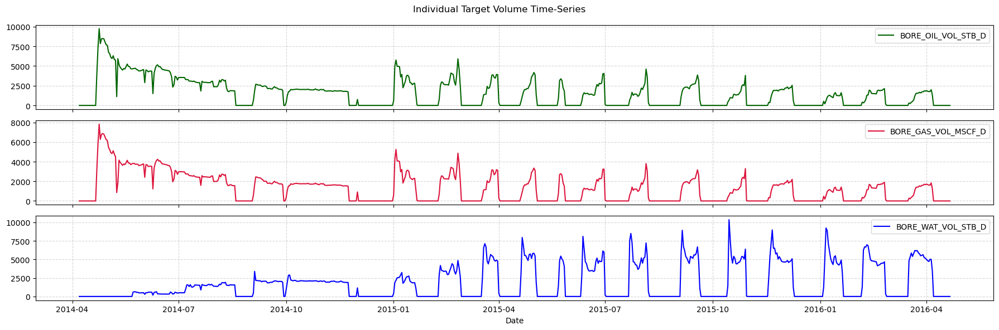

In [11]:
from basic_helper_functions import seperate_target_plot

seperate_target_plot(df_1[target_col])

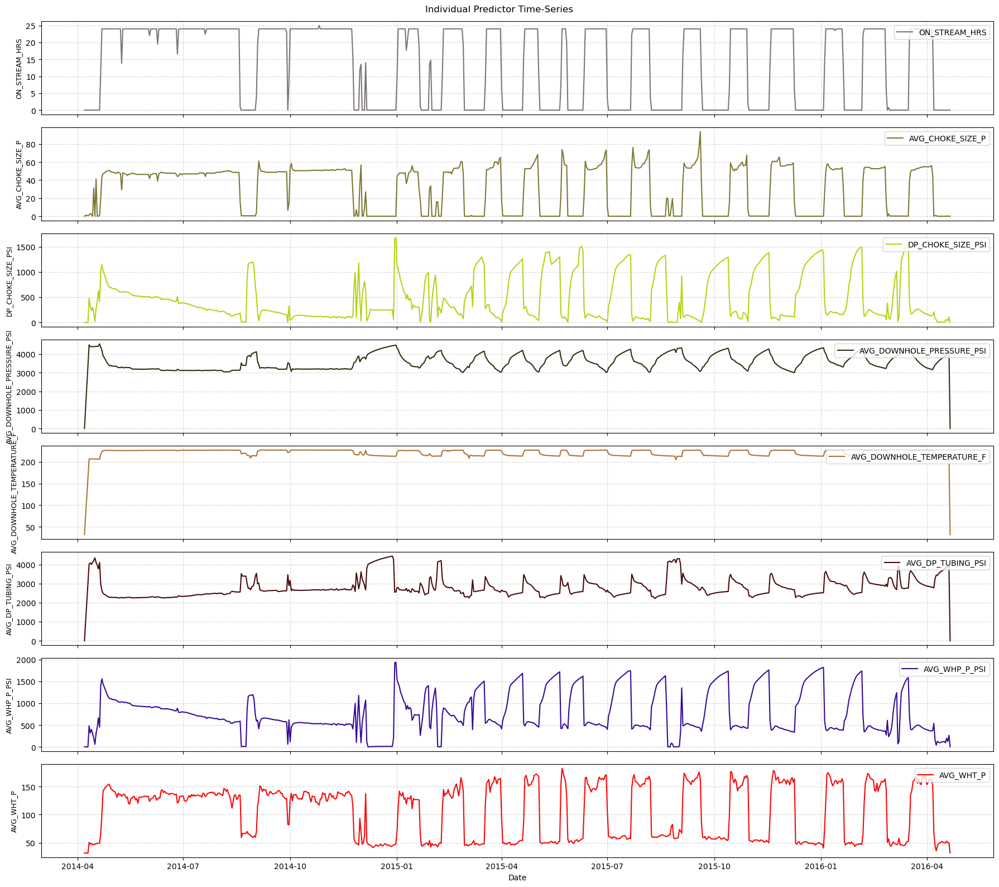

In [12]:
from basic_helper_functions import seperate_predictor_plot
seperate_predictor_plot(df_1, features=predictor_num_col)

## ETS Decomposition

Incorrect Period: If you choose a period that doesn't actually exist in the data, the algorithm still extracts a fake wave, but the Residual panel will still contain massive, highly structured spikes or waves. This means the model failed to capture the real underlying pattern.

Correct Period: When you hit the true operational frequency, the Residual panel will flatten out into random, unstructured noise (white noise). The spikes will disappear because the seasonal component successfully absorbed them.

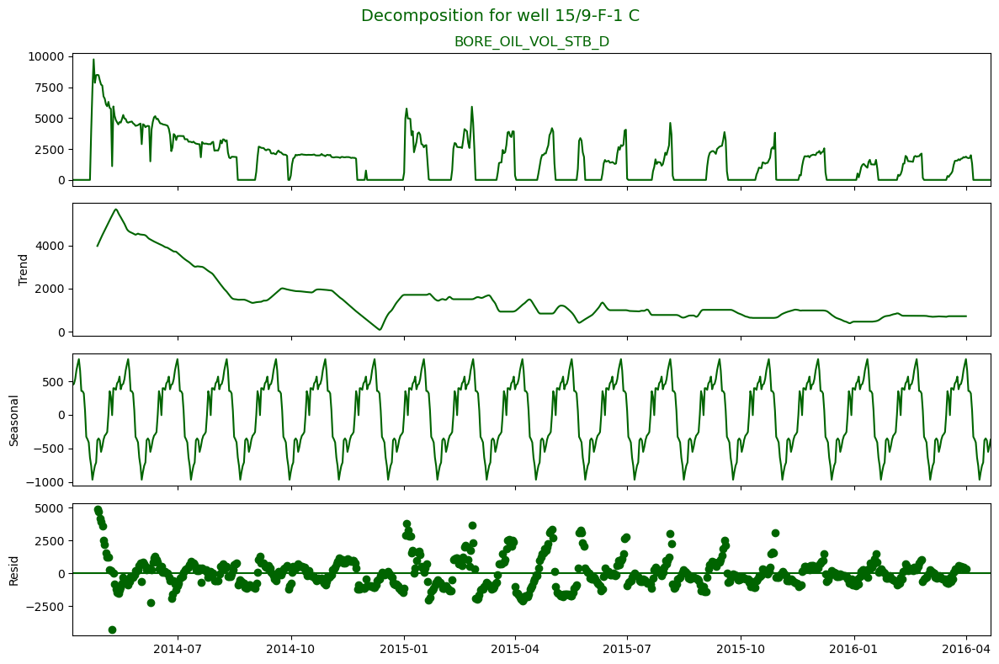

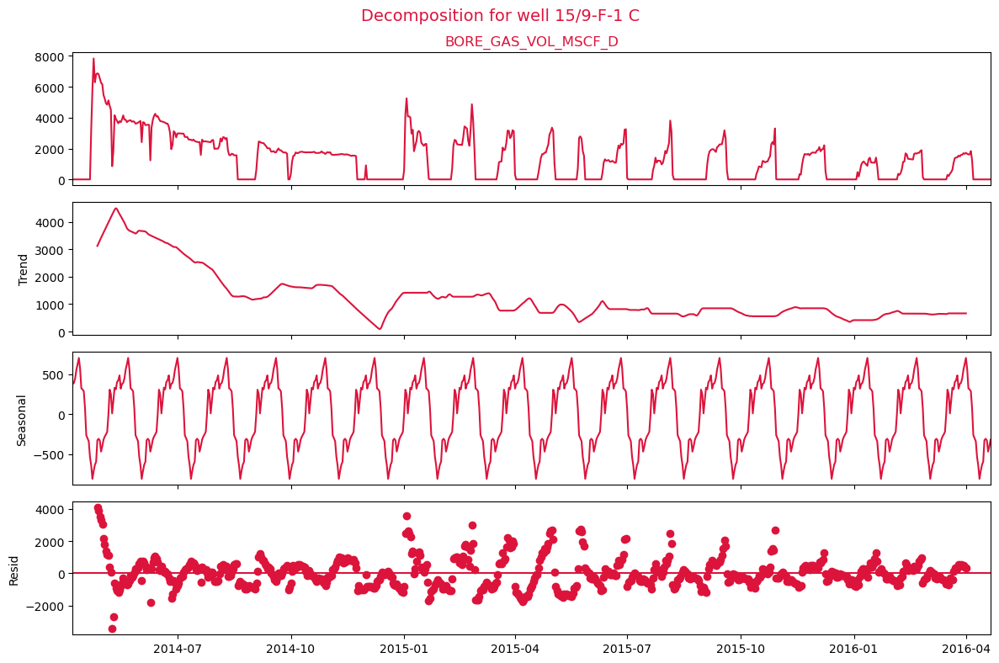

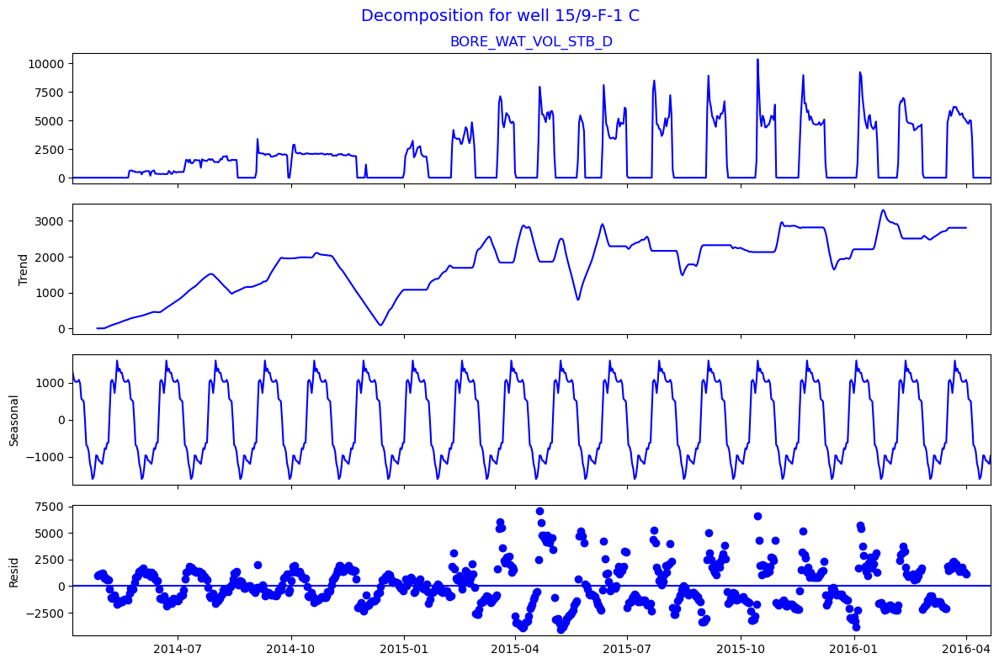

<Figure size 640x480 with 0 Axes>

In [13]:
from sarima_helper_functions import plot_decomposition 
plot_decomposition(df_1, target_col,model="additive", period=40)
plt.savefig('ets.png', dpi=300, bbox_inches='tight')

## ACF & PACF Plots and Monthly Plots

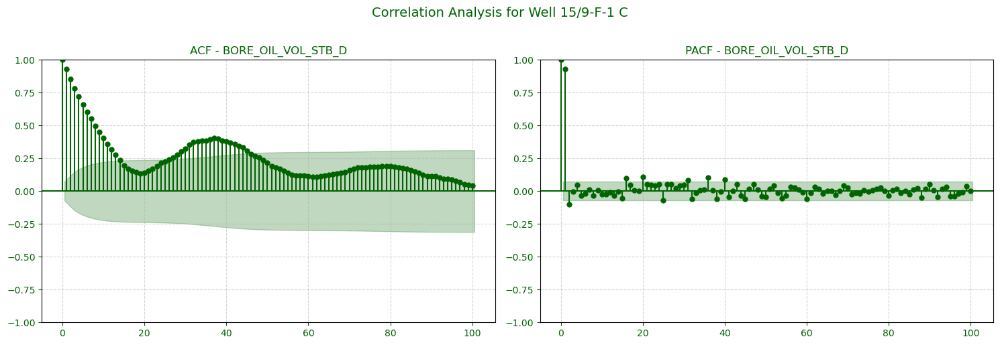

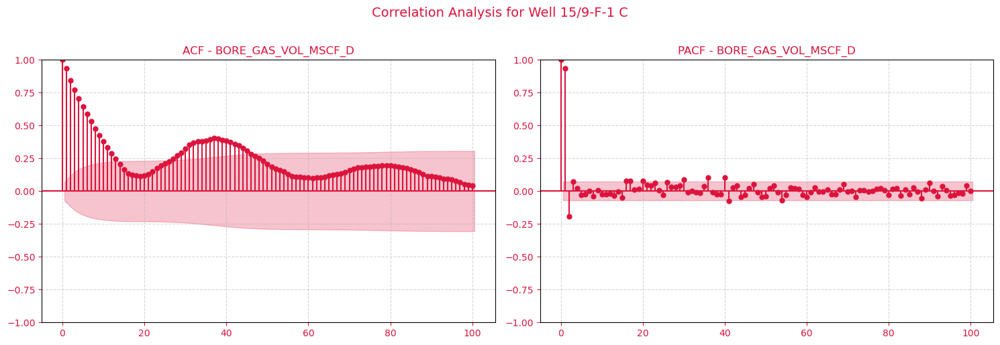

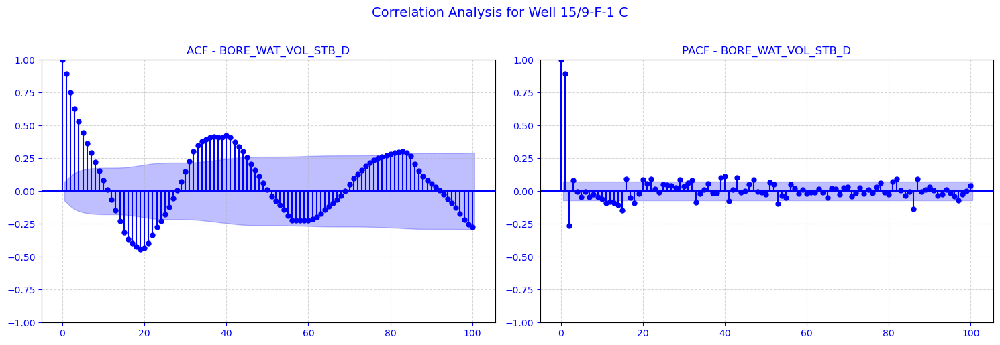

In [14]:
from sarima_helper_functions import plot_acf_pacf_channels
plot_acf_pacf_channels(df_1, target_col, lags=100)

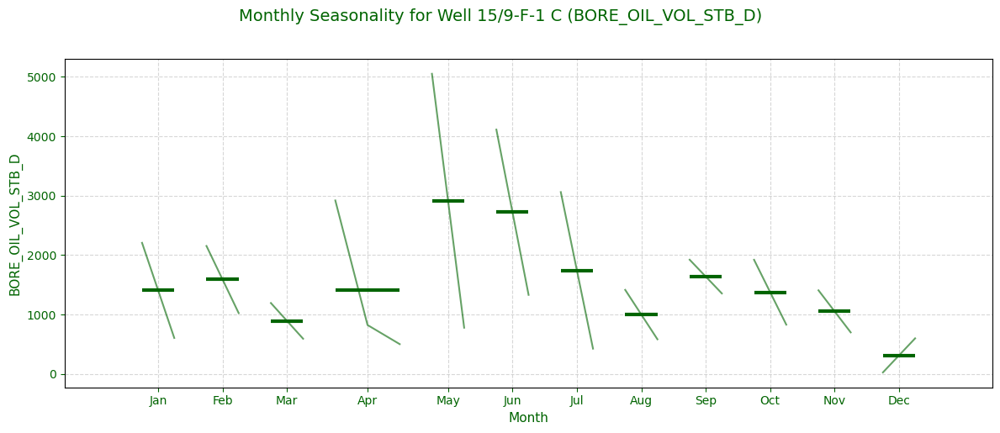

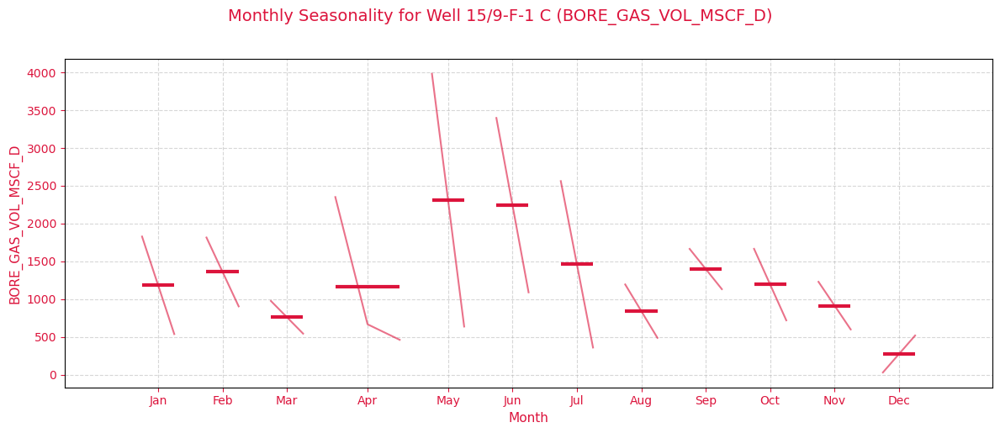

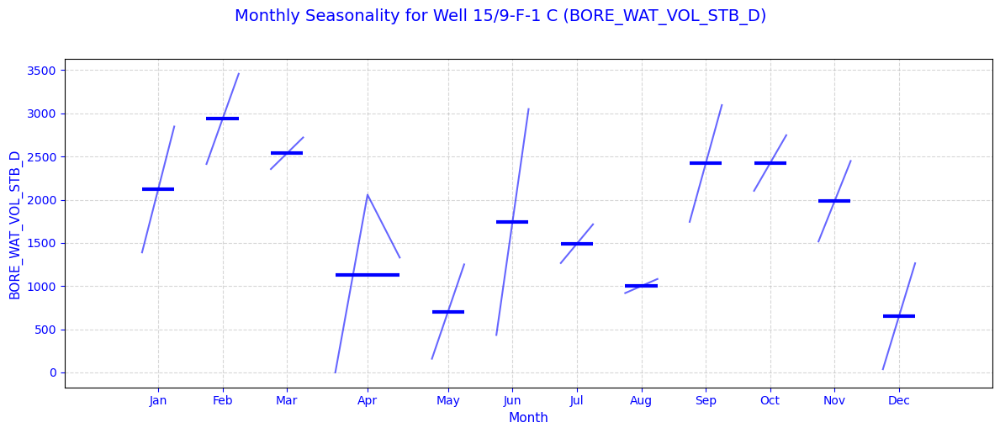

In [15]:
from sarima_helper_functions import plot_monthly_seasonality 

plot_monthly_seasonality(df_1, target_col)

## Find the best SARIMA model


In [16]:
from sarima_helper_functions import sarima_split_train_test_keep

train_data, val_data,test_data, keep_data=sarima_split_train_test_keep(df_1, 0.5,0.2,0.2)

start_of_val_date=val_data.index[0]
start_of_test_date=test_data.index[0]
start_of_keep_data=keep_data.index[0]
len(df_1)==len(train_data)+len(val_data)+len(test_data)+len(keep_data)

True

In [17]:
# optuna

In [18]:
models_dict = {}
order_dict={}

In [19]:
from sarima_helper_functions import find_best_sarima_model_for_all_phases_optuna 
find_best_sarima_model_for_all_phases_optuna(
    models_dict,
    order_dict,
    target_col,
    train_data,
    val_data,
    train_exog=None,
    test_exog=None,
    p_max=2,
    d_max=2,
    q_max=2,
    P_max=2,
    D_max=2,
    Q_max=1,
    seasonal_period=(7),
    n_trials=100,
    maxiter=50,
    )

[I 2026-06-25 15:53:47,192] A new study created in memory with name: no-name-e716d600-3e36-4449-9b54-3070036af045


  0%|          | 0/100 [00:00<?, ?it/s]

[I 2026-06-25 15:53:47,334] Trial 0 finished with value: 1478.379019117863 and parameters: {'p': 1, 'd': 2, 'q': 2, 'P': 1, 'D': 0, 'Q': 0, 'trend': 'n'}. Best is trial 0 with value: 1478.379019117863.
[I 2026-06-25 15:53:47,501] Trial 1 finished with value: 1357.619587992683 and parameters: {'p': 0, 'd': 2, 'q': 1, 'P': 2, 'D': 0, 'Q': 1, 'trend': 'n'}. Best is trial 1 with value: 1357.619587992683.
[I 2026-06-25 15:53:47,521] Trial 2 finished with value: 1510.6627030631746 and parameters: {'p': 2, 'd': 0, 'q': 0, 'P': 0, 'D': 0, 'Q': 1, 'trend': 'n'}. Best is trial 1 with value: 1357.619587992683.
[I 2026-06-25 15:53:47,532] Trial 3 finished with value: 1511.2147794027283 and parameters: {'p': 1, 'd': 0, 'q': 1, 'P': 0, 'D': 0, 'Q': 0, 'trend': 'n'}. Best is trial 1 with value: 1357.619587992683.
[I 2026-06-25 15:53:47,583] Trial 4 finished with value: 58213.556328052524 and parameters: {'p': 1, 'd': 2, 'q': 0, 'P': 1, 'D': 1, 'Q': 0, 'trend': 'n'}. Best is trial 1 with value: 1357.6

[I 2026-06-25 15:53:56,019] A new study created in memory with name: no-name-889f9364-9ecf-45b7-a159-43ed91c87b7f


[I 2026-06-25 15:53:55,911] Trial 99 finished with value: 1260.480439075785 and parameters: {'p': 1, 'd': 1, 'q': 0, 'P': 2, 'D': 0, 'Q': 1, 'trend': 'n'}. Best is trial 79 with value: 1260.480439075785.


  0%|          | 0/100 [00:00<?, ?it/s]

[I 2026-06-25 15:53:56,069] Trial 0 finished with value: 1511.212617730488 and parameters: {'p': 1, 'd': 2, 'q': 2, 'P': 1, 'D': 0, 'Q': 0, 'trend': 'n'}. Best is trial 0 with value: 1511.212617730488.
[I 2026-06-25 15:53:56,210] Trial 1 finished with value: 1510.9409335672506 and parameters: {'p': 0, 'd': 2, 'q': 1, 'P': 2, 'D': 0, 'Q': 1, 'trend': 'n'}. Best is trial 1 with value: 1510.9409335672506.
[I 2026-06-25 15:53:56,233] Trial 2 finished with value: 1511.2119732184308 and parameters: {'p': 2, 'd': 0, 'q': 0, 'P': 0, 'D': 0, 'Q': 1, 'trend': 'n'}. Best is trial 1 with value: 1510.9409335672506.
[I 2026-06-25 15:53:56,243] Trial 3 finished with value: 1511.2147794027287 and parameters: {'p': 1, 'd': 0, 'q': 1, 'P': 0, 'D': 0, 'Q': 0, 'trend': 'n'}. Best is trial 1 with value: 1510.9409335672506.
[I 2026-06-25 15:53:56,264] Trial 4 finished with value: 1511.8091481541069 and parameters: {'p': 1, 'd': 2, 'q': 0, 'P': 1, 'D': 1, 'Q': 0, 'trend': 'n'}. Best is trial 1 with value: 15

[I 2026-06-25 15:54:02,193] A new study created in memory with name: no-name-665c7a17-7b93-4306-9d25-4f00419daf96


[I 2026-06-25 15:54:01,992] Trial 96 finished with value: 1462.1445239740185 and parameters: {'p': 1, 'd': 0, 'q': 0, 'P': 0, 'D': 1, 'Q': 1, 'trend': 'n'}. Best is trial 60 with value: 1462.1445239740185.
[I 2026-06-25 15:54:02,043] Trial 97 finished with value: 1462.1445239740185 and parameters: {'p': 1, 'd': 0, 'q': 0, 'P': 0, 'D': 1, 'Q': 1, 'trend': 'n'}. Best is trial 60 with value: 1462.1445239740185.
[I 2026-06-25 15:54:02,093] Trial 98 finished with value: 1462.1445239740185 and parameters: {'p': 1, 'd': 0, 'q': 0, 'P': 0, 'D': 1, 'Q': 1, 'trend': 'n'}. Best is trial 60 with value: 1462.1445239740185.
[I 2026-06-25 15:54:02,143] Trial 99 finished with value: 1462.1445239740185 and parameters: {'p': 1, 'd': 0, 'q': 0, 'P': 0, 'D': 1, 'Q': 1, 'trend': 'n'}. Best is trial 60 with value: 1462.1445239740185.

15/9-F-1 C | BORE_OIL_VOL_STB_D
Normal RMSE: 1260.480439075785
Log RMSE:    1462.1445239740185


  0%|          | 0/100 [00:00<?, ?it/s]

[I 2026-06-25 15:54:02,299] Trial 0 finished with value: 1242.5929194601076 and parameters: {'p': 1, 'd': 2, 'q': 2, 'P': 1, 'D': 0, 'Q': 0, 'trend': 'n'}. Best is trial 0 with value: 1242.5929194601076.
[I 2026-06-25 15:54:02,459] Trial 1 finished with value: 1143.8315610919476 and parameters: {'p': 0, 'd': 2, 'q': 1, 'P': 2, 'D': 0, 'Q': 1, 'trend': 'n'}. Best is trial 1 with value: 1143.8315610919476.
[I 2026-06-25 15:54:02,481] Trial 2 finished with value: 1242.158230330527 and parameters: {'p': 2, 'd': 0, 'q': 0, 'P': 0, 'D': 0, 'Q': 1, 'trend': 'n'}. Best is trial 1 with value: 1143.8315610919476.
[I 2026-06-25 15:54:02,490] Trial 3 finished with value: 1242.6193075136696 and parameters: {'p': 1, 'd': 0, 'q': 1, 'P': 0, 'D': 0, 'Q': 0, 'trend': 'n'}. Best is trial 1 with value: 1143.8315610919476.
[I 2026-06-25 15:54:02,547] Trial 4 finished with value: 30113.97423816887 and parameters: {'p': 1, 'd': 2, 'q': 0, 'P': 1, 'D': 1, 'Q': 0, 'trend': 'n'}. Best is trial 1 with value: 11

[I 2026-06-25 15:54:12,084] A new study created in memory with name: no-name-e32eb792-f94b-456f-81c1-5443ac10ae82


[I 2026-06-25 15:54:11,983] Trial 99 finished with value: 1034.906040846869 and parameters: {'p': 0, 'd': 1, 'q': 1, 'P': 2, 'D': 0, 'Q': 1, 'trend': 'n'}. Best is trial 59 with value: 1034.906040846869.


  0%|          | 0/100 [00:00<?, ?it/s]

[I 2026-06-25 15:54:12,139] Trial 0 finished with value: 1242.6167624751836 and parameters: {'p': 1, 'd': 2, 'q': 2, 'P': 1, 'D': 0, 'Q': 0, 'trend': 'n'}. Best is trial 0 with value: 1242.6167624751836.
[I 2026-06-25 15:54:12,291] Trial 1 finished with value: 1242.364518565002 and parameters: {'p': 0, 'd': 2, 'q': 1, 'P': 2, 'D': 0, 'Q': 1, 'trend': 'n'}. Best is trial 1 with value: 1242.364518565002.
[I 2026-06-25 15:54:12,315] Trial 2 finished with value: 1242.6164402045629 and parameters: {'p': 2, 'd': 0, 'q': 0, 'P': 0, 'D': 0, 'Q': 1, 'trend': 'n'}. Best is trial 1 with value: 1242.364518565002.
[I 2026-06-25 15:54:12,325] Trial 3 finished with value: 1242.6193075394656 and parameters: {'p': 1, 'd': 0, 'q': 1, 'P': 0, 'D': 0, 'Q': 0, 'trend': 'n'}. Best is trial 1 with value: 1242.364518565002.
[I 2026-06-25 15:54:12,346] Trial 4 finished with value: 1243.2156901728483 and parameters: {'p': 1, 'd': 2, 'q': 0, 'P': 1, 'D': 1, 'Q': 0, 'trend': 'n'}. Best is trial 1 with value: 1242

[I 2026-06-25 15:54:19,404] A new study created in memory with name: no-name-0749e134-89a9-4ec7-ab04-7c9f3bc8f6b5


[I 2026-06-25 15:54:19,239] Trial 97 finished with value: 1242.3018634668294 and parameters: {'p': 1, 'd': 1, 'q': 0, 'P': 1, 'D': 0, 'Q': 1, 'trend': 'n'}. Best is trial 26 with value: 1242.237709911098.
[I 2026-06-25 15:54:19,277] Trial 98 finished with value: 1242.2603810682717 and parameters: {'p': 2, 'd': 1, 'q': 0, 'P': 1, 'D': 0, 'Q': 1, 'trend': 'n'}. Best is trial 26 with value: 1242.237709911098.
[I 2026-06-25 15:54:19,315] Trial 99 finished with value: 1242.2603810682717 and parameters: {'p': 2, 'd': 1, 'q': 0, 'P': 1, 'D': 0, 'Q': 1, 'trend': 'n'}. Best is trial 26 with value: 1242.237709911098.

15/9-F-1 C | BORE_GAS_VOL_MSCF_D
Normal RMSE: 1034.906040846869
Log RMSE:    1242.237709911098


  0%|          | 0/100 [00:00<?, ?it/s]

[I 2026-06-25 15:54:19,469] Trial 0 finished with value: 3456.3268890165114 and parameters: {'p': 1, 'd': 2, 'q': 2, 'P': 1, 'D': 0, 'Q': 0, 'trend': 'n'}. Best is trial 0 with value: 3456.3268890165114.
[I 2026-06-25 15:54:19,598] Trial 1 finished with value: 3003.3033165632737 and parameters: {'p': 0, 'd': 2, 'q': 1, 'P': 2, 'D': 0, 'Q': 1, 'trend': 'n'}. Best is trial 1 with value: 3003.3033165632737.
[I 2026-06-25 15:54:19,618] Trial 2 finished with value: 3438.179198273701 and parameters: {'p': 2, 'd': 0, 'q': 0, 'P': 0, 'D': 0, 'Q': 1, 'trend': 'n'}. Best is trial 1 with value: 3003.3033165632737.
[I 2026-06-25 15:54:19,628] Trial 3 finished with value: 3439.7944573296577 and parameters: {'p': 1, 'd': 0, 'q': 1, 'P': 0, 'D': 0, 'Q': 0, 'trend': 'n'}. Best is trial 1 with value: 3003.3033165632737.
[I 2026-06-25 15:54:19,690] Trial 4 finished with value: 7931.5160948899675 and parameters: {'p': 1, 'd': 2, 'q': 0, 'P': 1, 'D': 1, 'Q': 0, 'trend': 'n'}. Best is trial 1 with value: 3

[I 2026-06-25 15:54:32,276] A new study created in memory with name: no-name-2e9a32d5-7965-4cd0-b598-449154cab578


[I 2026-06-25 15:54:32,175] Trial 99 finished with value: 2848.1753199139753 and parameters: {'p': 1, 'd': 1, 'q': 2, 'P': 0, 'D': 0, 'Q': 0, 'trend': 'n'}. Best is trial 39 with value: 2783.4475351910846.


  0%|          | 0/100 [00:00<?, ?it/s]

[I 2026-06-25 15:54:32,309] Trial 0 finished with value: 3439.793971923022 and parameters: {'p': 1, 'd': 2, 'q': 2, 'P': 1, 'D': 0, 'Q': 0, 'trend': 'n'}. Best is trial 0 with value: 3439.793971923022.
[I 2026-06-25 15:54:32,389] Trial 1 finished with value: 3439.506845064178 and parameters: {'p': 0, 'd': 2, 'q': 1, 'P': 2, 'D': 0, 'Q': 1, 'trend': 'n'}. Best is trial 1 with value: 3439.506845064178.
[I 2026-06-25 15:54:32,413] Trial 2 finished with value: 3439.791968357697 and parameters: {'p': 2, 'd': 0, 'q': 0, 'P': 0, 'D': 0, 'Q': 1, 'trend': 'n'}. Best is trial 1 with value: 3439.506845064178.
[I 2026-06-25 15:54:32,424] Trial 3 finished with value: 3439.794458941542 and parameters: {'p': 1, 'd': 0, 'q': 1, 'P': 0, 'D': 0, 'Q': 0, 'trend': 'n'}. Best is trial 1 with value: 3439.506845064178.
[I 2026-06-25 15:54:32,445] Trial 4 finished with value: 3440.420993085083 and parameters: {'p': 1, 'd': 2, 'q': 0, 'P': 1, 'D': 1, 'Q': 0, 'trend': 'n'}. Best is trial 1 with value: 3439.5068

({'15/9-F-1 C_BORE_OIL_VOL_STB_D_sarima_model': <statsmodels.tsa.statespace.sarimax.SARIMAXResultsWrapper at 0x7cb54f3d61d0>,
  '15/9-F-1 C_BORE_GAS_VOL_MSCF_D_sarima_model': <statsmodels.tsa.statespace.sarimax.SARIMAXResultsWrapper at 0x7cb54f62bc90>,
  '15/9-F-1 C_BORE_WAT_VOL_STB_D_sarima_model': <statsmodels.tsa.statespace.sarimax.SARIMAXResultsWrapper at 0x7cb54f682550>},
 {'15/9-F-1 C_BORE_OIL_VOL_STB_D_sarima_model_order': {'order': (1, 1, 0),
   'seasonal_order': (2, 0, 1, 7),
   'log_transform': False,
   'rmse': np.float64(1260.480439075785)},
  '15/9-F-1 C_BORE_GAS_VOL_MSCF_D_sarima_model_order': {'order': (0, 1, 1),
   'seasonal_order': (2, 0, 1, 7),
   'log_transform': False,
   'rmse': np.float64(1034.906040846869)},
  '15/9-F-1 C_BORE_WAT_VOL_STB_D_sarima_model_order': {'order': (1, 1, 2),
   'seasonal_order': (2, 0, 0, 7),
   'log_transform': False,
   'rmse': np.float64(2783.4475351910846)}})

In [20]:
models_dict

{'15/9-F-1 C_BORE_OIL_VOL_STB_D_sarima_model': <statsmodels.tsa.statespace.sarimax.SARIMAXResultsWrapper at 0x7cb54f3d61d0>,
 '15/9-F-1 C_BORE_GAS_VOL_MSCF_D_sarima_model': <statsmodels.tsa.statespace.sarimax.SARIMAXResultsWrapper at 0x7cb54f62bc90>,
 '15/9-F-1 C_BORE_WAT_VOL_STB_D_sarima_model': <statsmodels.tsa.statespace.sarimax.SARIMAXResultsWrapper at 0x7cb54f682550>}

In [21]:
order_dict

{'15/9-F-1 C_BORE_OIL_VOL_STB_D_sarima_model_order': {'order': (1, 1, 0),
  'seasonal_order': (2, 0, 1, 7),
  'log_transform': False,
  'rmse': np.float64(1260.480439075785)},
 '15/9-F-1 C_BORE_GAS_VOL_MSCF_D_sarima_model_order': {'order': (0, 1, 1),
  'seasonal_order': (2, 0, 1, 7),
  'log_transform': False,
  'rmse': np.float64(1034.906040846869)},
 '15/9-F-1 C_BORE_WAT_VOL_STB_D_sarima_model_order': {'order': (1, 1, 2),
  'seasonal_order': (2, 0, 0, 7),
  'log_transform': False,
  'rmse': np.float64(2783.4475351910846)}}

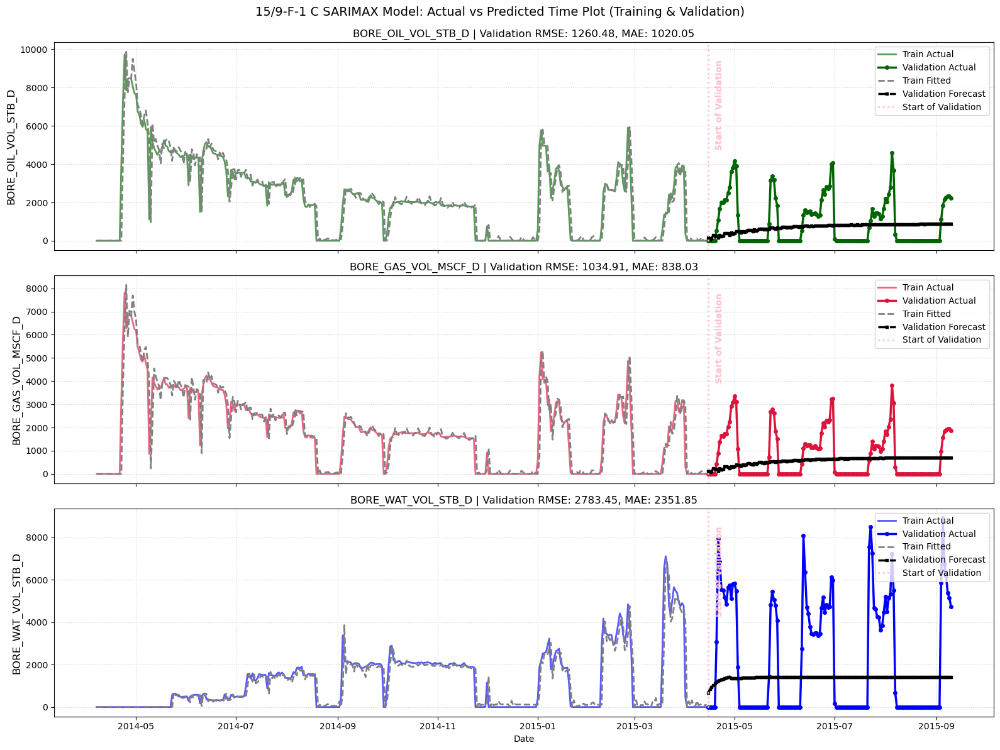

In [23]:
#Time plot


# ploting train and validation
data=pd.concat([train_data, val_data])

# 1. Create a single figure with 3 rows of subplots sharing the same X-axis (Dates)
fig, axes = plt.subplots(nrows=3, ncols=1, figsize=(16, 12), sharex=True)

oil_test_actual_plot=plot_train_val_predictions_time(
                                                    train_data=train_data,
                                                    val_data=val_data,
                                                    phase_string="BORE_OIL_VOL_STB_D",
                                                    model=models_dict["15/9-F-1 C_BORE_OIL_VOL_STB_D_sarima_model"],
                                                    log_transform=False,
                                                    transform_type="log1p",
                                                    ax=axes[0],
                                                    start_of_val_date=start_of_val_date )
gas_test_actual_plot=plot_train_val_predictions_time(
                                                    train_data=train_data,
                                                    val_data=val_data,
                                                    phase_string="BORE_GAS_VOL_MSCF_D",
                                                    model=models_dict["15/9-F-1 C_BORE_GAS_VOL_MSCF_D_sarima_model"],
                                                    log_transform=False,
                                                    transform_type="log1p",
                                                    ax=axes[1],
                                                    start_of_val_date=start_of_val_date )
water_test_actual_plot=plot_train_val_predictions_time(
                                                    train_data=train_data,
                                                    val_data=val_data,
                                                    phase_string="BORE_WAT_VOL_STB_D",
                                                    model=models_dict["15/9-F-1 C_BORE_WAT_VOL_STB_D_sarima_model"],
                                                    log_transform=False,
                                                    transform_type="log1p",
                                                    ax=axes[2],
                                                    start_of_val_date=start_of_val_date)

# 5. Format and save the combined master plot
axes[-1].set_xlabel('Date')  # Label the bottom X-axis
fig.suptitle(f'{df_1["NPD_WELL_BORE_NAME"].iloc[0]} SARIMAX Model: Actual vs Predicted Time Plot (Training & Validation)', fontsize=14, y=0.99)
plt.tight_layout()

# Save the unified plot directly to disk
safe_well_name = str(df_1["NPD_WELL_BORE_NAME"].iloc[0]).replace('/', '-')
file_path = f'pictures/{safe_well_name}_sarima_predictions_time_plot.png'
fig.savefig(file_path, dpi=300, bbox_inches='tight')
plt.show()

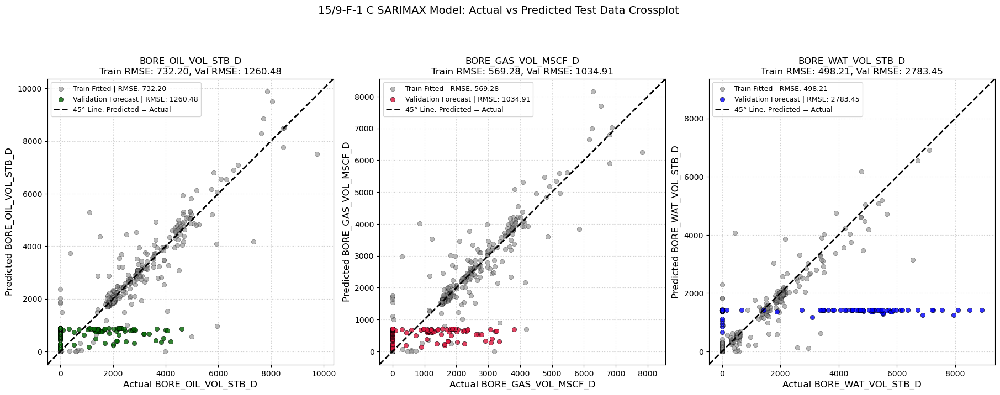

In [25]:
#Prediction vs actual plot


# ploting train and validation
data=pd.concat([val_data])

# 1. Create a single figure with 3 rows of subplots sharing the same X-axis (Dates)
fig, axes = plt.subplots(nrows=1, ncols=3, figsize=(18, 8), sharex=False,constrained_layout=True)

oil_test_actual_plot=plot_train_val_actual_vs_predicted_crossplot(
                                              train_data,
                                              val_data,
                                              phase_string="BORE_OIL_VOL_STB_D" ,# 'BORE_OIL_VOL_STB_D', BORE_GAS_VOL_MSCF_D, BORE_WAT_VOL_STB_D,
                                              model=models_dict["15/9-F-1 C_BORE_OIL_VOL_STB_D_sarima_model"],
                                              val_exog=None,
                                              log_transform=False,
                                              transform_type="log1p",
                                              ax=axes[0]
                                                       )
gas_test_actual_plot=plot_train_val_actual_vs_predicted_crossplot(
                                              train_data,
                                              val_data,
                                              phase_string="BORE_GAS_VOL_MSCF_D" ,# 'BORE_OIL_VOL_STB_D', BORE_GAS_VOL_MSCF_D, BORE_WAT_VOL_STB_D,
                                              model=models_dict['15/9-F-1 C_BORE_GAS_VOL_MSCF_D_sarima_model'],
                                              val_exog=None,
                                              log_transform=False,
                                              transform_type="log1p", 
                                              ax=axes[1]
                                                       )
water_test_actual_plot=plot_train_val_actual_vs_predicted_crossplot(
                                              train_data,
                                              val_data,
                                              phase_string="BORE_WAT_VOL_STB_D" ,# 'BORE_OIL_VOL_STB_D', BORE_GAS_VOL_MSCF_D, BORE_WAT_VOL_STB_D,
                                              model=models_dict['15/9-F-1 C_BORE_WAT_VOL_STB_D_sarima_model'],
                                              val_exog=None,
                                              log_transform=False,
                                              transform_type="log1p", 
                                              ax=axes[2]
                                                         )

# 5. Format and save the combined master plot
#axes[-1].set_xlabel('Date')  # Label the bottom X-axis
fig.suptitle(f'{df_1["NPD_WELL_BORE_NAME"].iloc[0]} SARIMAX Model: Actual vs Predicted Test Data Crossplot ', fontsize=14, y=0.99)
#plt.tight_layout()

# Save the unified plot directly to disk
safe_well_name = str(df_1["NPD_WELL_BORE_NAME"].iloc[0]).replace('/', '-')
file_path = f'pictures/{safe_well_name}_sarima_predictions_crossplot.png'
fig.savefig(file_path, dpi=300, bbox_inches='tight')
plt.show()

# DF 2

In [26]:
df_2.head()

,WELL_BORE_CODE,NPD_WELL_BORE_CODE,NPD_WELL_BORE_NAME,NPD_FIELD_CODE,NPD_FIELD_NAME,NPD_FACILITY_CODE,NPD_FACILITY_NAME,ON_STREAM_HRS,AVG_CHOKE_SIZE_P,AVG_CHOKE_UOM,...,AVG_CHOKE_SIZE_P_WAS_MISSING,AVG_DOWNHOLE_PRESSURE_PSI_WAS_MISSING,AVG_DOWNHOLE_TEMPERATURE_F_WAS_MISSING,AVG_DP_TUBING_PSI_WAS_MISSING,AVG_ANNULUS_PRESS_PSI_WAS_MISSING,DP_CHOKE_SIZE_PSI_WAS_MISSING,AVG_WHP_P_PSI_WAS_MISSING,AVG_WHT_P_WAS_MISSING,GOR_MSCF/STB_WAS_MISSING,WCUT_WAS_MISSING
DATEPRD,,,,,,,,,,,,,,,,,,,,,
2013-07-08,NO 15/9-F-11 H,7078,15/9-F-11,3420717,VOLVE,369304,MÆRSK INSPIRER,0.0,0.0,%,...,0,0,0,0,0,0,0,0,1,1
2013-07-09,NO 15/9-F-11 H,7078,15/9-F-11,3420717,VOLVE,369304,MÆRSK INSPIRER,0.0,0.0,%,...,0,0,0,0,0,0,0,0,1,1
2013-07-10,NO 15/9-F-11 H,7078,15/9-F-11,3420717,VOLVE,369304,MÆRSK INSPIRER,0.0,0.0,%,...,1,1,1,1,1,1,1,1,1,1
2013-07-11,NO 15/9-F-11 H,7078,15/9-F-11,3420717,VOLVE,369304,MÆRSK INSPIRER,0.0,0.0,%,...,0,0,0,0,0,0,0,0,1,1
2013-07-12,NO 15/9-F-11 H,7078,15/9-F-11,3420717,VOLVE,369304,MÆRSK INSPIRER,0.0,0.0,%,...,1,1,1,1,1,1,1,1,1,1


In [27]:
target_col=['BORE_OIL_VOL_STB_D', 'BORE_GAS_VOL_MSCF_D','BORE_WAT_VOL_STB_D']
predictor_num_col=['ON_STREAM_HRS', 'AVG_CHOKE_SIZE_P',
       'DP_CHOKE_SIZE_PSI',
      'AVG_DOWNHOLE_PRESSURE_PSI', 'AVG_DOWNHOLE_TEMPERATURE_F',
       'AVG_DP_TUBING_PSI', 'AVG_ANNULUS_PRESS_PSI', 'AVG_WHP_P_PSI',
       'BORE_WI_VOL_STB_D', 'AVG_WHT_P']
predictor_cat_cols=['FLOW_KIND', 'WELL_TYPE']

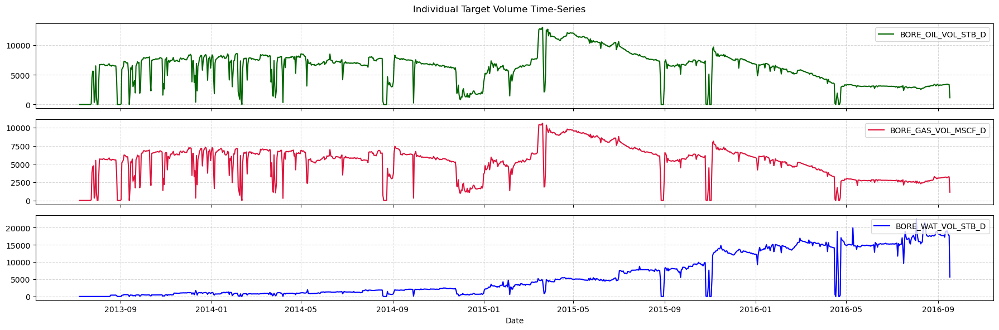

In [28]:
seperate_target_plot(df_2[target_col])

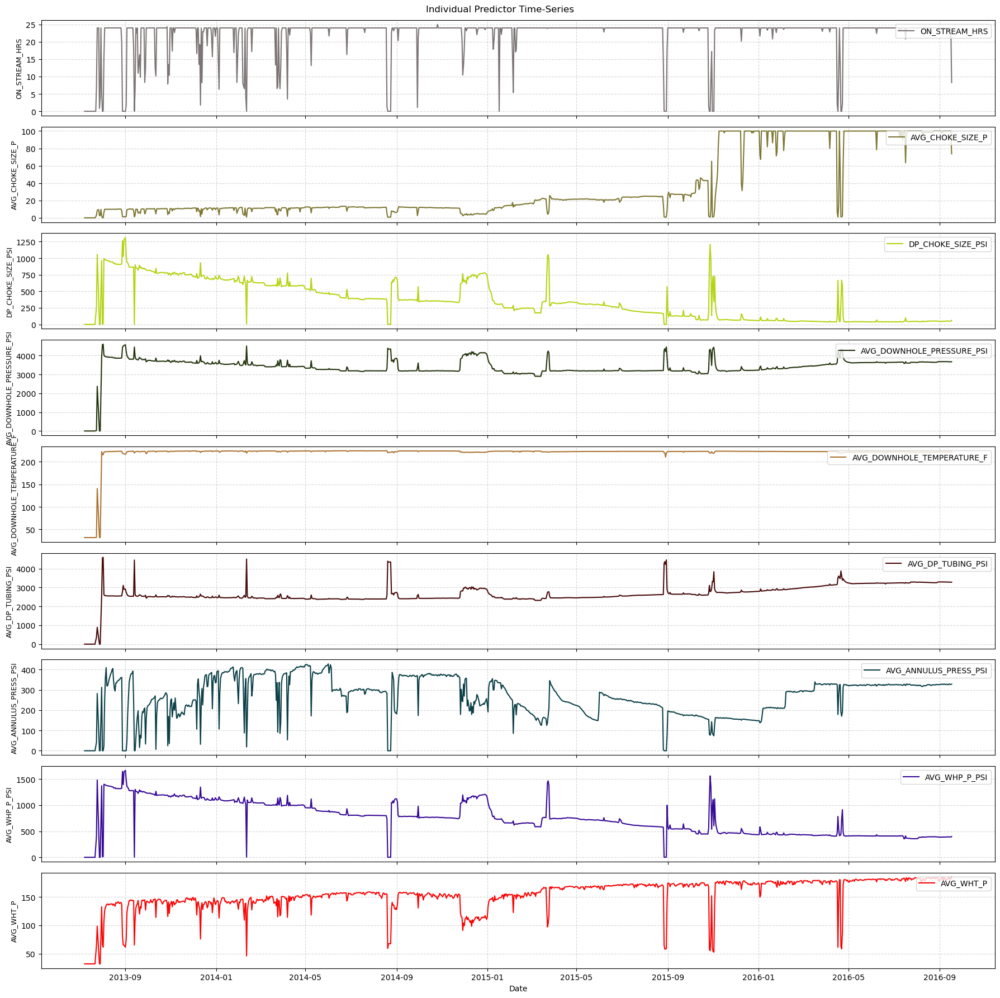

In [29]:
seperate_predictor_plot(df_2, features=predictor_num_col)

## ETS Decomposition

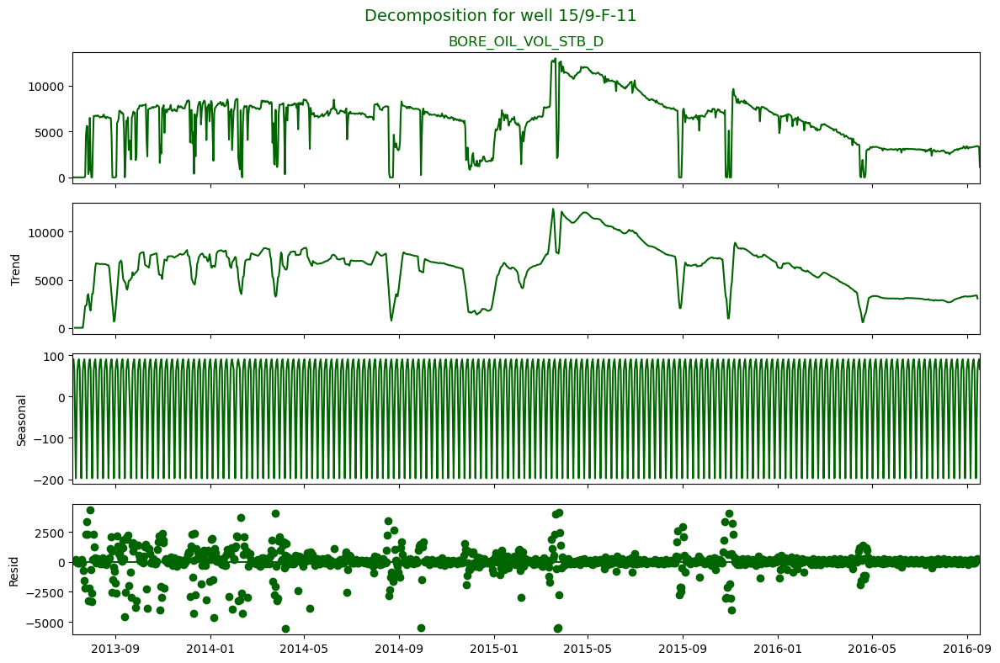

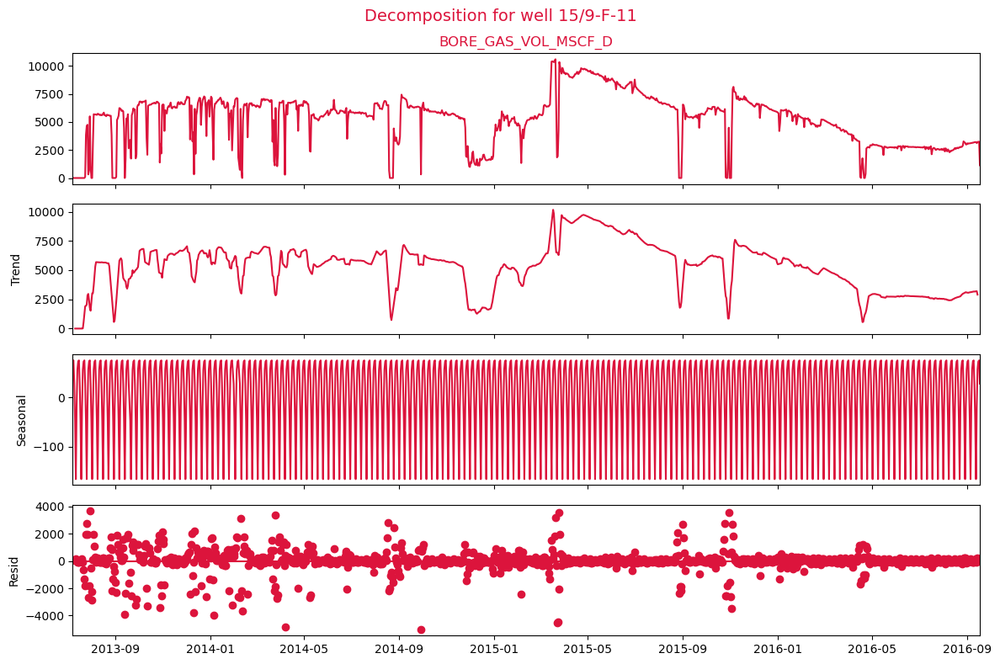

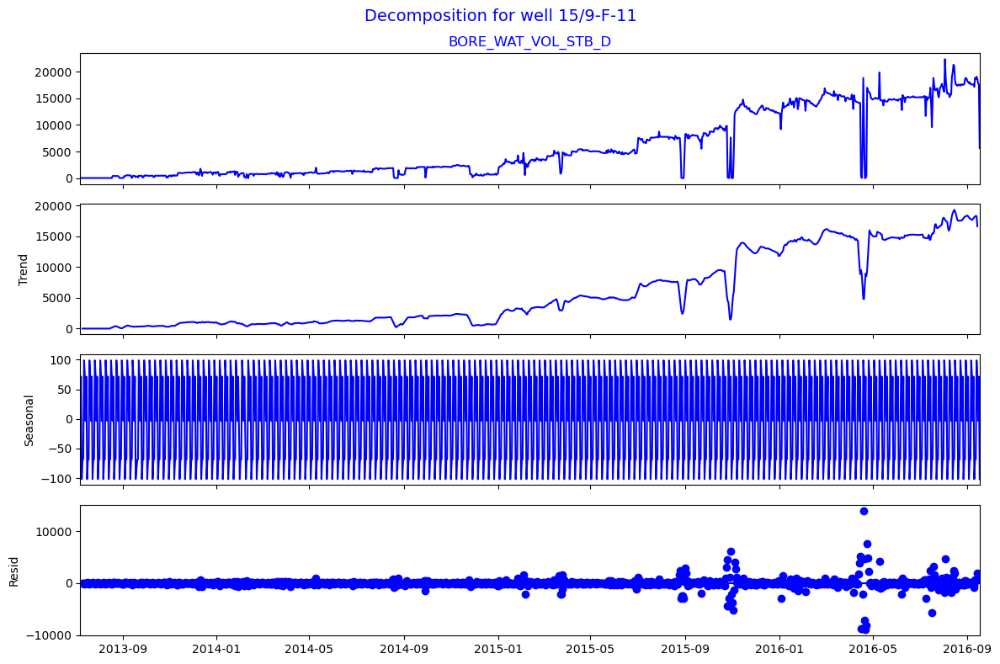

<Figure size 640x480 with 0 Axes>

In [30]:
plot_decomposition(df_2, target_col,model="additive", period=7)
plt.savefig('ets.png', dpi=300, bbox_inches='tight')

## ACF & PACF Plots and Monthly Plots

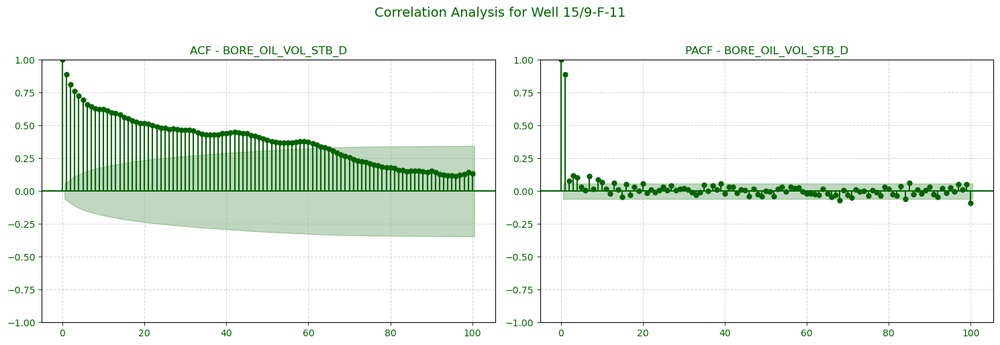

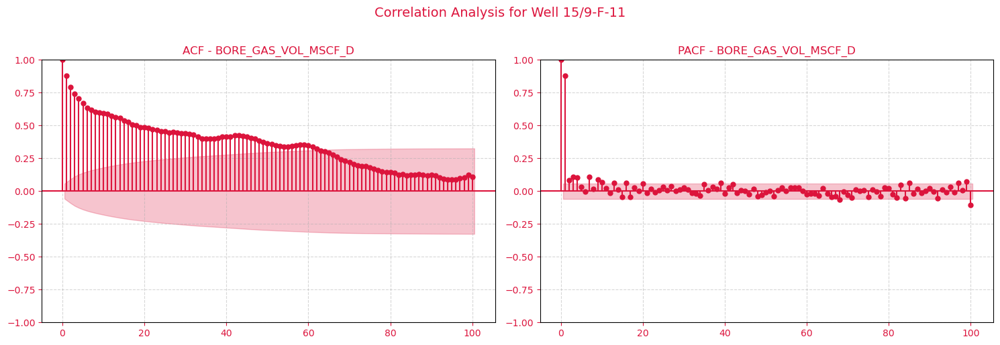

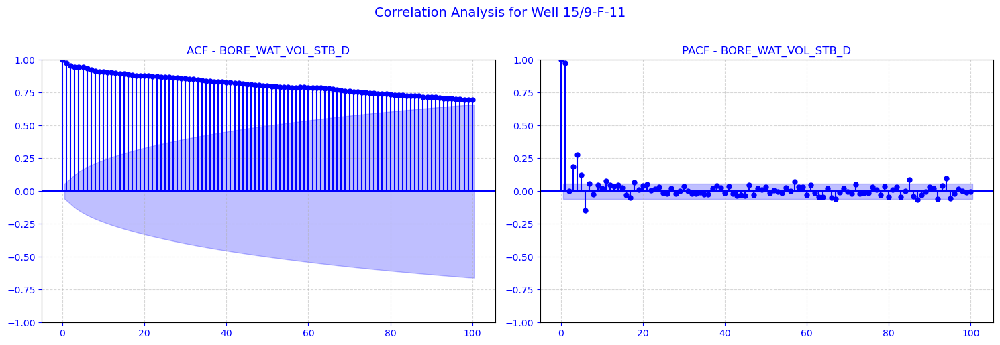

In [31]:
plot_acf_pacf_channels(df_2, target_col, lags=100)

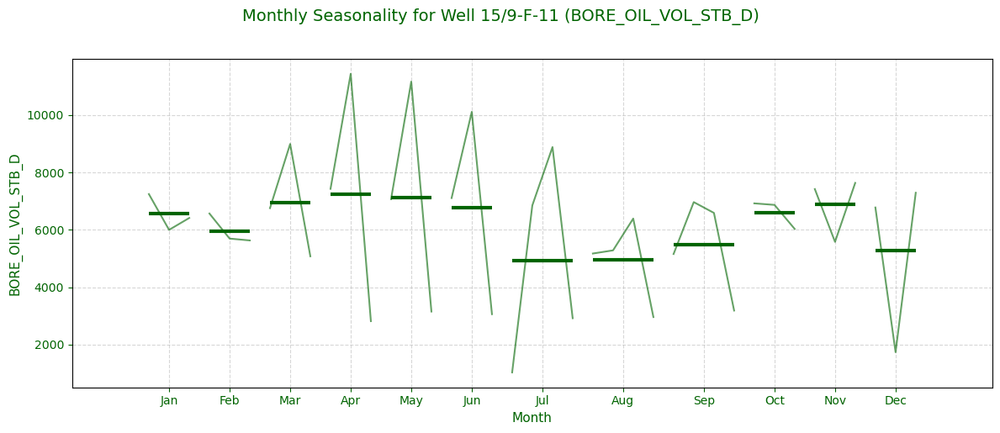

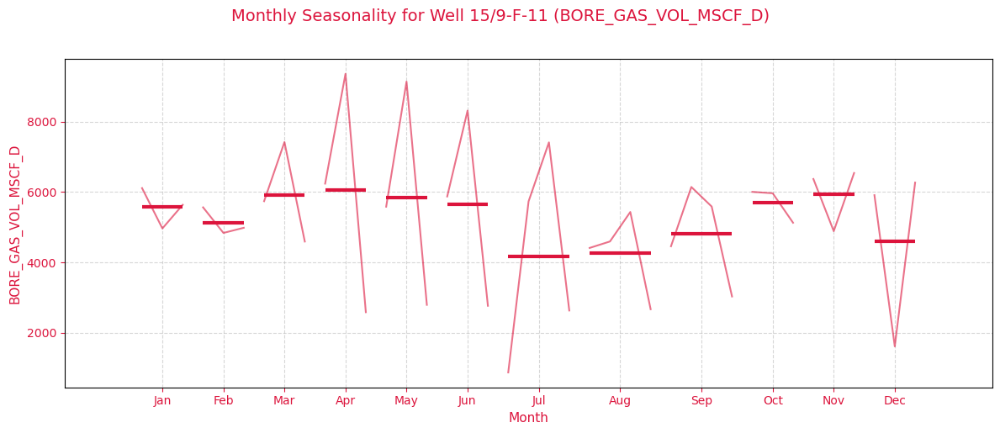

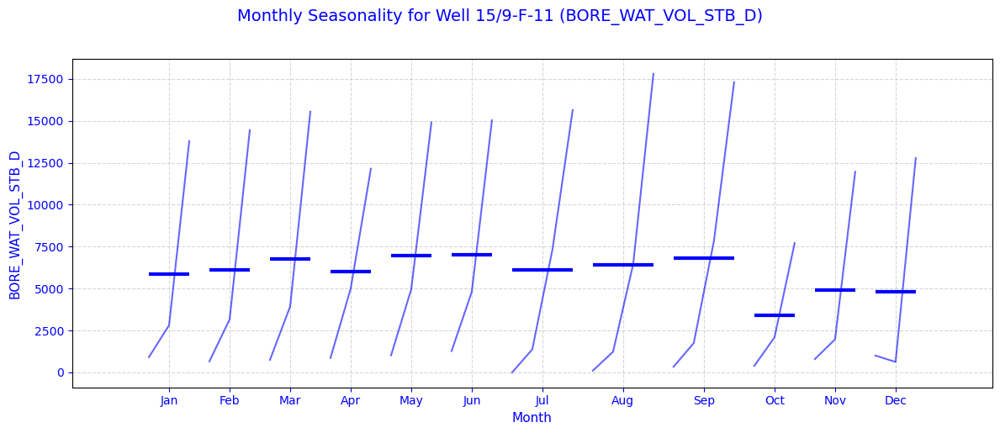

In [32]:
plot_monthly_seasonality(df_2, target_col)

## Find the best SARIMA model for Oil

In [33]:
train_data, val_data,test_data, keep_data=sarima_split_train_test_keep(df_2, 0.5,0.2,0.2)

start_of_val_date=val_data.index[0]
start_of_test_date=test_data.index[0]
start_of_keep_data=keep_data.index[0]
len(df_2)==len(train_data)+len(val_data)+len(test_data)+len(keep_data)

find_best_sarima_model_for_all_phases_optuna(
    models_dict,
    order_dict,
    target_col,
    train_data,
    val_data,
    train_exog=None,
    test_exog=None,
    p_max=2,
    d_max=2,
    q_max=2,
    P_max=2,
    D_max=2,
    Q_max=1,
    seasonal_period=(7),
    n_trials=100,
    maxiter=50,
    )

[I 2026-06-25 15:56:26,617] A new study created in memory with name: no-name-9246db55-062a-454a-87fe-2151859852e9


  0%|          | 0/100 [00:00<?, ?it/s]

[I 2026-06-25 15:56:26,756] Trial 0 finished with value: 4111.988899562164 and parameters: {'p': 1, 'd': 2, 'q': 2, 'P': 1, 'D': 0, 'Q': 0, 'trend': 'n'}. Best is trial 0 with value: 4111.988899562164.
[I 2026-06-25 15:56:26,834] Trial 1 finished with value: 3227.311205284656 and parameters: {'p': 0, 'd': 2, 'q': 1, 'P': 2, 'D': 0, 'Q': 1, 'trend': 'n'}. Best is trial 1 with value: 3227.311205284656.
[I 2026-06-25 15:56:26,861] Trial 2 finished with value: 8129.441291002531 and parameters: {'p': 2, 'd': 0, 'q': 0, 'P': 0, 'D': 0, 'Q': 1, 'trend': 'n'}. Best is trial 1 with value: 3227.311205284656.
[I 2026-06-25 15:56:26,874] Trial 3 finished with value: 7323.938649438092 and parameters: {'p': 1, 'd': 0, 'q': 1, 'P': 0, 'D': 0, 'Q': 0, 'trend': 'n'}. Best is trial 1 with value: 3227.311205284656.
[I 2026-06-25 15:56:26,951] Trial 4 finished with value: 1781032.396840739 and parameters: {'p': 1, 'd': 2, 'q': 0, 'P': 1, 'D': 1, 'Q': 0, 'trend': 'n'}. Best is trial 1 with value: 3227.3112

[I 2026-06-25 15:56:40,498] A new study created in memory with name: no-name-bedd3afa-c769-4434-871d-d8d71127c601


[I 2026-06-25 15:56:40,343] Trial 98 finished with value: 3227.311205284656 and parameters: {'p': 0, 'd': 2, 'q': 1, 'P': 2, 'D': 0, 'Q': 1, 'trend': 'n'}. Best is trial 1 with value: 3227.311205284656.
[I 2026-06-25 15:56:40,422] Trial 99 finished with value: 3227.311205284656 and parameters: {'p': 0, 'd': 2, 'q': 1, 'P': 2, 'D': 0, 'Q': 1, 'trend': 'n'}. Best is trial 1 with value: 3227.311205284656.


  0%|          | 0/100 [00:00<?, ?it/s]

[I 2026-06-25 15:56:40,576] Trial 0 finished with value: 70226.2218019735 and parameters: {'p': 1, 'd': 2, 'q': 2, 'P': 1, 'D': 0, 'Q': 0, 'trend': 'n'}. Best is trial 0 with value: 70226.2218019735.
[I 2026-06-25 15:56:40,674] Trial 1 finished with value: 67492.1149706622 and parameters: {'p': 0, 'd': 2, 'q': 1, 'P': 2, 'D': 0, 'Q': 1, 'trend': 'n'}. Best is trial 1 with value: 67492.1149706622.
[I 2026-06-25 15:56:40,717] Trial 2 finished with value: 8841.660904594524 and parameters: {'p': 2, 'd': 0, 'q': 0, 'P': 0, 'D': 0, 'Q': 1, 'trend': 'n'}. Best is trial 2 with value: 8841.660904594524.
[I 2026-06-25 15:56:40,741] Trial 3 finished with value: 8797.270259265111 and parameters: {'p': 1, 'd': 0, 'q': 1, 'P': 0, 'D': 0, 'Q': 0, 'trend': 'n'}. Best is trial 3 with value: 8797.270259265111.
[I 2026-06-25 15:56:40,769] Trial 4 finished with value: inf and parameters: {'p': 1, 'd': 2, 'q': 0, 'P': 1, 'D': 1, 'Q': 0, 'trend': 'n'}. Best is trial 3 with value: 8797.270259265111.
[I 2026-

[I 2026-06-25 15:57:10,373] A new study created in memory with name: no-name-800d4bfa-71b3-433d-b7a2-d78e01bab6a7



15/9-F-11 | BORE_OIL_VOL_STB_D
Normal RMSE: 3227.311205284656
Log RMSE:    4111.191019740416


  0%|          | 0/100 [00:00<?, ?it/s]

[I 2026-06-25 15:57:10,517] Trial 0 finished with value: 3319.25554351914 and parameters: {'p': 1, 'd': 2, 'q': 2, 'P': 1, 'D': 0, 'Q': 0, 'trend': 'n'}. Best is trial 0 with value: 3319.25554351914.
[I 2026-06-25 15:57:10,695] Trial 1 finished with value: 2470.731272269004 and parameters: {'p': 0, 'd': 2, 'q': 1, 'P': 2, 'D': 0, 'Q': 1, 'trend': 'n'}. Best is trial 1 with value: 2470.731272269004.
[I 2026-06-25 15:57:10,719] Trial 2 finished with value: 6688.032947704429 and parameters: {'p': 2, 'd': 0, 'q': 0, 'P': 0, 'D': 0, 'Q': 1, 'trend': 'n'}. Best is trial 1 with value: 2470.731272269004.
[I 2026-06-25 15:57:10,732] Trial 3 finished with value: 6005.62215967454 and parameters: {'p': 1, 'd': 0, 'q': 1, 'P': 0, 'D': 0, 'Q': 0, 'trend': 'n'}. Best is trial 1 with value: 2470.731272269004.
[I 2026-06-25 15:57:10,818] Trial 4 finished with value: 1467808.1654080166 and parameters: {'p': 1, 'd': 2, 'q': 0, 'P': 1, 'D': 1, 'Q': 0, 'trend': 'n'}. Best is trial 1 with value: 2470.731272

[I 2026-06-25 15:57:29,613] A new study created in memory with name: no-name-ab7caee1-850d-42a5-a165-99f43b4bc6d1


  0%|          | 0/100 [00:00<?, ?it/s]

[I 2026-06-25 15:57:29,858] Trial 0 finished with value: 4608.285116227857 and parameters: {'p': 1, 'd': 2, 'q': 2, 'P': 1, 'D': 0, 'Q': 0, 'trend': 'n'}. Best is trial 0 with value: 4608.285116227857.
[I 2026-06-25 15:57:30,114] Trial 1 finished with value: 154043.7441709879 and parameters: {'p': 0, 'd': 2, 'q': 1, 'P': 2, 'D': 0, 'Q': 1, 'trend': 'n'}. Best is trial 0 with value: 4608.285116227857.
[I 2026-06-25 15:57:30,161] Trial 2 finished with value: 7289.949641830647 and parameters: {'p': 2, 'd': 0, 'q': 0, 'P': 0, 'D': 0, 'Q': 1, 'trend': 'n'}. Best is trial 0 with value: 4608.285116227857.
[I 2026-06-25 15:57:30,185] Trial 3 finished with value: 7251.152257257521 and parameters: {'p': 1, 'd': 0, 'q': 1, 'P': 0, 'D': 0, 'Q': 0, 'trend': 'n'}. Best is trial 0 with value: 4608.285116227857.
[I 2026-06-25 15:57:30,210] Trial 4 finished with value: inf and parameters: {'p': 1, 'd': 2, 'q': 0, 'P': 1, 'D': 1, 'Q': 0, 'trend': 'n'}. Best is trial 0 with value: 4608.285116227857.
[I 2

[I 2026-06-25 15:57:44,961] A new study created in memory with name: no-name-c31df737-38da-444e-9aa4-acd247f67aca



15/9-F-11 | BORE_GAS_VOL_MSCF_D
Normal RMSE: 2470.731272269004
Log RMSE:    2893.21950044324


  0%|          | 0/100 [00:00<?, ?it/s]

[I 2026-06-25 15:57:45,093] Trial 0 finished with value: 2419.862405767364 and parameters: {'p': 1, 'd': 2, 'q': 2, 'P': 1, 'D': 0, 'Q': 0, 'trend': 'n'}. Best is trial 0 with value: 2419.862405767364.
[I 2026-06-25 15:57:45,341] Trial 1 finished with value: 1893.85186563992 and parameters: {'p': 0, 'd': 2, 'q': 1, 'P': 2, 'D': 0, 'Q': 1, 'trend': 'n'}. Best is trial 1 with value: 1893.85186563992.
[I 2026-06-25 15:57:45,373] Trial 2 finished with value: 5270.987717934465 and parameters: {'p': 2, 'd': 0, 'q': 0, 'P': 0, 'D': 0, 'Q': 1, 'trend': 'n'}. Best is trial 1 with value: 1893.85186563992.
[I 2026-06-25 15:57:45,387] Trial 3 finished with value: 4226.020283277657 and parameters: {'p': 1, 'd': 0, 'q': 1, 'P': 0, 'D': 0, 'Q': 0, 'trend': 'n'}. Best is trial 1 with value: 1893.85186563992.
[I 2026-06-25 15:57:45,436] Trial 4 finished with value: 1971677.3918192144 and parameters: {'p': 1, 'd': 2, 'q': 0, 'P': 1, 'D': 1, 'Q': 0, 'trend': 'n'}. Best is trial 1 with value: 1893.8518656

[I 2026-06-25 15:58:11,786] A new study created in memory with name: no-name-6adbd3ae-f7b8-4300-94e3-7787efd46ea6


  0%|          | 0/100 [00:00<?, ?it/s]

[I 2026-06-25 15:58:11,946] Trial 0 finished with value: 10784.241556475356 and parameters: {'p': 1, 'd': 2, 'q': 2, 'P': 1, 'D': 0, 'Q': 0, 'trend': 'n'}. Best is trial 0 with value: 10784.241556475356.
[I 2026-06-25 15:58:12,087] Trial 1 finished with value: 36065.19834391551 and parameters: {'p': 0, 'd': 2, 'q': 1, 'P': 2, 'D': 0, 'Q': 1, 'trend': 'n'}. Best is trial 0 with value: 10784.241556475356.
[I 2026-06-25 15:58:12,134] Trial 2 finished with value: 5677.431609815672 and parameters: {'p': 2, 'd': 0, 'q': 0, 'P': 0, 'D': 0, 'Q': 1, 'trend': 'n'}. Best is trial 2 with value: 5677.431609815672.
[I 2026-06-25 15:58:12,149] Trial 3 finished with value: 5591.109931712189 and parameters: {'p': 1, 'd': 0, 'q': 1, 'P': 0, 'D': 0, 'Q': 0, 'trend': 'n'}. Best is trial 3 with value: 5591.109931712189.
[I 2026-06-25 15:58:12,177] Trial 4 finished with value: inf and parameters: {'p': 1, 'd': 2, 'q': 0, 'P': 1, 'D': 1, 'Q': 0, 'trend': 'n'}. Best is trial 3 with value: 5591.109931712189.
[

({'15/9-F-1 C_BORE_OIL_VOL_STB_D_sarima_model': <statsmodels.tsa.statespace.sarimax.SARIMAXResultsWrapper at 0x7cb54f3d61d0>,
  '15/9-F-1 C_BORE_GAS_VOL_MSCF_D_sarima_model': <statsmodels.tsa.statespace.sarimax.SARIMAXResultsWrapper at 0x7cb54f62bc90>,
  '15/9-F-1 C_BORE_WAT_VOL_STB_D_sarima_model': <statsmodels.tsa.statespace.sarimax.SARIMAXResultsWrapper at 0x7cb54f682550>,
  '15/9-F-11_BORE_OIL_VOL_STB_D_sarima_model': <statsmodels.tsa.statespace.sarimax.SARIMAXResultsWrapper at 0x7cb544649d50>,
  '15/9-F-11_BORE_GAS_VOL_MSCF_D_sarima_model': <statsmodels.tsa.statespace.sarimax.SARIMAXResultsWrapper at 0x7cb5449e5490>,
  '15/9-F-11_BORE_WAT_VOL_STB_D_sarima_model': <statsmodels.tsa.statespace.sarimax.SARIMAXResultsWrapper at 0x7cb5449a2ed0>},
 {'15/9-F-1 C_BORE_OIL_VOL_STB_D_sarima_model_order': {'order': (1, 1, 0),
   'seasonal_order': (2, 0, 1, 7),
   'log_transform': False,
   'rmse': np.float64(1260.480439075785)},
  '15/9-F-1 C_BORE_GAS_VOL_MSCF_D_sarima_model_order': {'order':

In [34]:
models_dict

{'15/9-F-1 C_BORE_OIL_VOL_STB_D_sarima_model': <statsmodels.tsa.statespace.sarimax.SARIMAXResultsWrapper at 0x7cb54f3d61d0>,
 '15/9-F-1 C_BORE_GAS_VOL_MSCF_D_sarima_model': <statsmodels.tsa.statespace.sarimax.SARIMAXResultsWrapper at 0x7cb54f62bc90>,
 '15/9-F-1 C_BORE_WAT_VOL_STB_D_sarima_model': <statsmodels.tsa.statespace.sarimax.SARIMAXResultsWrapper at 0x7cb54f682550>,
 '15/9-F-11_BORE_OIL_VOL_STB_D_sarima_model': <statsmodels.tsa.statespace.sarimax.SARIMAXResultsWrapper at 0x7cb544649d50>,
 '15/9-F-11_BORE_GAS_VOL_MSCF_D_sarima_model': <statsmodels.tsa.statespace.sarimax.SARIMAXResultsWrapper at 0x7cb5449e5490>,
 '15/9-F-11_BORE_WAT_VOL_STB_D_sarima_model': <statsmodels.tsa.statespace.sarimax.SARIMAXResultsWrapper at 0x7cb5449a2ed0>}

In [35]:
order_dict

{'15/9-F-1 C_BORE_OIL_VOL_STB_D_sarima_model_order': {'order': (1, 1, 0),
  'seasonal_order': (2, 0, 1, 7),
  'log_transform': False,
  'rmse': np.float64(1260.480439075785)},
 '15/9-F-1 C_BORE_GAS_VOL_MSCF_D_sarima_model_order': {'order': (0, 1, 1),
  'seasonal_order': (2, 0, 1, 7),
  'log_transform': False,
  'rmse': np.float64(1034.906040846869)},
 '15/9-F-1 C_BORE_WAT_VOL_STB_D_sarima_model_order': {'order': (1, 1, 2),
  'seasonal_order': (2, 0, 0, 7),
  'log_transform': False,
  'rmse': np.float64(2783.4475351910846)},
 '15/9-F-11_BORE_OIL_VOL_STB_D_sarima_model_order': {'order': (0, 2, 1),
  'seasonal_order': (2, 0, 1, 7),
  'log_transform': False,
  'rmse': np.float64(3227.311205284656)},
 '15/9-F-11_BORE_GAS_VOL_MSCF_D_sarima_model_order': {'order': (0, 2, 1),
  'seasonal_order': (2, 0, 1, 7),
  'log_transform': False,
  'rmse': np.float64(2470.731272269004)},
 '15/9-F-11_BORE_WAT_VOL_STB_D_sarima_model_order': {'order': (1, 2, 1),
  'seasonal_order': (1, 1, 1, 7),
  'log_trans

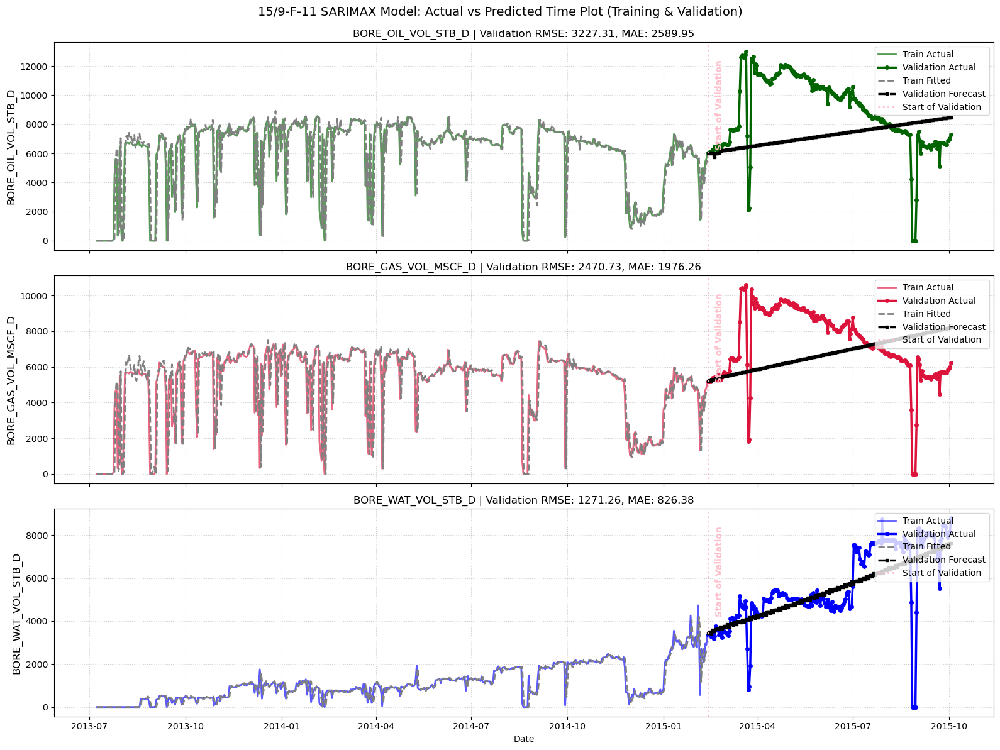

In [36]:
#Time plot


# ploting train and validation
data=pd.concat([train_data, val_data])

# 1. Create a single figure with 3 rows of subplots sharing the same X-axis (Dates)
fig, axes = plt.subplots(nrows=3, ncols=1, figsize=(16, 12), sharex=True)

oil_test_actual_plot=plot_train_val_predictions_time(
                                                    train_data=train_data,
                                                    val_data=val_data,
                                                    phase_string="BORE_OIL_VOL_STB_D",
                                                    model=models_dict["15/9-F-11_BORE_OIL_VOL_STB_D_sarima_model"],
                                                    log_transform=False,
                                                    transform_type="log1p",
                                                    ax=axes[0],
                                                    start_of_val_date=start_of_val_date )
gas_test_actual_plot=plot_train_val_predictions_time(
                                                    train_data=train_data,
                                                    val_data=val_data,
                                                    phase_string="BORE_GAS_VOL_MSCF_D",
                                                    model=models_dict["15/9-F-11_BORE_GAS_VOL_MSCF_D_sarima_model"],
                                                    log_transform=False,
                                                    transform_type="log1p",
                                                    ax=axes[1],
                                                    start_of_val_date=start_of_val_date )
water_test_actual_plot=plot_train_val_predictions_time(
                                                    train_data=train_data,
                                                    val_data=val_data,
                                                    phase_string="BORE_WAT_VOL_STB_D",
                                                    model=models_dict["15/9-F-11_BORE_WAT_VOL_STB_D_sarima_model"],
                                                    log_transform=False,
                                                    transform_type="log1p",
                                                    ax=axes[2],
                                                    start_of_val_date=start_of_val_date)

# 5. Format and save the combined master plot
axes[-1].set_xlabel('Date')  # Label the bottom X-axis
fig.suptitle(f'{df_2["NPD_WELL_BORE_NAME"].iloc[0]} SARIMAX Model: Actual vs Predicted Time Plot (Training & Validation)', fontsize=14, y=0.99)
plt.tight_layout()

# Save the unified plot directly to disk
safe_well_name = str(df_2["NPD_WELL_BORE_NAME"].iloc[0]).replace('/', '-')
file_path = f'pictures/{safe_well_name}_sarima_predictions_time_plot.png'
fig.savefig(file_path, dpi=300, bbox_inches='tight')
plt.show()

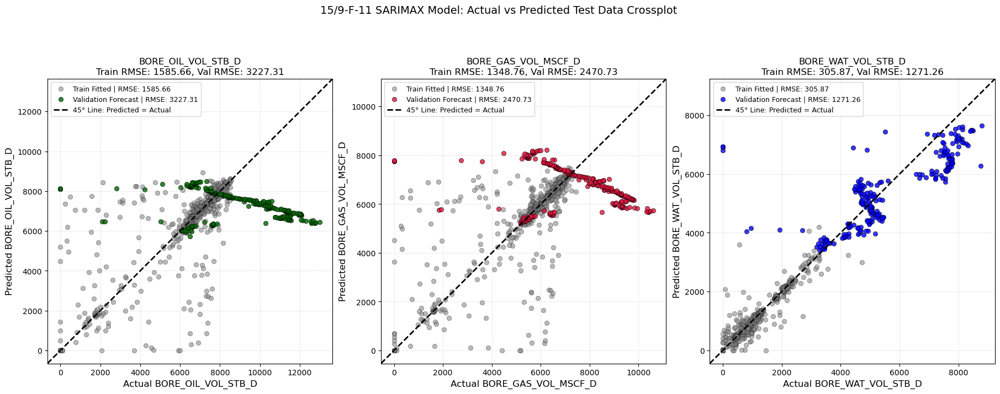

In [37]:
#Prediction vs actual plot


# ploting train and validation
data=pd.concat([train_data,val_data])

# 1. Create a single figure with 3 rows of subplots sharing the same X-axis (Dates)
fig, axes = plt.subplots(nrows=1, ncols=3, figsize=(18, 8), sharex=False,constrained_layout=True)

oil_test_actual_plot=plot_train_val_actual_vs_predicted_crossplot(
                                              train_data,
                                              val_data,
                                              phase_string="BORE_OIL_VOL_STB_D" ,# 'BORE_OIL_VOL_STB_D', BORE_GAS_VOL_MSCF_D, BORE_WAT_VOL_STB_D,
                                              model=models_dict["15/9-F-11_BORE_OIL_VOL_STB_D_sarima_model"],
                                              val_exog=None,
                                              log_transform=False,
                                              transform_type="log1p",
                                              ax=axes[0]
                                                       )
gas_test_actual_plot=plot_train_val_actual_vs_predicted_crossplot(
                                              train_data,
                                              val_data,
                                              phase_string="BORE_GAS_VOL_MSCF_D" ,# 'BORE_OIL_VOL_STB_D', BORE_GAS_VOL_MSCF_D, BORE_WAT_VOL_STB_D,
                                              model=models_dict['15/9-F-11_BORE_GAS_VOL_MSCF_D_sarima_model'],
                                              val_exog=None,
                                              log_transform=False,
                                              transform_type="log1p", 
                                              ax=axes[1]
                                                       )
water_test_actual_plot=plot_train_val_actual_vs_predicted_crossplot(
                                              train_data,
                                              val_data,
                                              phase_string="BORE_WAT_VOL_STB_D" ,# 'BORE_OIL_VOL_STB_D', BORE_GAS_VOL_MSCF_D, BORE_WAT_VOL_STB_D,
                                              model=models_dict['15/9-F-11_BORE_WAT_VOL_STB_D_sarima_model'],
                                              val_exog=None,
                                              log_transform=False,
                                              transform_type="log1p", 
                                              ax=axes[2]
                                                         )

# 5. Format and save the combined master plot
#axes[-1].set_xlabel('Date')  # Label the bottom X-axis
fig.suptitle(f'{df_2["NPD_WELL_BORE_NAME"].iloc[0]} SARIMAX Model: Actual vs Predicted Test Data Crossplot ', fontsize=14, y=0.99)
#plt.tight_layout()

# Save the unified plot directly to disk
safe_well_name = str(df_2["NPD_WELL_BORE_NAME"].iloc[0]).replace('/', '-')
file_path = f'pictures/{safe_well_name}_sarima_predictions_crossplot.png'
fig.savefig(file_path, dpi=300, bbox_inches='tight')
plt.show()

# DF3

In [38]:
df_3.head()

,WELL_BORE_CODE,NPD_WELL_BORE_CODE,NPD_WELL_BORE_NAME,NPD_FIELD_CODE,NPD_FIELD_NAME,NPD_FACILITY_CODE,NPD_FACILITY_NAME,ON_STREAM_HRS,AVG_CHOKE_SIZE_P,AVG_CHOKE_UOM,...,GOR_MSCF/STB,WCUT,AVG_CHOKE_SIZE_P_WAS_MISSING,AVG_DOWNHOLE_TEMPERATURE_F_WAS_MISSING,AVG_DP_TUBING_PSI_WAS_MISSING,AVG_ANNULUS_PRESS_PSI_WAS_MISSING,BORE_WAT_VOL_STB_D_WAS_NEGATIVE,GOR_MSCF/STB_WAS_MISSING,WCUT_WAS_MISSING,WCUT_WAS_NEGATIVE
DATEPRD,,,,,,,,,,,,,,,,,,,,,
2008-02-12,NO 15/9-F-12 H,5599,15/9-F-12,3420717,VOLVE,369304,MÆRSK INSPIRER,11.50,14.484431,%,...,0.767061,0.574934,0,0,0,0,0,0,0,0
2008-02-13,NO 15/9-F-12 H,5599,15/9-F-12,3420717,VOLVE,369304,MÆRSK INSPIRER,24.00,22.832986,%,...,0.856576,0.003799,0,0,0,0,0,0,0,0
2008-02-14,NO 15/9-F-12 H,5599,15/9-F-12,3420717,VOLVE,369304,MÆRSK INSPIRER,22.50,31.249966,%,...,0.916487,0.000371,0,0,0,0,0,0,0,0
2008-02-15,NO 15/9-F-12 H,5599,15/9-F-12,3420717,VOLVE,369304,MÆRSK INSPIRER,23.15,28.518930,%,...,0.825365,0.000372,0,0,0,0,0,0,0,0
2008-02-16,NO 15/9-F-12 H,5599,15/9-F-12,3420717,VOLVE,369304,MÆRSK INSPIRER,24.00,30.227902,%,...,0.769893,0.001600,0,0,0,0,0,0,0,0


In [39]:
target_col=['BORE_OIL_VOL_STB_D', 'BORE_GAS_VOL_MSCF_D','BORE_WAT_VOL_STB_D']
predictor_num_col=['ON_STREAM_HRS', 'AVG_CHOKE_SIZE_P',
       'DP_CHOKE_SIZE_PSI',
      'AVG_DOWNHOLE_PRESSURE_PSI', 'AVG_DOWNHOLE_TEMPERATURE_F',
       'AVG_DP_TUBING_PSI', 'AVG_ANNULUS_PRESS_PSI', 'AVG_WHP_P_PSI',
       'BORE_WI_VOL_STB_D', 'AVG_WHT_P']
predictor_cat_cols=['FLOW_KIND', 'WELL_TYPE']

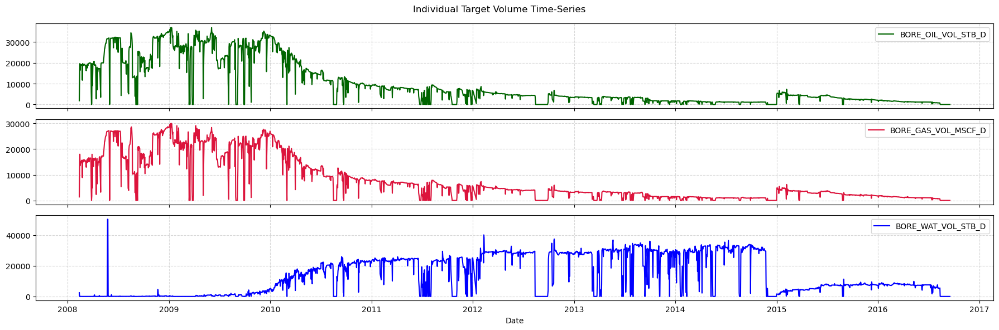

In [40]:
seperate_target_plot(df_3[target_col])

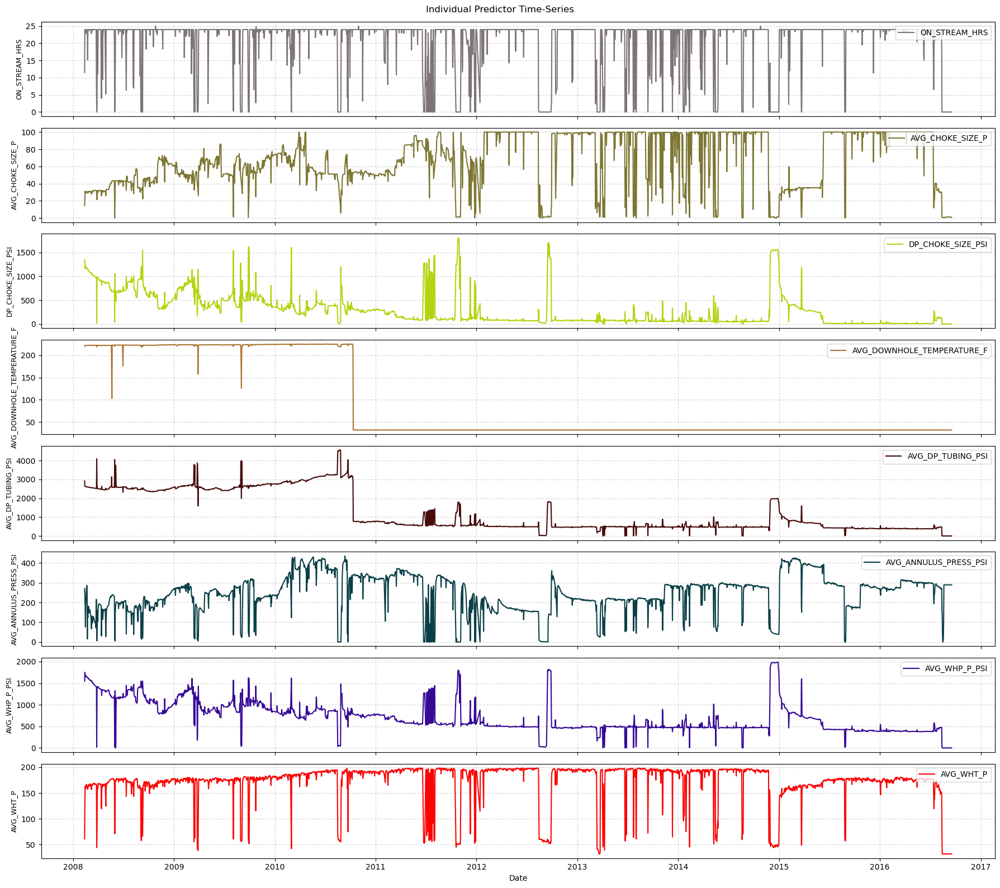

In [41]:
seperate_predictor_plot(df_3, features=predictor_num_col)

## ETS Decomposition

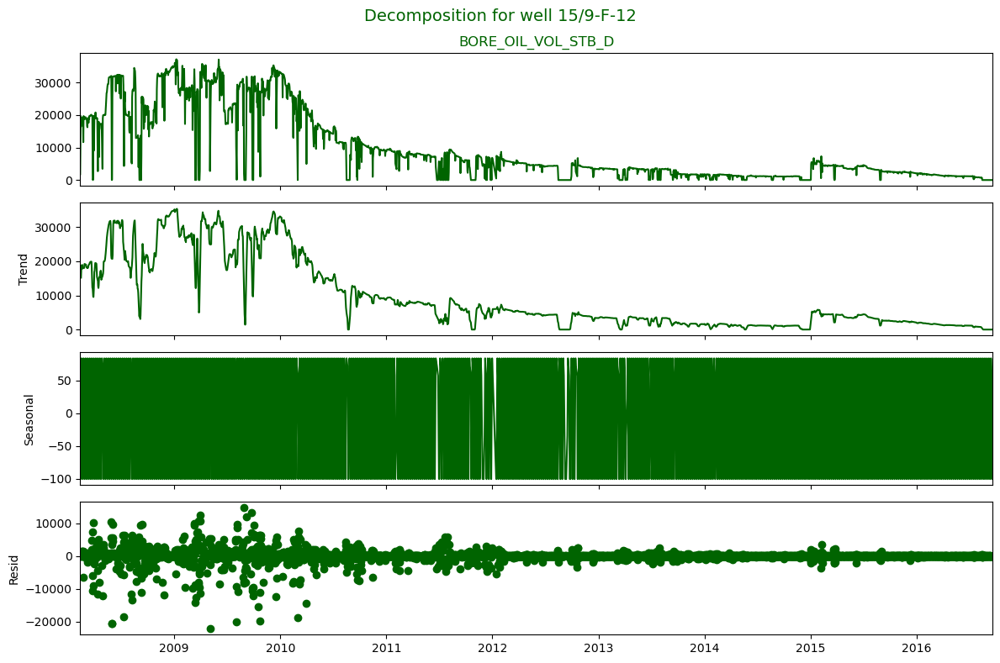

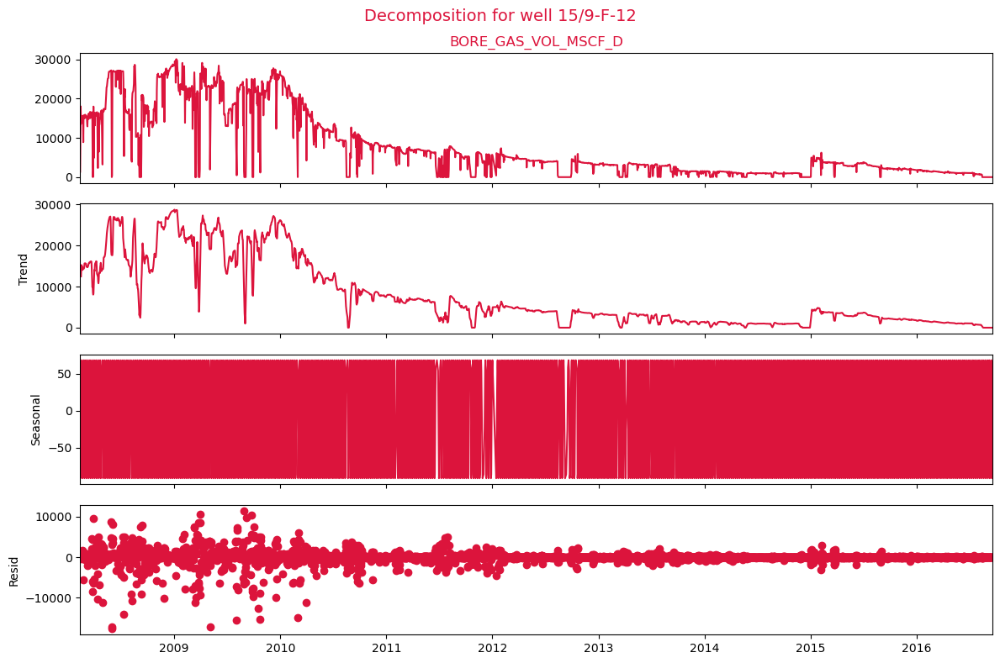

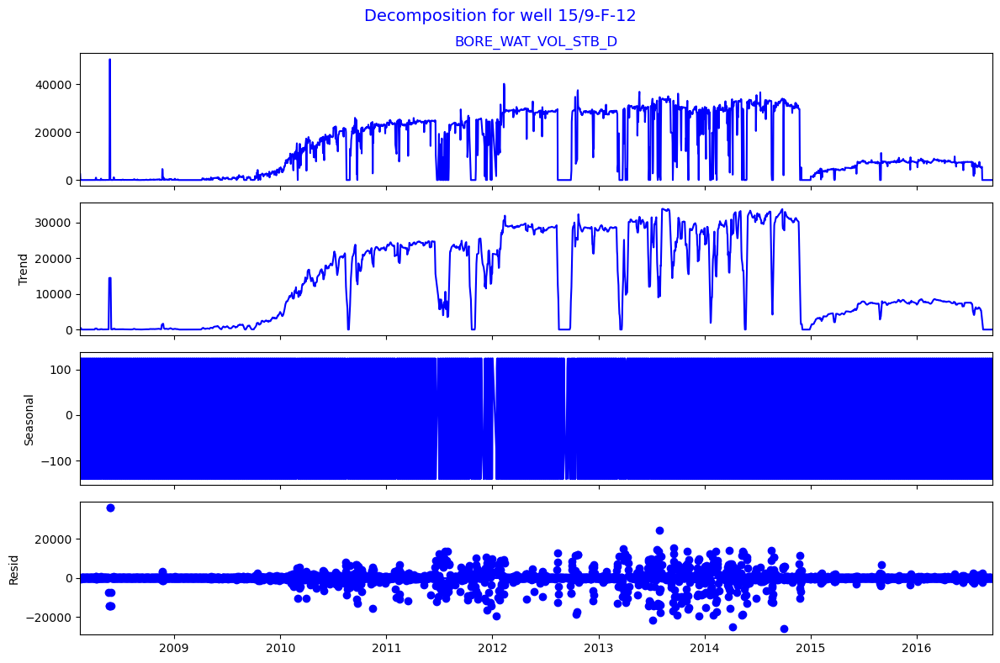

<Figure size 640x480 with 0 Axes>

In [42]:
plot_decomposition(df_3, target_col,model="additive", period=7)
plt.savefig('ets.png', dpi=300, bbox_inches='tight')

## ACF & PACF Plots and Monthly Plots

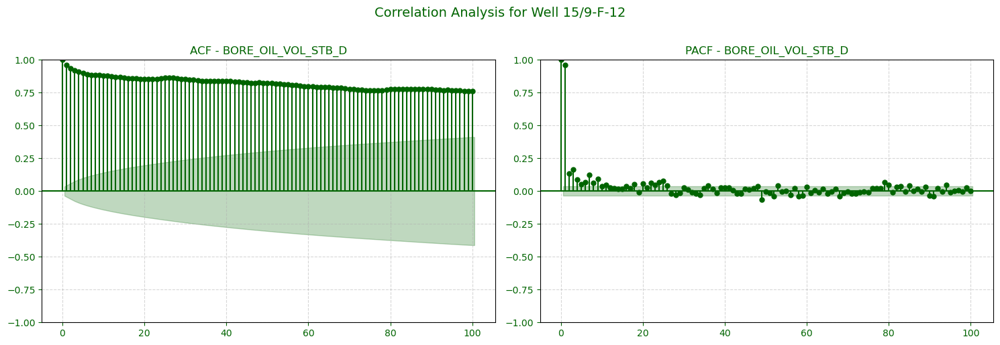

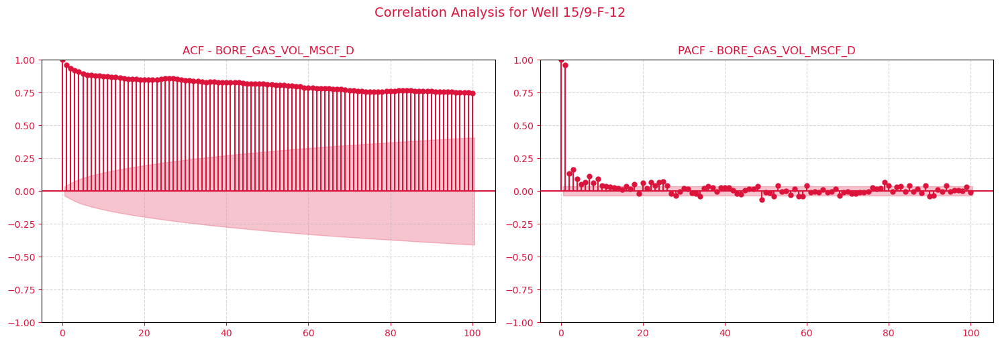

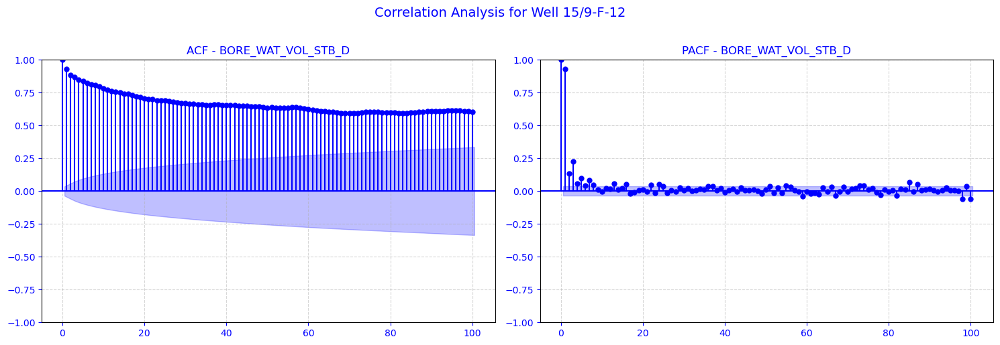

In [43]:
plot_acf_pacf_channels(df_3, target_col, lags=100)

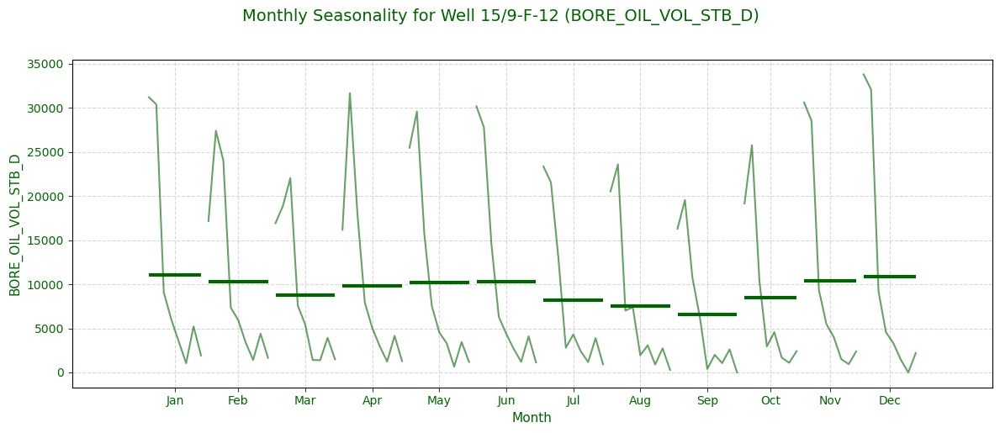

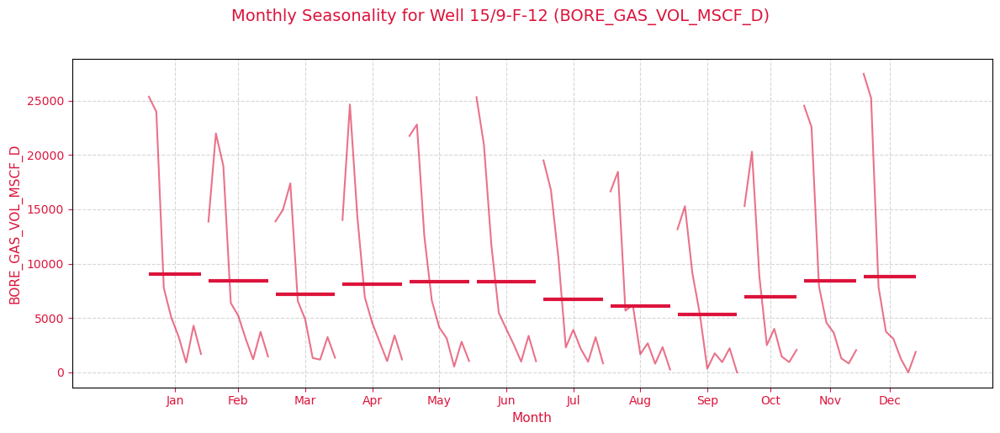

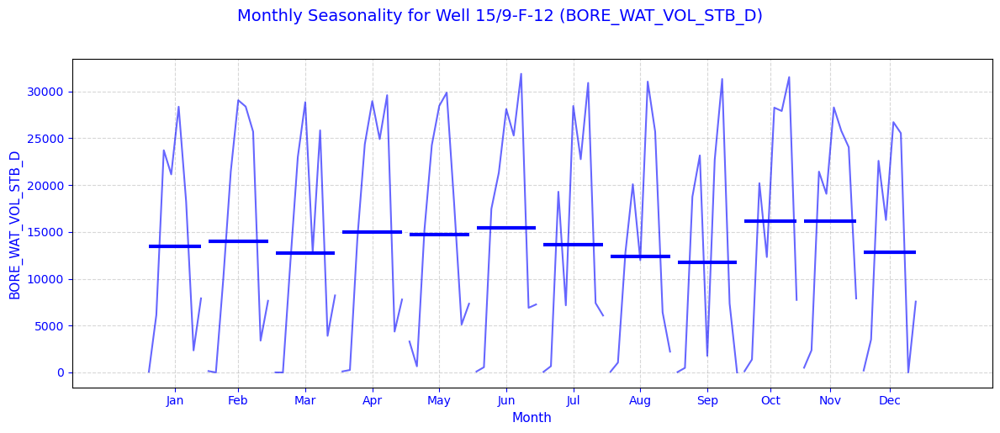

In [44]:
plot_monthly_seasonality(df_3, target_col)

In [45]:
train_data, val_data,test_data, keep_data=sarima_split_train_test_keep(df_3, 0.5,0.2,0.2)

start_of_val_date=val_data.index[0]
start_of_test_date=test_data.index[0]
start_of_keep_data=keep_data.index[0]
len(df_3)==len(train_data)+len(val_data)+len(test_data)+len(keep_data)

find_best_sarima_model_for_all_phases_optuna(
    models_dict,
    order_dict,
    target_col,
    train_data,
    val_data,
    train_exog=None,
    test_exog=None,
    p_max=3,
    d_max=2,
    q_max=2,
    P_max=2,
    D_max=2,
    Q_max=1,
    seasonal_period=(7),
    n_trials=100,
    maxiter=50,
    )

[I 2026-06-25 16:00:10,694] A new study created in memory with name: no-name-6afe992d-6271-40d4-ae8e-000dcd1242b5


  0%|          | 0/100 [00:00<?, ?it/s]

[I 2026-06-25 16:00:11,283] Trial 0 finished with value: 2205.036479601883 and parameters: {'p': 1, 'd': 2, 'q': 2, 'P': 1, 'D': 0, 'Q': 0, 'trend': 'n'}. Best is trial 0 with value: 2205.036479601883.
[I 2026-06-25 16:00:11,518] Trial 1 finished with value: 1482.7194958685623 and parameters: {'p': 0, 'd': 2, 'q': 1, 'P': 2, 'D': 0, 'Q': 1, 'trend': 'n'}. Best is trial 1 with value: 1482.7194958685623.
[I 2026-06-25 16:00:11,589] Trial 2 finished with value: 2363.8113906338226 and parameters: {'p': 3, 'd': 0, 'q': 0, 'P': 0, 'D': 0, 'Q': 1, 'trend': 'n'}. Best is trial 1 with value: 1482.7194958685623.
[I 2026-06-25 16:00:11,633] Trial 3 finished with value: 2433.2026778895633 and parameters: {'p': 1, 'd': 0, 'q': 1, 'P': 0, 'D': 0, 'Q': 0, 'trend': 'n'}. Best is trial 1 with value: 1482.7194958685623.
[I 2026-06-25 16:00:11,717] Trial 4 finished with value: 6733.906233780545 and parameters: {'p': 1, 'd': 2, 'q': 0, 'P': 1, 'D': 1, 'Q': 0, 'trend': 'n'}. Best is trial 1 with value: 148

[I 2026-06-25 16:00:56,224] A new study created in memory with name: no-name-55903dfa-35e3-4720-a4cb-f3e52e9f8c48


  0%|          | 0/100 [00:00<?, ?it/s]

[I 2026-06-25 16:00:56,828] Trial 0 finished with value: 1575.4759640415427 and parameters: {'p': 1, 'd': 2, 'q': 2, 'P': 1, 'D': 0, 'Q': 0, 'trend': 'n'}. Best is trial 0 with value: 1575.4759640415427.
[I 2026-06-25 16:00:57,121] Trial 1 finished with value: 1603.0832557281194 and parameters: {'p': 0, 'd': 2, 'q': 1, 'P': 2, 'D': 0, 'Q': 1, 'trend': 'n'}. Best is trial 0 with value: 1575.4759640415427.
[I 2026-06-25 16:00:57,193] Trial 2 finished with value: 2736.96074346745 and parameters: {'p': 3, 'd': 0, 'q': 0, 'P': 0, 'D': 0, 'Q': 1, 'trend': 'n'}. Best is trial 0 with value: 1575.4759640415427.
[I 2026-06-25 16:00:57,227] Trial 3 finished with value: 2737.445520920727 and parameters: {'p': 1, 'd': 0, 'q': 1, 'P': 0, 'D': 0, 'Q': 0, 'trend': 'n'}. Best is trial 0 with value: 1575.4759640415427.
[I 2026-06-25 16:00:57,291] Trial 4 finished with value: 1690.93257522197 and parameters: {'p': 1, 'd': 2, 'q': 0, 'P': 1, 'D': 1, 'Q': 0, 'trend': 'n'}. Best is trial 0 with value: 1575.

[I 2026-06-25 16:02:01,717] A new study created in memory with name: no-name-be990e50-2360-4ad8-9be0-1c9ad9381e02



15/9-F-12 | BORE_OIL_VOL_STB_D
Normal RMSE: 1286.5000000026653
Log RMSE:    1287.6375447292082


  0%|          | 0/100 [00:00<?, ?it/s]

[I 2026-06-25 16:02:02,290] Trial 0 finished with value: 1528.6559975292043 and parameters: {'p': 1, 'd': 2, 'q': 2, 'P': 1, 'D': 0, 'Q': 0, 'trend': 'n'}. Best is trial 0 with value: 1528.6559975292043.
[I 2026-06-25 16:02:02,522] Trial 1 finished with value: 1216.8274391239718 and parameters: {'p': 0, 'd': 2, 'q': 1, 'P': 2, 'D': 0, 'Q': 1, 'trend': 'n'}. Best is trial 1 with value: 1216.8274391239718.
[I 2026-06-25 16:02:02,594] Trial 2 finished with value: 2154.0266613658646 and parameters: {'p': 3, 'd': 0, 'q': 0, 'P': 0, 'D': 0, 'Q': 1, 'trend': 'n'}. Best is trial 1 with value: 1216.8274391239718.
[I 2026-06-25 16:02:02,624] Trial 3 finished with value: 2216.260842633084 and parameters: {'p': 1, 'd': 0, 'q': 1, 'P': 0, 'D': 0, 'Q': 0, 'trend': 'n'}. Best is trial 1 with value: 1216.8274391239718.
[I 2026-06-25 16:02:02,841] Trial 4 finished with value: 36348.52678939963 and parameters: {'p': 1, 'd': 2, 'q': 0, 'P': 1, 'D': 1, 'Q': 0, 'trend': 'n'}. Best is trial 1 with value: 12

[I 2026-06-25 16:02:59,802] A new study created in memory with name: no-name-a6ee5268-3f43-41fa-87a1-66312a18eb51


  0%|          | 0/100 [00:00<?, ?it/s]

[I 2026-06-25 16:03:00,243] Trial 0 finished with value: 1499.9944700941187 and parameters: {'p': 1, 'd': 2, 'q': 2, 'P': 1, 'D': 0, 'Q': 0, 'trend': 'n'}. Best is trial 0 with value: 1499.9944700941187.
[I 2026-06-25 16:03:00,432] Trial 1 finished with value: 1518.2624486090326 and parameters: {'p': 0, 'd': 2, 'q': 1, 'P': 2, 'D': 0, 'Q': 1, 'trend': 'n'}. Best is trial 0 with value: 1499.9944700941187.
[I 2026-06-25 16:03:00,507] Trial 2 finished with value: 2482.837378290262 and parameters: {'p': 3, 'd': 0, 'q': 0, 'P': 0, 'D': 0, 'Q': 1, 'trend': 'n'}. Best is trial 0 with value: 1499.9944700941187.
[I 2026-06-25 16:03:00,542] Trial 3 finished with value: 2488.709717827506 and parameters: {'p': 1, 'd': 0, 'q': 1, 'P': 0, 'D': 0, 'Q': 0, 'trend': 'n'}. Best is trial 0 with value: 1499.9944700941187.
[I 2026-06-25 16:03:00,607] Trial 4 finished with value: 2199.304477363438 and parameters: {'p': 1, 'd': 2, 'q': 0, 'P': 1, 'D': 1, 'Q': 0, 'trend': 'n'}. Best is trial 0 with value: 149

[I 2026-06-25 16:03:23,879] A new study created in memory with name: no-name-0d1b146b-719f-49cc-b755-905bd4d731bc



15/9-F-12 | BORE_GAS_VOL_MSCF_D
Normal RMSE: 1182.7380580229446
Log RMSE:    1329.2786885160335


  0%|          | 0/100 [00:00<?, ?it/s]

[I 2026-06-25 16:03:24,266] Trial 0 finished with value: 15758.220971071763 and parameters: {'p': 1, 'd': 2, 'q': 2, 'P': 1, 'D': 0, 'Q': 0, 'trend': 'n'}. Best is trial 0 with value: 15758.220971071763.
[I 2026-06-25 16:03:24,523] Trial 1 finished with value: 14894.688601651054 and parameters: {'p': 0, 'd': 2, 'q': 1, 'P': 2, 'D': 0, 'Q': 1, 'trend': 'n'}. Best is trial 1 with value: 14894.688601651054.
[I 2026-06-25 16:03:24,598] Trial 2 finished with value: 22956.281942307924 and parameters: {'p': 3, 'd': 0, 'q': 0, 'P': 0, 'D': 0, 'Q': 1, 'trend': 'n'}. Best is trial 1 with value: 14894.688601651054.
[I 2026-06-25 16:03:24,626] Trial 3 finished with value: 21588.1597306714 and parameters: {'p': 1, 'd': 0, 'q': 1, 'P': 0, 'D': 0, 'Q': 0, 'trend': 'n'}. Best is trial 1 with value: 14894.688601651054.
[I 2026-06-25 16:03:24,703] Trial 4 finished with value: 316897.89153712353 and parameters: {'p': 1, 'd': 2, 'q': 0, 'P': 1, 'D': 1, 'Q': 0, 'trend': 'n'}. Best is trial 1 with value: 14

[I 2026-06-25 16:03:48,447] A new study created in memory with name: no-name-76566292-0c57-449e-996d-400aa7506889


  0%|          | 0/100 [00:00<?, ?it/s]

[I 2026-06-25 16:03:48,805] Trial 0 finished with value: 374142.7928786349 and parameters: {'p': 1, 'd': 2, 'q': 2, 'P': 1, 'D': 0, 'Q': 0, 'trend': 'n'}. Best is trial 0 with value: 374142.7928786349.
[I 2026-06-25 16:03:49,092] Trial 1 finished with value: 343255.0506085784 and parameters: {'p': 0, 'd': 2, 'q': 1, 'P': 2, 'D': 0, 'Q': 1, 'trend': 'n'}. Best is trial 1 with value: 343255.0506085784.
[I 2026-06-25 16:03:49,172] Trial 2 finished with value: 25647.750440481785 and parameters: {'p': 3, 'd': 0, 'q': 0, 'P': 0, 'D': 0, 'Q': 1, 'trend': 'n'}. Best is trial 2 with value: 25647.750440481785.
[I 2026-06-25 16:03:49,251] Trial 3 finished with value: 25641.1946101355 and parameters: {'p': 1, 'd': 0, 'q': 1, 'P': 0, 'D': 0, 'Q': 0, 'trend': 'n'}. Best is trial 3 with value: 25641.1946101355.
[I 2026-06-25 16:03:49,320] Trial 4 finished with value: 76313968904.1901 and parameters: {'p': 1, 'd': 2, 'q': 0, 'P': 1, 'D': 1, 'Q': 0, 'trend': 'n'}. Best is trial 3 with value: 25641.1946

({'15/9-F-1 C_BORE_OIL_VOL_STB_D_sarima_model': <statsmodels.tsa.statespace.sarimax.SARIMAXResultsWrapper at 0x7cb54f3d61d0>,
  '15/9-F-1 C_BORE_GAS_VOL_MSCF_D_sarima_model': <statsmodels.tsa.statespace.sarimax.SARIMAXResultsWrapper at 0x7cb54f62bc90>,
  '15/9-F-1 C_BORE_WAT_VOL_STB_D_sarima_model': <statsmodels.tsa.statespace.sarimax.SARIMAXResultsWrapper at 0x7cb54f682550>,
  '15/9-F-11_BORE_OIL_VOL_STB_D_sarima_model': <statsmodels.tsa.statespace.sarimax.SARIMAXResultsWrapper at 0x7cb544649d50>,
  '15/9-F-11_BORE_GAS_VOL_MSCF_D_sarima_model': <statsmodels.tsa.statespace.sarimax.SARIMAXResultsWrapper at 0x7cb5449e5490>,
  '15/9-F-11_BORE_WAT_VOL_STB_D_sarima_model': <statsmodels.tsa.statespace.sarimax.SARIMAXResultsWrapper at 0x7cb5449a2ed0>,
  '15/9-F-12_BORE_OIL_VOL_STB_D_sarima_model': <statsmodels.tsa.statespace.sarimax.SARIMAXResultsWrapper at 0x7cb546e30810>,
  '15/9-F-12_BORE_GAS_VOL_MSCF_D_sarima_model': <statsmodels.tsa.statespace.sarimax.SARIMAXResultsWrapper at 0x7cb5444fa

In [46]:
models_dict

{'15/9-F-1 C_BORE_OIL_VOL_STB_D_sarima_model': <statsmodels.tsa.statespace.sarimax.SARIMAXResultsWrapper at 0x7cb54f3d61d0>,
 '15/9-F-1 C_BORE_GAS_VOL_MSCF_D_sarima_model': <statsmodels.tsa.statespace.sarimax.SARIMAXResultsWrapper at 0x7cb54f62bc90>,
 '15/9-F-1 C_BORE_WAT_VOL_STB_D_sarima_model': <statsmodels.tsa.statespace.sarimax.SARIMAXResultsWrapper at 0x7cb54f682550>,
 '15/9-F-11_BORE_OIL_VOL_STB_D_sarima_model': <statsmodels.tsa.statespace.sarimax.SARIMAXResultsWrapper at 0x7cb544649d50>,
 '15/9-F-11_BORE_GAS_VOL_MSCF_D_sarima_model': <statsmodels.tsa.statespace.sarimax.SARIMAXResultsWrapper at 0x7cb5449e5490>,
 '15/9-F-11_BORE_WAT_VOL_STB_D_sarima_model': <statsmodels.tsa.statespace.sarimax.SARIMAXResultsWrapper at 0x7cb5449a2ed0>,
 '15/9-F-12_BORE_OIL_VOL_STB_D_sarima_model': <statsmodels.tsa.statespace.sarimax.SARIMAXResultsWrapper at 0x7cb546e30810>,
 '15/9-F-12_BORE_GAS_VOL_MSCF_D_sarima_model': <statsmodels.tsa.statespace.sarimax.SARIMAXResultsWrapper at 0x7cb5444fa250>,
 '

In [47]:
order_dict

{'15/9-F-1 C_BORE_OIL_VOL_STB_D_sarima_model_order': {'order': (1, 1, 0),
  'seasonal_order': (2, 0, 1, 7),
  'log_transform': False,
  'rmse': np.float64(1260.480439075785)},
 '15/9-F-1 C_BORE_GAS_VOL_MSCF_D_sarima_model_order': {'order': (0, 1, 1),
  'seasonal_order': (2, 0, 1, 7),
  'log_transform': False,
  'rmse': np.float64(1034.906040846869)},
 '15/9-F-1 C_BORE_WAT_VOL_STB_D_sarima_model_order': {'order': (1, 1, 2),
  'seasonal_order': (2, 0, 0, 7),
  'log_transform': False,
  'rmse': np.float64(2783.4475351910846)},
 '15/9-F-11_BORE_OIL_VOL_STB_D_sarima_model_order': {'order': (0, 2, 1),
  'seasonal_order': (2, 0, 1, 7),
  'log_transform': False,
  'rmse': np.float64(3227.311205284656)},
 '15/9-F-11_BORE_GAS_VOL_MSCF_D_sarima_model_order': {'order': (0, 2, 1),
  'seasonal_order': (2, 0, 1, 7),
  'log_transform': False,
  'rmse': np.float64(2470.731272269004)},
 '15/9-F-11_BORE_WAT_VOL_STB_D_sarima_model_order': {'order': (1, 2, 1),
  'seasonal_order': (1, 1, 1, 7),
  'log_trans

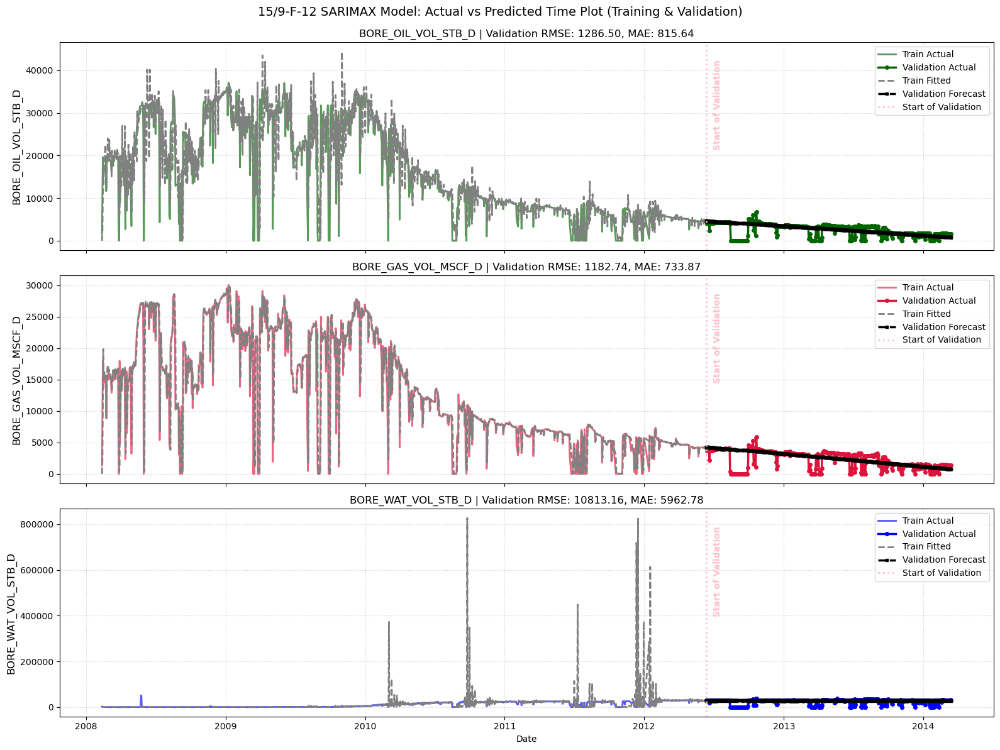

In [48]:
#Time plot


# ploting train and validation
data=pd.concat([train_data, val_data])

# 1. Create a single figure with 3 rows of subplots sharing the same X-axis (Dates)
fig, axes = plt.subplots(nrows=3, ncols=1, figsize=(16, 12), sharex=True)

oil_test_actual_plot=plot_train_val_predictions_time(
                                                    train_data=train_data,
                                                    val_data=val_data,
                                                    phase_string="BORE_OIL_VOL_STB_D",
                                                    model=models_dict["15/9-F-12_BORE_OIL_VOL_STB_D_sarima_model"],
                                                    log_transform=False,
                                                    transform_type="log1p",
                                                    ax=axes[0],
                                                    start_of_val_date=start_of_val_date )
gas_test_actual_plot=plot_train_val_predictions_time(
                                                    train_data=train_data,
                                                    val_data=val_data,
                                                    phase_string="BORE_GAS_VOL_MSCF_D",
                                                    model=models_dict["15/9-F-12_BORE_GAS_VOL_MSCF_D_sarima_model"],
                                                    log_transform=False,
                                                    transform_type="log1p",
                                                    ax=axes[1],
                                                    start_of_val_date=start_of_val_date )
water_test_actual_plot=plot_train_val_predictions_time(
                                                    train_data=train_data,
                                                    val_data=val_data,
                                                    phase_string="BORE_WAT_VOL_STB_D",
                                                    model=models_dict["15/9-F-12_BORE_WAT_VOL_STB_D_sarima_model_log"],
                                                    log_transform=True,
                                                    transform_type="log1p",
                                                    ax=axes[2],
                                                    start_of_val_date=start_of_val_date)

# 5. Format and save the combined master plot
axes[-1].set_xlabel('Date')  # Label the bottom X-axis
fig.suptitle(f'{df_3["NPD_WELL_BORE_NAME"].iloc[0]} SARIMAX Model: Actual vs Predicted Time Plot (Training & Validation)', fontsize=14, y=0.99)
plt.tight_layout()

# Save the unified plot directly to disk
safe_well_name = str(df_3["NPD_WELL_BORE_NAME"].iloc[0]).replace('/', '-')
file_path = f'pictures/{safe_well_name}_sarima_predictions_time_plot.png'
fig.savefig(file_path, dpi=300, bbox_inches='tight')
plt.show()

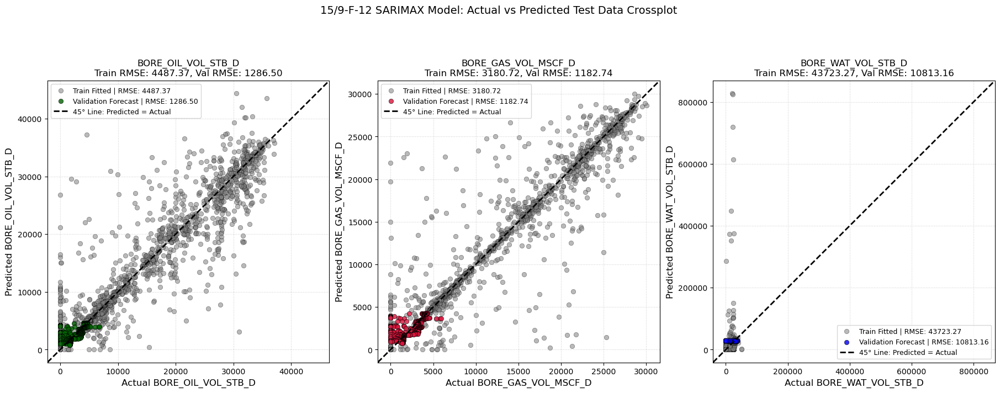

In [49]:
#Prediction vs actual plot


# ploting train and validation
data=pd.concat([train_data,val_data])

# 1. Create a single figure with 3 rows of subplots sharing the same X-axis (Dates)
fig, axes = plt.subplots(nrows=1, ncols=3, figsize=(18, 8), sharex=False,constrained_layout=True)

oil_test_actual_plot=plot_train_val_actual_vs_predicted_crossplot(
                                              train_data,
                                              val_data,
                                              phase_string="BORE_OIL_VOL_STB_D" ,# 'BORE_OIL_VOL_STB_D', BORE_GAS_VOL_MSCF_D, BORE_WAT_VOL_STB_D,
                                              model=models_dict["15/9-F-12_BORE_OIL_VOL_STB_D_sarima_model"],
                                              val_exog=None,
                                              log_transform=False,
                                              transform_type="log1p",
                                              ax=axes[0]
                                                       )
gas_test_actual_plot=plot_train_val_actual_vs_predicted_crossplot(
                                              train_data,
                                              val_data,
                                              phase_string="BORE_GAS_VOL_MSCF_D" ,# 'BORE_OIL_VOL_STB_D', BORE_GAS_VOL_MSCF_D, BORE_WAT_VOL_STB_D,
                                              model=models_dict['15/9-F-12_BORE_GAS_VOL_MSCF_D_sarima_model'],
                                              val_exog=None,
                                              log_transform=False,
                                              transform_type="log1p", 
                                              ax=axes[1]
                                                       )
water_test_actual_plot=plot_train_val_actual_vs_predicted_crossplot(
                                              train_data,
                                              val_data,
                                              phase_string="BORE_WAT_VOL_STB_D" ,# 'BORE_OIL_VOL_STB_D', BORE_GAS_VOL_MSCF_D, BORE_WAT_VOL_STB_D,
                                              model=models_dict['15/9-F-12_BORE_WAT_VOL_STB_D_sarima_model_log'],
                                              val_exog=None,
                                              log_transform=True,
                                              transform_type="log1p", 
                                              ax=axes[2]
                                                         )

# 5. Format and save the combined master plot
#axes[-1].set_xlabel('Date')  # Label the bottom X-axis
fig.suptitle(f'{df_3["NPD_WELL_BORE_NAME"].iloc[0]} SARIMAX Model: Actual vs Predicted Test Data Crossplot ', fontsize=14, y=0.99)
#plt.tight_layout()

# Save the unified plot directly to disk
safe_well_name = str(df_3["NPD_WELL_BORE_NAME"].iloc[0]).replace('/', '-')
file_path = f'pictures/{safe_well_name}_sarima_predictions_crossplot.png'
fig.savefig(file_path, dpi=300, bbox_inches='tight')
plt.show()

# DF4

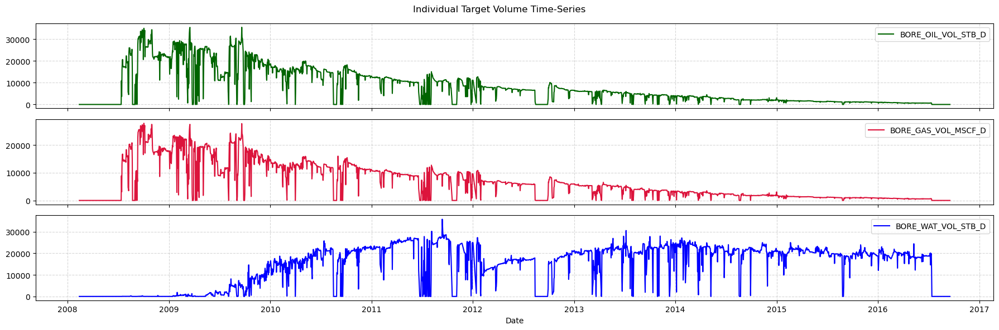

In [50]:
seperate_target_plot(df_4[target_col])

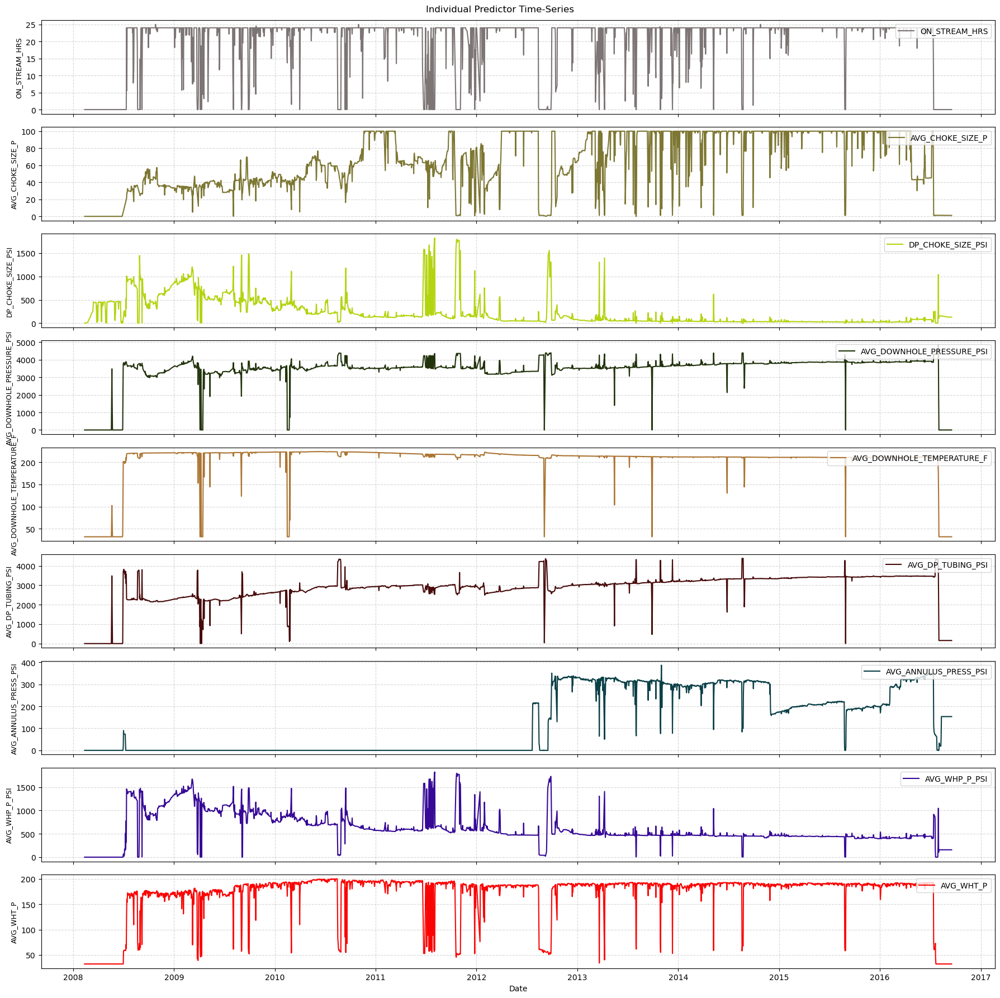

In [51]:
seperate_predictor_plot(df_4, features=predictor_num_col)

## ETS Decomposition

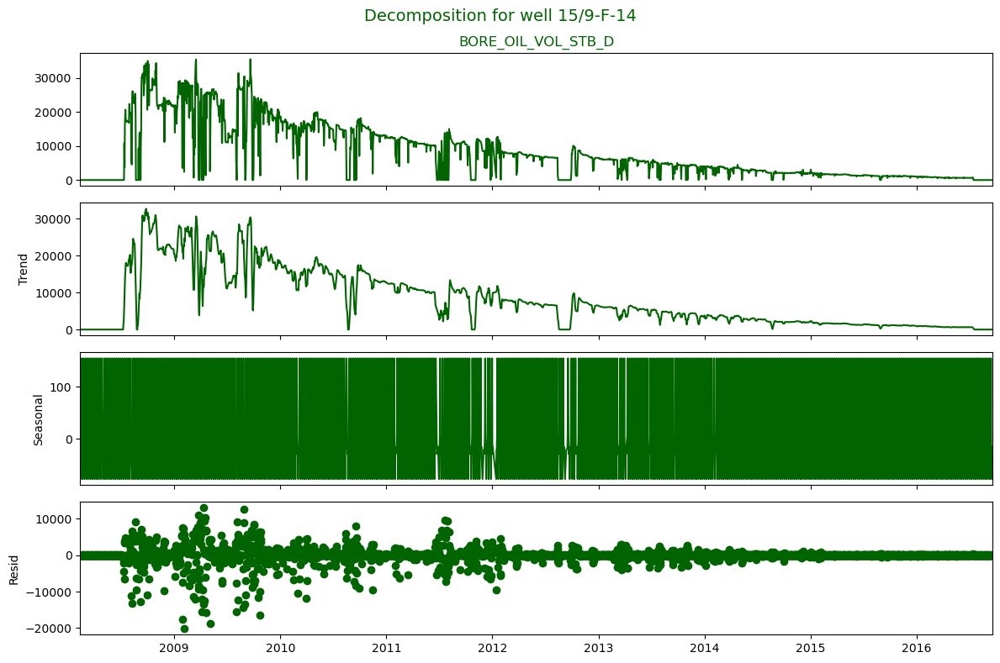

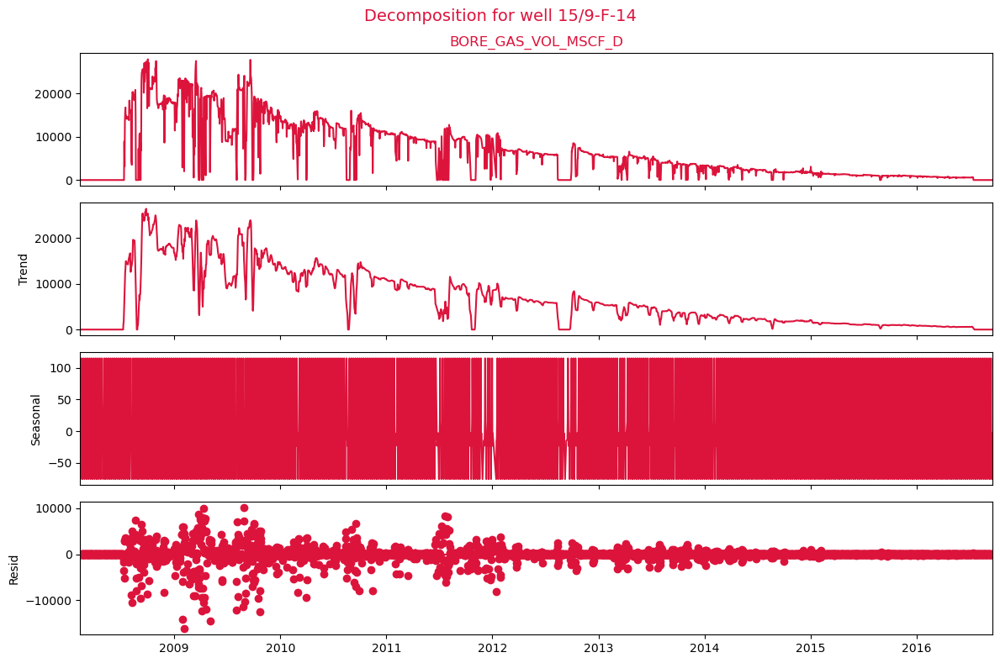

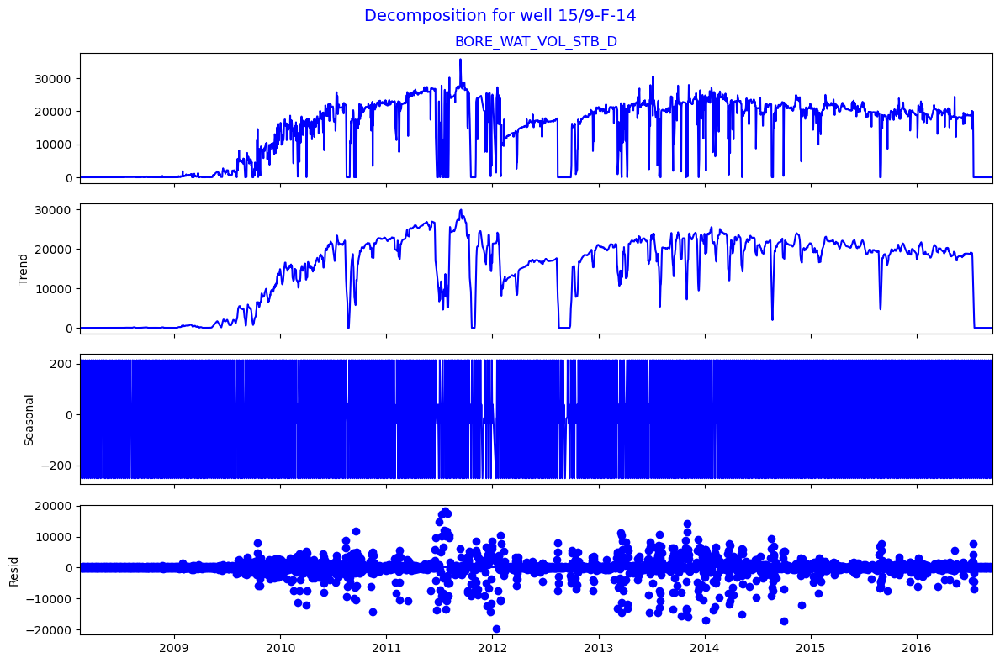

<Figure size 640x480 with 0 Axes>

In [52]:
plot_decomposition(df_4, target_col,model="additive", period=7)
plt.savefig('ets.png', dpi=300, bbox_inches='tight')

## ACF & PACF Plots and Monthly Plots

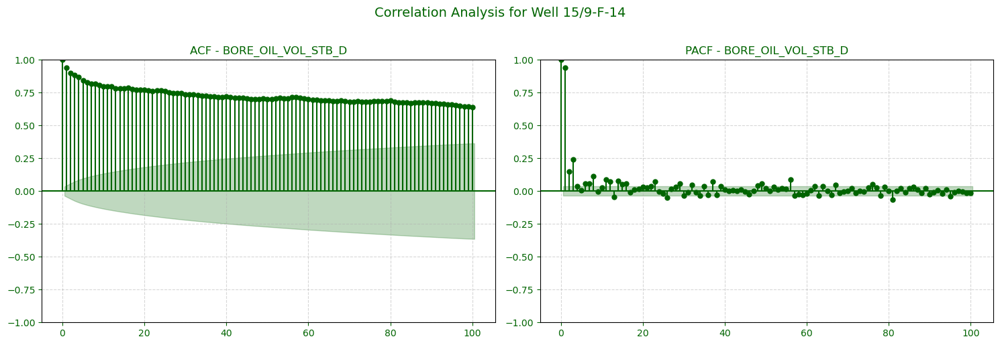

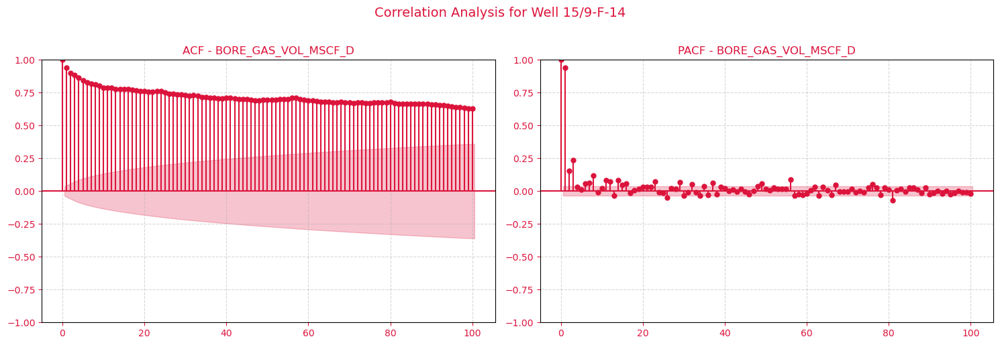

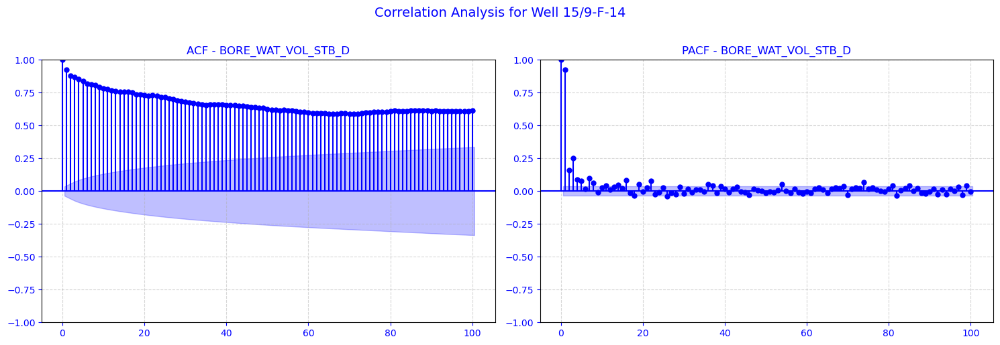

In [53]:
plot_acf_pacf_channels(df_4, target_col, lags=100)

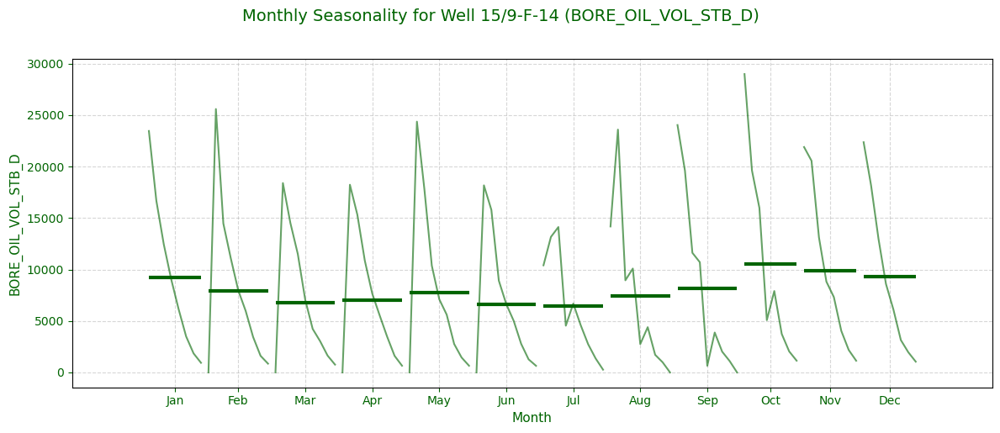

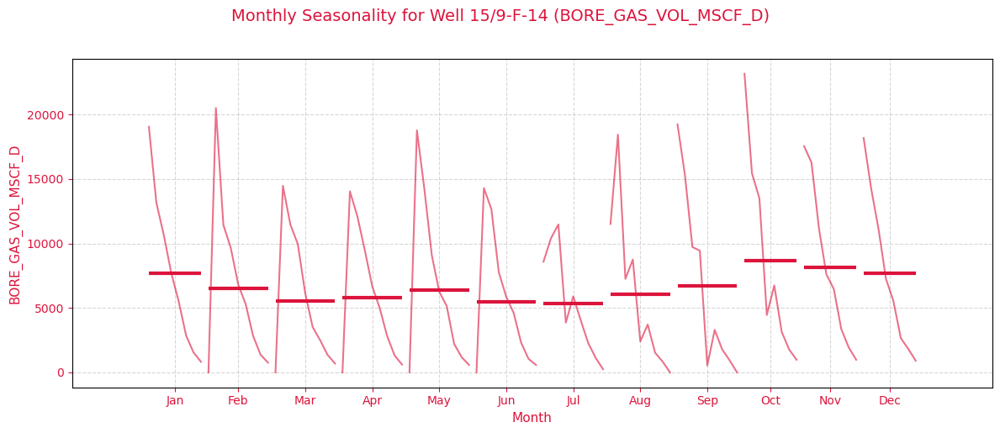

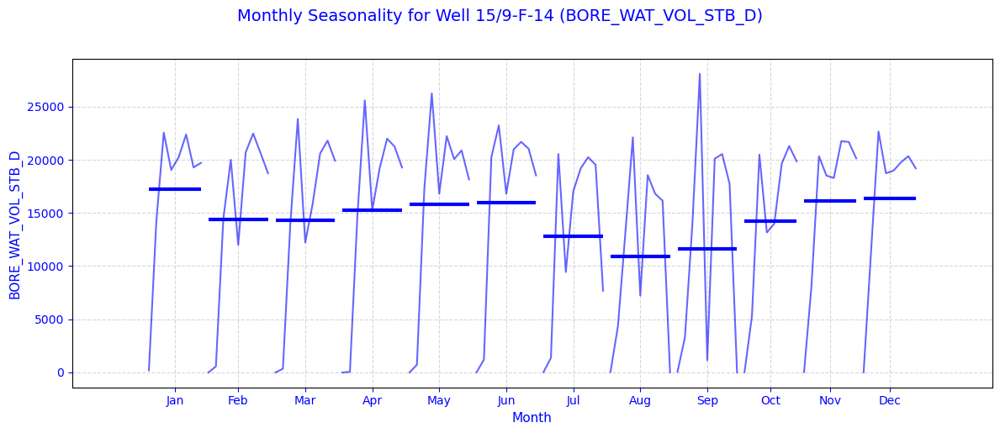

In [54]:
plot_monthly_seasonality(df_4, target_col)

## Find the best SARIMA model

In [55]:
train_data, val_data,test_data, keep_data=sarima_split_train_test_keep(df_4, 0.5,0.2,0.2)

start_of_val_date=val_data.index[0]
start_of_test_date=test_data.index[0]
start_of_keep_data=keep_data.index[0]
len(df_4)==len(train_data)+len(val_data)+len(test_data)+len(keep_data)

find_best_sarima_model_for_all_phases_optuna(
    models_dict,
    order_dict,
    target_col,
    train_data,
    val_data,
    train_exog=None,
    test_exog=None,
    p_max=3,
    d_max=2,
    q_max=3,
    P_max=2,
    D_max=2,
    Q_max=1,
    seasonal_period=(7),
    n_trials=150,
    maxiter=50,
    )

[I 2026-06-25 16:05:28,386] A new study created in memory with name: no-name-96e31d70-ee25-4c1d-b3d8-713675da9ab9


  0%|          | 0/150 [00:00<?, ?it/s]

[I 2026-06-25 16:05:28,740] Trial 0 finished with value: 2669.4442184879063 and parameters: {'p': 1, 'd': 2, 'q': 2, 'P': 1, 'D': 0, 'Q': 0, 'trend': 'n'}. Best is trial 0 with value: 2669.4442184879063.
[I 2026-06-25 16:05:29,363] Trial 1 finished with value: 3877.5479271873223 and parameters: {'p': 0, 'd': 2, 'q': 2, 'P': 2, 'D': 0, 'Q': 1, 'trend': 'n'}. Best is trial 0 with value: 2669.4442184879063.
[I 2026-06-25 16:05:29,461] Trial 2 finished with value: 4445.111407375969 and parameters: {'p': 3, 'd': 0, 'q': 0, 'P': 0, 'D': 0, 'Q': 1, 'trend': 'n'}. Best is trial 0 with value: 2669.4442184879063.
[I 2026-06-25 16:05:29,544] Trial 3 finished with value: 4003.423133064729 and parameters: {'p': 1, 'd': 0, 'q': 2, 'P': 0, 'D': 0, 'Q': 0, 'trend': 'n'}. Best is trial 0 with value: 2669.4442184879063.
[I 2026-06-25 16:05:29,621] Trial 4 finished with value: 2268.546563306815 and parameters: {'p': 1, 'd': 2, 'q': 0, 'P': 1, 'D': 1, 'Q': 0, 'trend': 'n'}. Best is trial 4 with value: 226

[I 2026-06-25 16:10:06,147] A new study created in memory with name: no-name-b70fc0f9-1338-40e3-bb5b-2b03bbd091ec


  0%|          | 0/150 [00:00<?, ?it/s]

[I 2026-06-25 16:10:06,725] Trial 0 finished with value: 92737.34808553502 and parameters: {'p': 1, 'd': 2, 'q': 2, 'P': 1, 'D': 0, 'Q': 0, 'trend': 'n'}. Best is trial 0 with value: 92737.34808553502.
[I 2026-06-25 16:10:07,187] Trial 1 finished with value: 92663.29275882553 and parameters: {'p': 0, 'd': 2, 'q': 2, 'P': 2, 'D': 0, 'Q': 1, 'trend': 'n'}. Best is trial 1 with value: 92663.29275882553.
[I 2026-06-25 16:10:07,314] Trial 2 finished with value: 4998.738060334204 and parameters: {'p': 3, 'd': 0, 'q': 0, 'P': 0, 'D': 0, 'Q': 1, 'trend': 'n'}. Best is trial 2 with value: 4998.738060334204.
[I 2026-06-25 16:10:07,358] Trial 3 finished with value: 4794.901303111246 and parameters: {'p': 1, 'd': 0, 'q': 2, 'P': 0, 'D': 0, 'Q': 0, 'trend': 'n'}. Best is trial 3 with value: 4794.901303111246.
[I 2026-06-25 16:10:07,427] Trial 4 finished with value: 62244.12924605761 and parameters: {'p': 1, 'd': 2, 'q': 0, 'P': 1, 'D': 1, 'Q': 0, 'trend': 'n'}. Best is trial 3 with value: 4794.9013

[I 2026-06-25 16:12:53,102] A new study created in memory with name: no-name-62e799f6-8dad-4666-ad8d-8dec45625658



15/9-F-14 | BORE_OIL_VOL_STB_D
Normal RMSE: 1936.3232622683558
Log RMSE:    1939.0570278910668


  0%|          | 0/150 [00:00<?, ?it/s]

[I 2026-06-25 16:12:53,400] Trial 0 finished with value: 2620.3359872336955 and parameters: {'p': 1, 'd': 2, 'q': 2, 'P': 1, 'D': 0, 'Q': 0, 'trend': 'n'}. Best is trial 0 with value: 2620.3359872336955.
[I 2026-06-25 16:12:53,716] Trial 1 finished with value: 3520.727705377069 and parameters: {'p': 0, 'd': 2, 'q': 2, 'P': 2, 'D': 0, 'Q': 1, 'trend': 'n'}. Best is trial 0 with value: 2620.3359872336955.
[I 2026-06-25 16:12:53,802] Trial 2 finished with value: 3884.3163972899565 and parameters: {'p': 3, 'd': 0, 'q': 0, 'P': 0, 'D': 0, 'Q': 1, 'trend': 'n'}. Best is trial 0 with value: 2620.3359872336955.
[I 2026-06-25 16:12:53,872] Trial 3 finished with value: 3514.3412599495996 and parameters: {'p': 1, 'd': 0, 'q': 2, 'P': 0, 'D': 0, 'Q': 0, 'trend': 'n'}. Best is trial 0 with value: 2620.3359872336955.
[I 2026-06-25 16:12:53,963] Trial 4 finished with value: 61991.6151059132 and parameters: {'p': 1, 'd': 2, 'q': 0, 'P': 1, 'D': 1, 'Q': 0, 'trend': 'n'}. Best is trial 0 with value: 262

[I 2026-06-25 16:18:17,794] A new study created in memory with name: no-name-3b1429d9-94fa-462e-8b9c-aba09d808395


  0%|          | 0/150 [00:00<?, ?it/s]

[I 2026-06-25 16:18:18,141] Trial 0 finished with value: 78179.6410987752 and parameters: {'p': 1, 'd': 2, 'q': 2, 'P': 1, 'D': 0, 'Q': 0, 'trend': 'n'}. Best is trial 0 with value: 78179.6410987752.
[I 2026-06-25 16:18:18,741] Trial 1 finished with value: 78059.41608818508 and parameters: {'p': 0, 'd': 2, 'q': 2, 'P': 2, 'D': 0, 'Q': 1, 'trend': 'n'}. Best is trial 1 with value: 78059.41608818508.
[I 2026-06-25 16:18:18,864] Trial 2 finished with value: 4375.550011597848 and parameters: {'p': 3, 'd': 0, 'q': 0, 'P': 0, 'D': 0, 'Q': 1, 'trend': 'n'}. Best is trial 2 with value: 4375.550011597848.
[I 2026-06-25 16:18:18,901] Trial 3 finished with value: 4200.204008340551 and parameters: {'p': 1, 'd': 0, 'q': 2, 'P': 0, 'D': 0, 'Q': 0, 'trend': 'n'}. Best is trial 3 with value: 4200.204008340551.
[I 2026-06-25 16:18:18,964] Trial 4 finished with value: 3867.8782338138544 and parameters: {'p': 1, 'd': 2, 'q': 0, 'P': 1, 'D': 1, 'Q': 0, 'trend': 'n'}. Best is trial 4 with value: 3867.87823

[I 2026-06-25 16:18:59,831] A new study created in memory with name: no-name-57c7a759-ba9b-43d5-9b9c-be2b2b1e2a9f



15/9-F-14 | BORE_GAS_VOL_MSCF_D
Normal RMSE: 1717.4652995375493
Log RMSE:    1714.5822861999332


  0%|          | 0/150 [00:00<?, ?it/s]

[I 2026-06-25 16:19:00,144] Trial 0 finished with value: 6377.371915203199 and parameters: {'p': 1, 'd': 2, 'q': 2, 'P': 1, 'D': 0, 'Q': 0, 'trend': 'n'}. Best is trial 0 with value: 6377.371915203199.
[I 2026-06-25 16:19:00,486] Trial 1 finished with value: 6362.585642138957 and parameters: {'p': 0, 'd': 2, 'q': 2, 'P': 2, 'D': 0, 'Q': 1, 'trend': 'n'}. Best is trial 1 with value: 6362.585642138957.
[I 2026-06-25 16:19:00,572] Trial 2 finished with value: 17855.849731861268 and parameters: {'p': 3, 'd': 0, 'q': 0, 'P': 0, 'D': 0, 'Q': 1, 'trend': 'n'}. Best is trial 1 with value: 6362.585642138957.
[I 2026-06-25 16:19:00,610] Trial 3 finished with value: 14810.285719764652 and parameters: {'p': 1, 'd': 0, 'q': 2, 'P': 0, 'D': 0, 'Q': 0, 'trend': 'n'}. Best is trial 1 with value: 6362.585642138957.
[I 2026-06-25 16:19:00,693] Trial 4 finished with value: 63470.7313551306 and parameters: {'p': 1, 'd': 2, 'q': 0, 'P': 1, 'D': 1, 'Q': 0, 'trend': 'n'}. Best is trial 1 with value: 6362.585

[I 2026-06-25 16:21:20,494] A new study created in memory with name: no-name-23287f76-7c9d-4aa7-a667-174c9b0e322b


  0%|          | 0/150 [00:00<?, ?it/s]

[I 2026-06-25 16:21:20,905] Trial 0 finished with value: 308699.18179104436 and parameters: {'p': 1, 'd': 2, 'q': 2, 'P': 1, 'D': 0, 'Q': 0, 'trend': 'n'}. Best is trial 0 with value: 308699.18179104436.
[I 2026-06-25 16:21:21,532] Trial 1 finished with value: 307986.1869530508 and parameters: {'p': 0, 'd': 2, 'q': 2, 'P': 2, 'D': 0, 'Q': 1, 'trend': 'n'}. Best is trial 1 with value: 307986.1869530508.
[I 2026-06-25 16:21:21,662] Trial 2 finished with value: 19277.65316136668 and parameters: {'p': 3, 'd': 0, 'q': 0, 'P': 0, 'D': 0, 'Q': 1, 'trend': 'n'}. Best is trial 2 with value: 19277.65316136668.
[I 2026-06-25 16:21:21,740] Trial 3 finished with value: 18803.35955642386 and parameters: {'p': 1, 'd': 0, 'q': 2, 'P': 0, 'D': 0, 'Q': 0, 'trend': 'n'}. Best is trial 3 with value: 18803.35955642386.
[I 2026-06-25 16:21:21,800] Trial 4 finished with value: 6.76112197749591e+21 and parameters: {'p': 1, 'd': 2, 'q': 0, 'P': 1, 'D': 1, 'Q': 0, 'trend': 'n'}. Best is trial 3 with value: 1880

({'15/9-F-1 C_BORE_OIL_VOL_STB_D_sarima_model': <statsmodels.tsa.statespace.sarimax.SARIMAXResultsWrapper at 0x7cb54f3d61d0>,
  '15/9-F-1 C_BORE_GAS_VOL_MSCF_D_sarima_model': <statsmodels.tsa.statespace.sarimax.SARIMAXResultsWrapper at 0x7cb54f62bc90>,
  '15/9-F-1 C_BORE_WAT_VOL_STB_D_sarima_model': <statsmodels.tsa.statespace.sarimax.SARIMAXResultsWrapper at 0x7cb54f682550>,
  '15/9-F-11_BORE_OIL_VOL_STB_D_sarima_model': <statsmodels.tsa.statespace.sarimax.SARIMAXResultsWrapper at 0x7cb544649d50>,
  '15/9-F-11_BORE_GAS_VOL_MSCF_D_sarima_model': <statsmodels.tsa.statespace.sarimax.SARIMAXResultsWrapper at 0x7cb5449e5490>,
  '15/9-F-11_BORE_WAT_VOL_STB_D_sarima_model': <statsmodels.tsa.statespace.sarimax.SARIMAXResultsWrapper at 0x7cb5449a2ed0>,
  '15/9-F-12_BORE_OIL_VOL_STB_D_sarima_model': <statsmodels.tsa.statespace.sarimax.SARIMAXResultsWrapper at 0x7cb546e30810>,
  '15/9-F-12_BORE_GAS_VOL_MSCF_D_sarima_model': <statsmodels.tsa.statespace.sarimax.SARIMAXResultsWrapper at 0x7cb5444fa

In [58]:
models_dict

{'15/9-F-1 C_BORE_OIL_VOL_STB_D_sarima_model': <statsmodels.tsa.statespace.sarimax.SARIMAXResultsWrapper at 0x7cb54f3d61d0>,
 '15/9-F-1 C_BORE_GAS_VOL_MSCF_D_sarima_model': <statsmodels.tsa.statespace.sarimax.SARIMAXResultsWrapper at 0x7cb54f62bc90>,
 '15/9-F-1 C_BORE_WAT_VOL_STB_D_sarima_model': <statsmodels.tsa.statespace.sarimax.SARIMAXResultsWrapper at 0x7cb54f682550>,
 '15/9-F-11_BORE_OIL_VOL_STB_D_sarima_model': <statsmodels.tsa.statespace.sarimax.SARIMAXResultsWrapper at 0x7cb544649d50>,
 '15/9-F-11_BORE_GAS_VOL_MSCF_D_sarima_model': <statsmodels.tsa.statespace.sarimax.SARIMAXResultsWrapper at 0x7cb5449e5490>,
 '15/9-F-11_BORE_WAT_VOL_STB_D_sarima_model': <statsmodels.tsa.statespace.sarimax.SARIMAXResultsWrapper at 0x7cb5449a2ed0>,
 '15/9-F-12_BORE_OIL_VOL_STB_D_sarima_model': <statsmodels.tsa.statespace.sarimax.SARIMAXResultsWrapper at 0x7cb546e30810>,
 '15/9-F-12_BORE_GAS_VOL_MSCF_D_sarima_model': <statsmodels.tsa.statespace.sarimax.SARIMAXResultsWrapper at 0x7cb5444fa250>,
 '

In [59]:
order_dict

{'15/9-F-1 C_BORE_OIL_VOL_STB_D_sarima_model_order': {'order': (1, 1, 0),
  'seasonal_order': (2, 0, 1, 7),
  'log_transform': False,
  'rmse': np.float64(1260.480439075785)},
 '15/9-F-1 C_BORE_GAS_VOL_MSCF_D_sarima_model_order': {'order': (0, 1, 1),
  'seasonal_order': (2, 0, 1, 7),
  'log_transform': False,
  'rmse': np.float64(1034.906040846869)},
 '15/9-F-1 C_BORE_WAT_VOL_STB_D_sarima_model_order': {'order': (1, 1, 2),
  'seasonal_order': (2, 0, 0, 7),
  'log_transform': False,
  'rmse': np.float64(2783.4475351910846)},
 '15/9-F-11_BORE_OIL_VOL_STB_D_sarima_model_order': {'order': (0, 2, 1),
  'seasonal_order': (2, 0, 1, 7),
  'log_transform': False,
  'rmse': np.float64(3227.311205284656)},
 '15/9-F-11_BORE_GAS_VOL_MSCF_D_sarima_model_order': {'order': (0, 2, 1),
  'seasonal_order': (2, 0, 1, 7),
  'log_transform': False,
  'rmse': np.float64(2470.731272269004)},
 '15/9-F-11_BORE_WAT_VOL_STB_D_sarima_model_order': {'order': (1, 2, 1),
  'seasonal_order': (1, 1, 1, 7),
  'log_trans

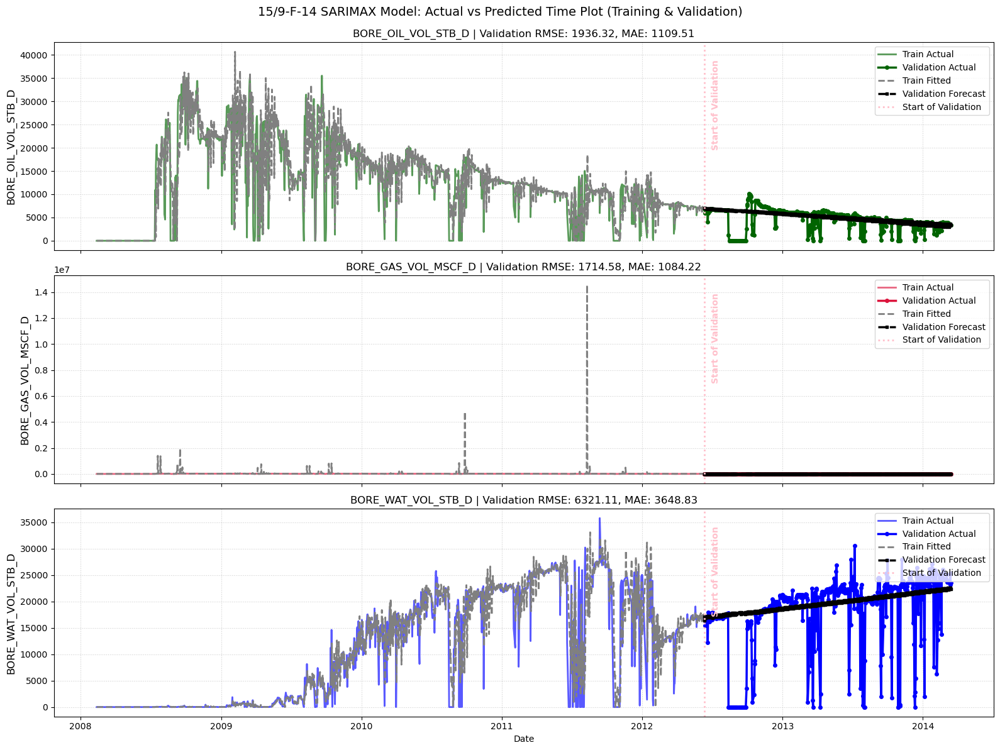

In [60]:
#Time plot


# ploting train and validation
data=pd.concat([train_data, val_data])

# 1. Create a single figure with 3 rows of subplots sharing the same X-axis (Dates)
fig, axes = plt.subplots(nrows=3, ncols=1, figsize=(16, 12), sharex=True)

oil_test_actual_plot=plot_train_val_predictions_time(
                                                    train_data=train_data,
                                                    val_data=val_data,
                                                    phase_string="BORE_OIL_VOL_STB_D",
                                                    model=models_dict["15/9-F-14_BORE_OIL_VOL_STB_D_sarima_model"],
                                                    log_transform=False,
                                                    transform_type="log1p",
                                                    ax=axes[0],
                                                    start_of_val_date=start_of_val_date )
gas_test_actual_plot=plot_train_val_predictions_time(
                                                    train_data=train_data,
                                                    val_data=val_data,
                                                    phase_string="BORE_GAS_VOL_MSCF_D",
                                                    model=models_dict["15/9-F-14_BORE_GAS_VOL_MSCF_D_sarima_model_log"],
                                                    log_transform=True,
                                                    transform_type="log1p",
                                                    ax=axes[1],
                                                    start_of_val_date=start_of_val_date )
water_test_actual_plot=plot_train_val_predictions_time(
                                                    train_data=train_data,
                                                    val_data=val_data,
                                                    phase_string="BORE_WAT_VOL_STB_D",
                                                    model=models_dict["15/9-F-14_BORE_WAT_VOL_STB_D_sarima_model"],
                                                    log_transform=False,
                                                    transform_type="log1p",
                                                    ax=axes[2],
                                                    start_of_val_date=start_of_val_date)

# 5. Format and save the combined master plot
axes[-1].set_xlabel('Date')  # Label the bottom X-axis
fig.suptitle(f'{df_4["NPD_WELL_BORE_NAME"].iloc[0]} SARIMAX Model: Actual vs Predicted Time Plot (Training & Validation)', fontsize=14, y=0.99)
plt.tight_layout()

# Save the unified plot directly to disk
safe_well_name = str(df_4["NPD_WELL_BORE_NAME"].iloc[0]).replace('/', '-')
file_path = f'pictures/{safe_well_name}_sarima_predictions_time_plot.png'
fig.savefig(file_path, dpi=300, bbox_inches='tight')
plt.show()

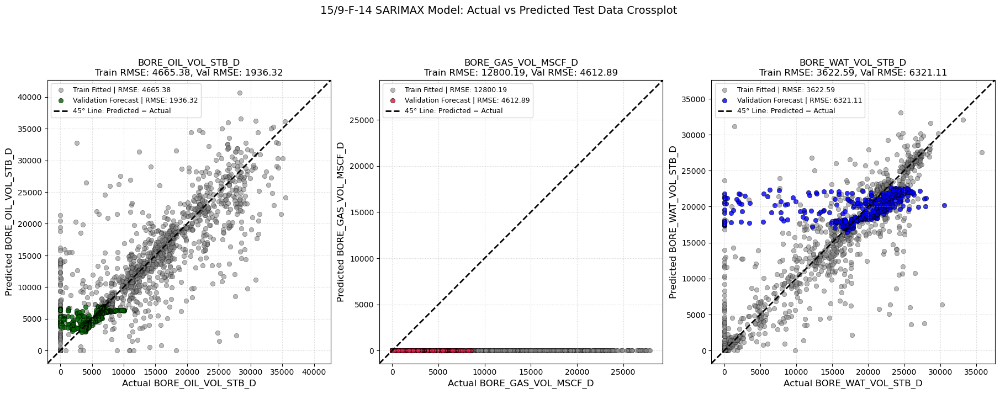

In [61]:
#Prediction vs actual plot


# ploting train and validation
data=pd.concat([train_data,val_data])

# 1. Create a single figure with 3 rows of subplots sharing the same X-axis (Dates)
fig, axes = plt.subplots(nrows=1, ncols=3, figsize=(18, 8), sharex=False,constrained_layout=True)

oil_test_actual_plot=plot_train_val_actual_vs_predicted_crossplot(
                                              train_data,
                                              val_data,
                                              phase_string="BORE_OIL_VOL_STB_D" ,# 'BORE_OIL_VOL_STB_D', BORE_GAS_VOL_MSCF_D, BORE_WAT_VOL_STB_D,
                                              model=models_dict["15/9-F-14_BORE_OIL_VOL_STB_D_sarima_model"],
                                              val_exog=None,
                                              log_transform=False,
                                              transform_type="log1p",
                                              ax=axes[0]
                                                       )
gas_test_actual_plot=plot_train_val_actual_vs_predicted_crossplot(
                                              train_data,
                                              val_data,
                                              phase_string="BORE_GAS_VOL_MSCF_D" ,# 'BORE_OIL_VOL_STB_D', BORE_GAS_VOL_MSCF_D, BORE_WAT_VOL_STB_D,
                                              model=models_dict['15/9-F-14_BORE_GAS_VOL_MSCF_D_sarima_model_log'],
                                              val_exog=None,
                                              log_transform=False,
                                              transform_type="log1p", 
                                              ax=axes[1]
                                                       )
water_test_actual_plot=plot_train_val_actual_vs_predicted_crossplot(
                                              train_data,
                                              val_data,
                                              phase_string="BORE_WAT_VOL_STB_D" ,# 'BORE_OIL_VOL_STB_D', BORE_GAS_VOL_MSCF_D, BORE_WAT_VOL_STB_D,
                                              model=models_dict['15/9-F-14_BORE_WAT_VOL_STB_D_sarima_model'],
                                              val_exog=None,
                                              log_transform=False,
                                              transform_type="log1p", 
                                              ax=axes[2]
                                                         )

# 5. Format and save the combined master plot
#axes[-1].set_xlabel('Date')  # Label the bottom X-axis
fig.suptitle(f'{df_4["NPD_WELL_BORE_NAME"].iloc[0]} SARIMAX Model: Actual vs Predicted Test Data Crossplot ', fontsize=14, y=0.99)
#plt.tight_layout()

# Save the unified plot directly to disk
safe_well_name = str(df_4["NPD_WELL_BORE_NAME"].iloc[0]).replace('/', '-')
file_path = f'pictures/{safe_well_name}_sarima_predictions_crossplot.png'
fig.savefig(file_path, dpi=300, bbox_inches='tight')
plt.show()

# DF 5

In [62]:
target_col=['BORE_OIL_VOL_STB_D', 'BORE_GAS_VOL_MSCF_D','BORE_WAT_VOL_STB_D']
predictor_num_col=['ON_STREAM_HRS', 'AVG_CHOKE_SIZE_P',
       'DP_CHOKE_SIZE_PSI',
      'AVG_DOWNHOLE_PRESSURE_PSI', 'AVG_DOWNHOLE_TEMPERATURE_F',
       'AVG_DP_TUBING_PSI', 'AVG_WHP_P_PSI', 'AVG_WHT_P']
predictor_cat_cols=['FLOW_KIND', 'WELL_TYPE']

In [63]:
df_5.head()

,WELL_BORE_CODE,NPD_WELL_BORE_CODE,NPD_WELL_BORE_NAME,NPD_FIELD_CODE,NPD_FIELD_NAME,NPD_FACILITY_CODE,NPD_FACILITY_NAME,ON_STREAM_HRS,AVG_CHOKE_SIZE_P,AVG_CHOKE_UOM,...,DP_CHOKE_SIZE_PSI,AVG_WHP_P_PSI,AVG_WHT_P,BORE_OIL_VOL_STB_D,BORE_GAS_VOL_MSCF_D,BORE_WAT_VOL_STB_D,GOR_MSCF/STB,WCUT,GOR_MSCF/STB_WAS_MISSING,WCUT_WAS_MISSING
DATEPRD,,,,,,,,,,,,,,,,,,,,,
2014-01-12,NO 15/9-F-15 D,7289,15/9-F-15 D,3420717,VOLVE,369304,MÆRSK INSPIRER,0.0,1.181753,%,...,292.193845,293.154287,47.112332,0.0000,0.000000,0.0,0.837988,0.0,1,1
2014-01-13,NO 15/9-F-15 D,7289,15/9-F-15 D,3420717,VOLVE,369304,MÆRSK INSPIRER,0.0,1.197065,%,...,336.328908,337.363609,43.389752,0.0000,0.000000,0.0,0.837988,0.0,1,1
2014-01-14,NO 15/9-F-15 D,7289,15/9-F-15 D,3420717,VOLVE,369304,MÆRSK INSPIRER,0.0,1.125136,%,...,308.563704,309.614649,44.293874,0.0000,0.000000,0.0,0.837988,0.0,1,1
2014-01-15,NO 15/9-F-15 D,7289,15/9-F-15 D,3420717,VOLVE,369304,MÆRSK INSPIRER,0.0,2.610212,%,...,392.971034,462.315732,45.836258,0.0000,0.000000,0.0,0.837988,0.0,1,1
2014-01-16,NO 15/9-F-15 D,7289,15/9-F-15 D,3420717,VOLVE,369304,MÆRSK INSPIRER,24.0,8.660590,%,...,405.617020,810.338131,62.420158,2208.0378,1850.310175,0.0,0.837988,0.0,0,0


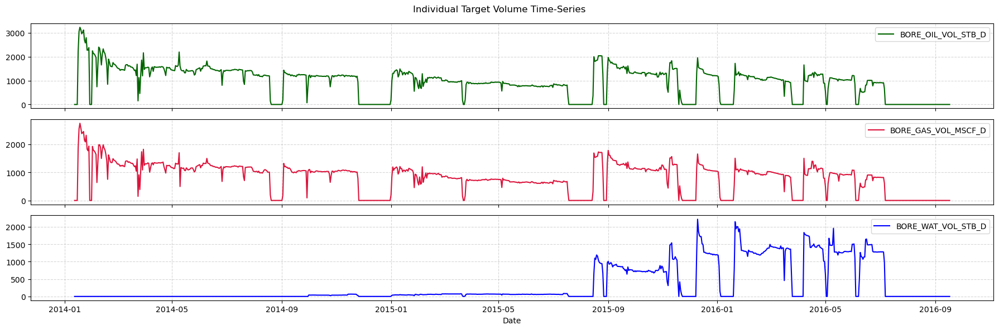

In [64]:
seperate_target_plot(df_5[target_col])

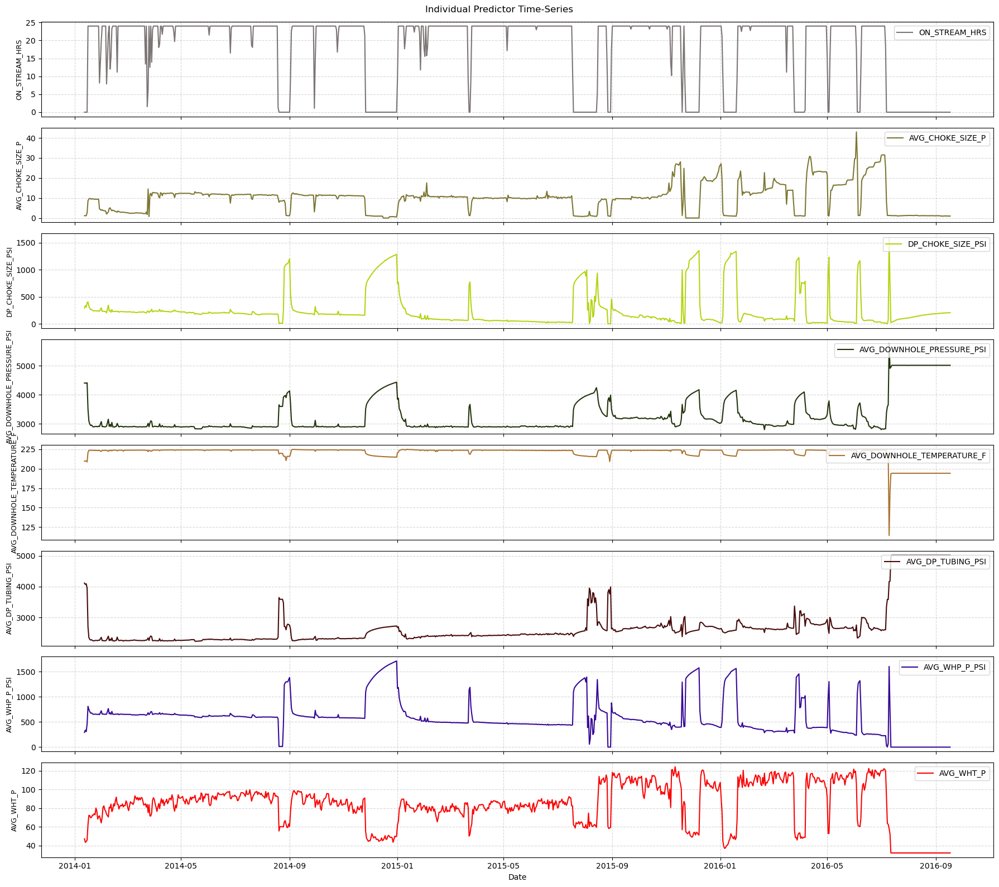

In [65]:
seperate_predictor_plot(df_5, features=predictor_num_col)

## ETS Decomposition

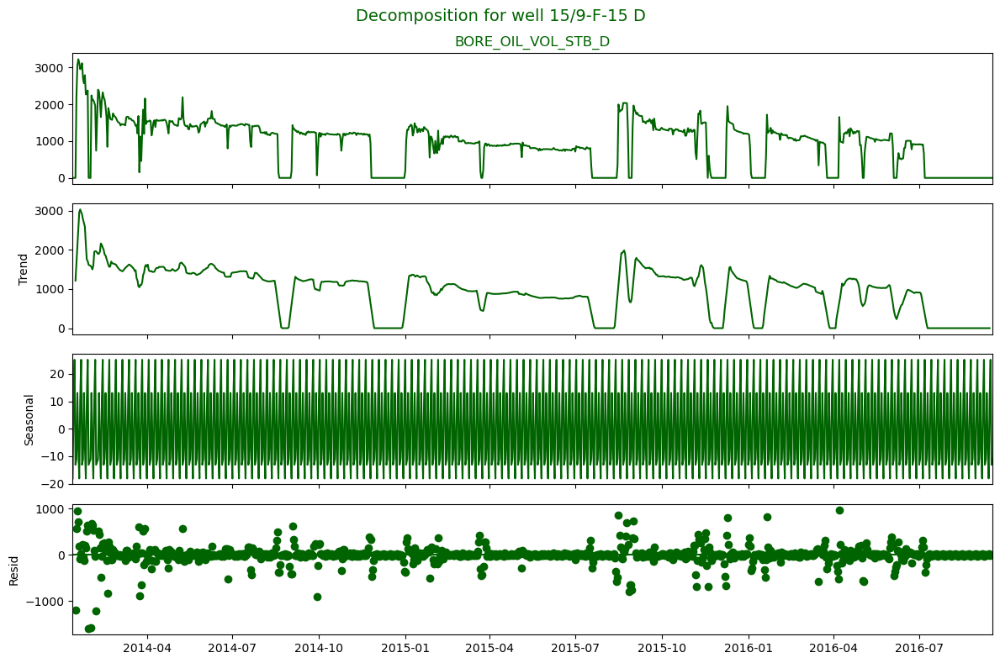

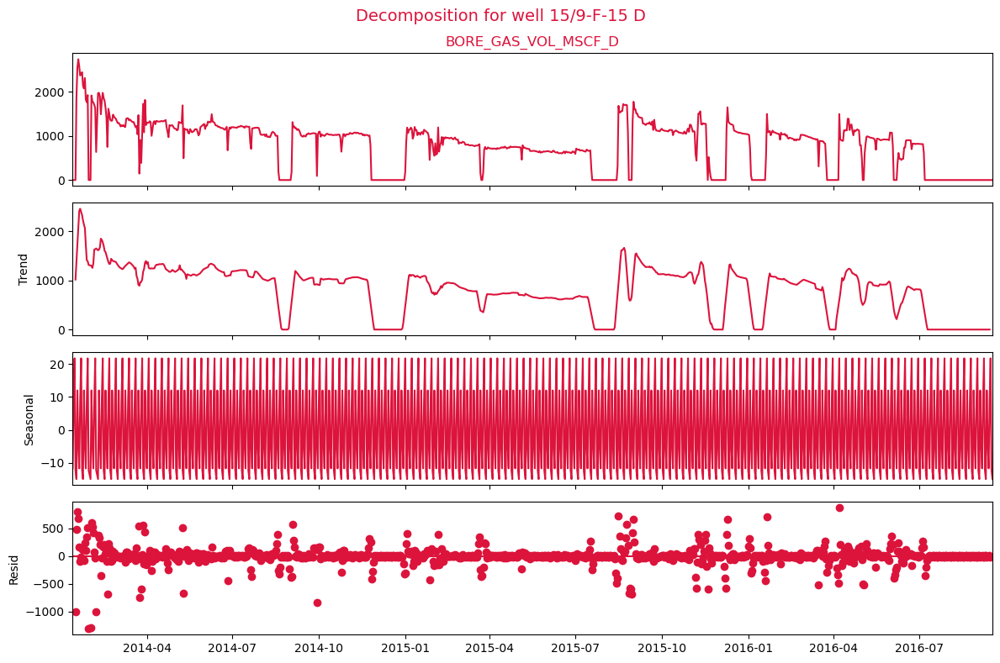

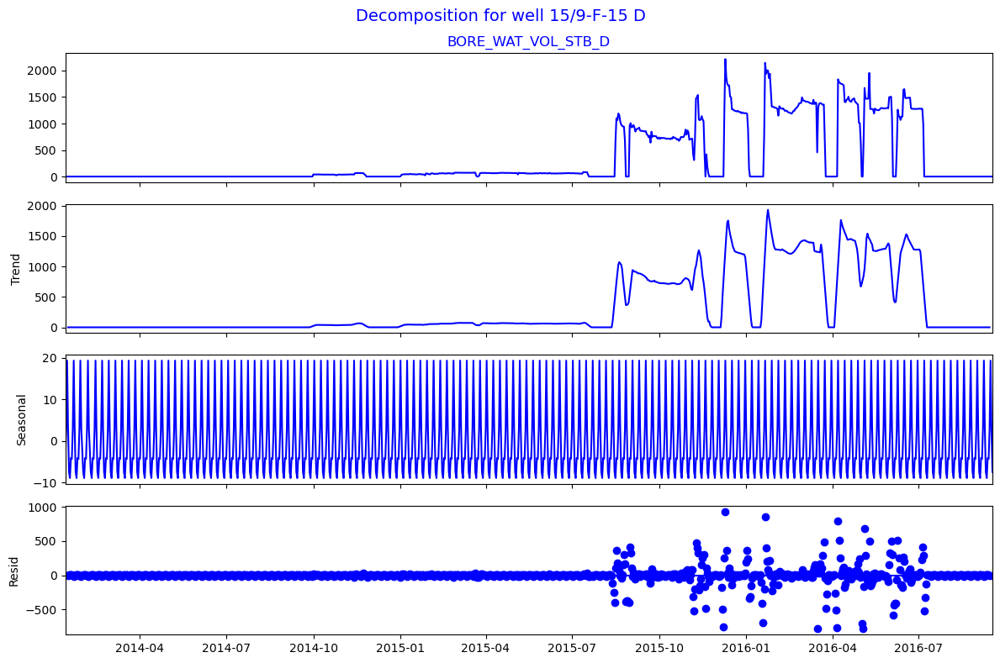

In [66]:
plot_decomposition(df_5, target_col,model="additive", period=7)

## ACF & PACF Plots and Monthly Plots

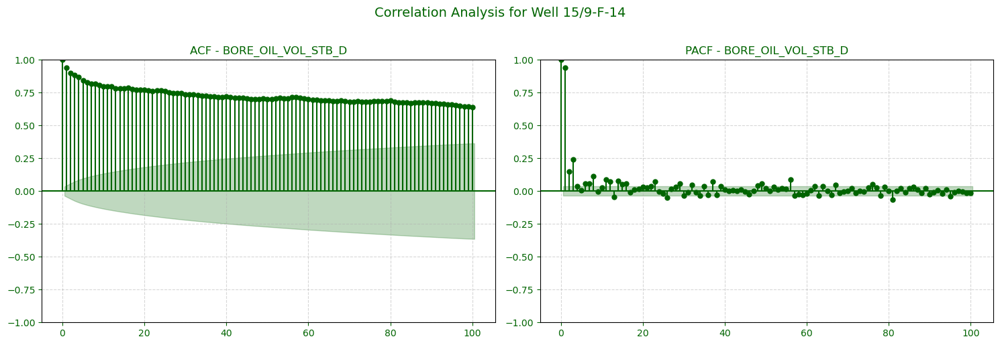

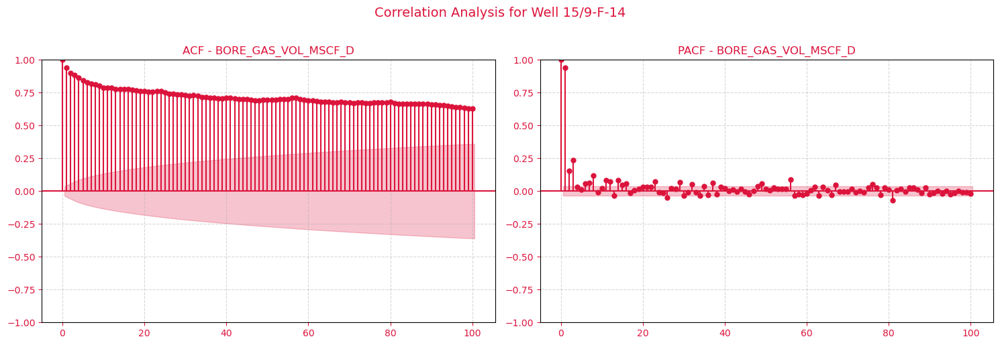

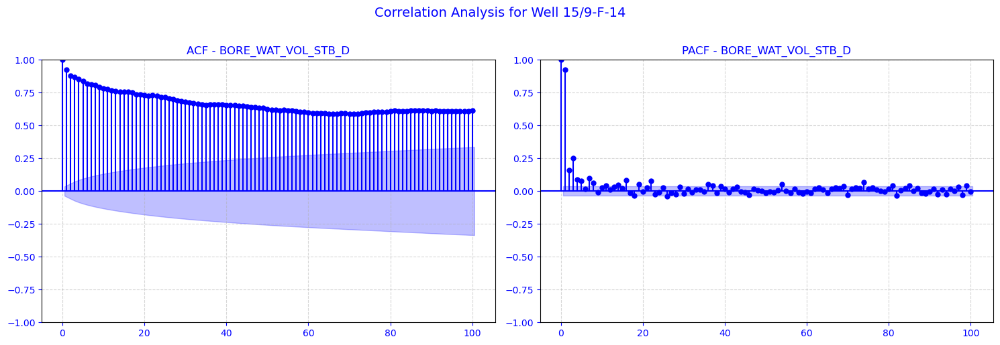

In [67]:
plot_acf_pacf_channels(df_4, target_col, lags=100)

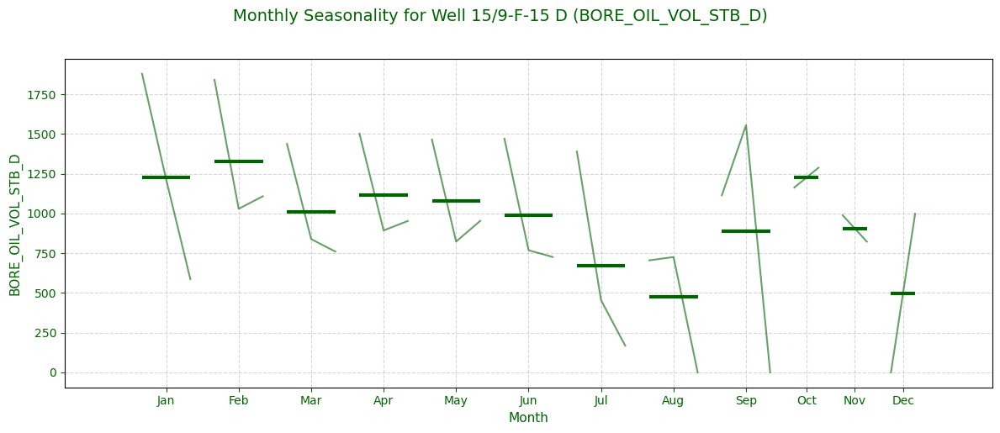

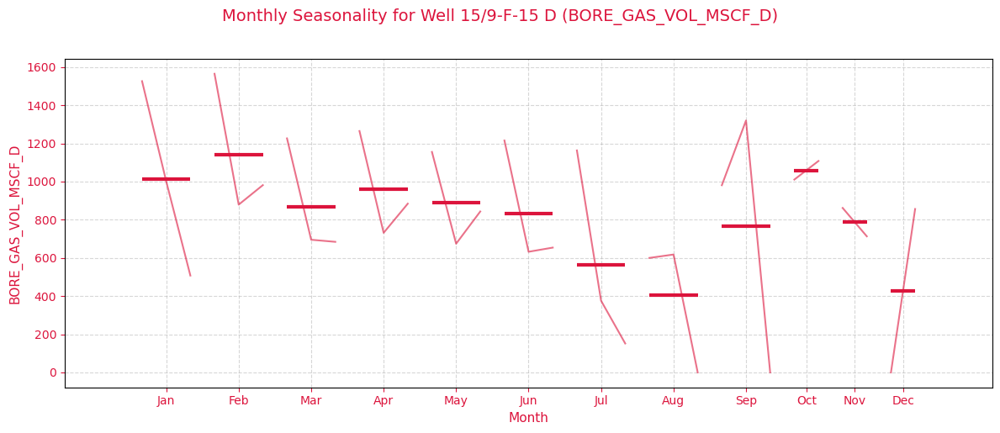

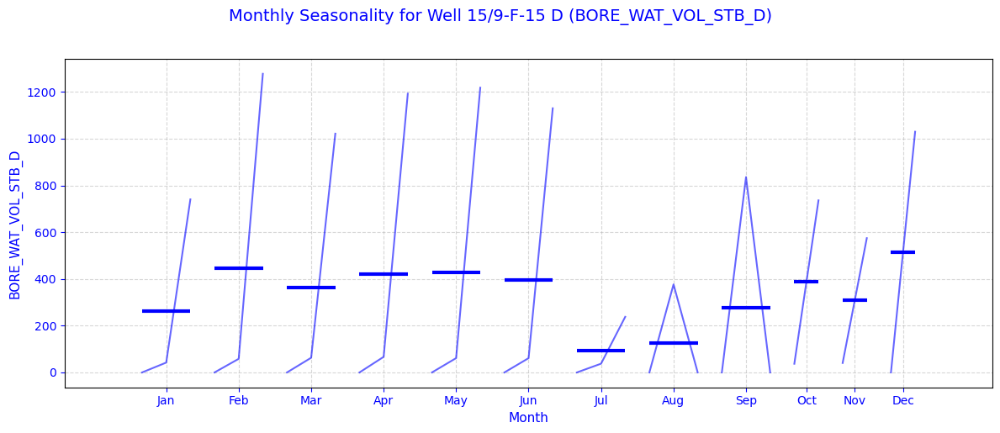

In [68]:
plot_monthly_seasonality(df_5, target_col)

## Find the best SARIMA model

In [69]:
train_data, val_data,test_data, keep_data=sarima_split_train_test_keep(df_5, 0.5,0.2,0.2)

start_of_val_date=val_data.index[0]
start_of_test_date=test_data.index[0]
start_of_keep_data=keep_data.index[0]
len(df_5)==len(train_data)+len(val_data)+len(test_data)+len(keep_data)

find_best_sarima_model_for_all_phases_optuna(
    models_dict,
    order_dict,
    target_col,
    train_data,
    val_data,
    train_exog=None,
    test_exog=None,
    p_max=3,
    d_max=2,
    q_max=2,
    P_max=3,
    D_max=2,
    Q_max=1,
    seasonal_period=(7),
    n_trials=100,
    maxiter=50,
    )

[I 2026-06-25 16:22:57,336] A new study created in memory with name: no-name-d802f7f2-d3b0-4e11-b2ae-e86d57c332ee


  0%|          | 0/100 [00:00<?, ?it/s]

[I 2026-06-25 16:22:57,588] Trial 0 finished with value: 868.0999880365716 and parameters: {'p': 1, 'd': 2, 'q': 2, 'P': 2, 'D': 0, 'Q': 0, 'trend': 'n'}. Best is trial 0 with value: 868.0999880365716.
[I 2026-06-25 16:22:57,779] Trial 1 finished with value: 667.5345071394363 and parameters: {'p': 0, 'd': 2, 'q': 1, 'P': 2, 'D': 0, 'Q': 1, 'trend': 'n'}. Best is trial 1 with value: 667.5345071394363.
[I 2026-06-25 16:22:57,835] Trial 2 finished with value: 985.6013887917819 and parameters: {'p': 3, 'd': 0, 'q': 0, 'P': 0, 'D': 0, 'Q': 1, 'trend': 'n'}. Best is trial 1 with value: 667.5345071394363.
[I 2026-06-25 16:22:57,847] Trial 3 finished with value: 967.7933302902654 and parameters: {'p': 1, 'd': 0, 'q': 1, 'P': 0, 'D': 0, 'Q': 0, 'trend': 'n'}. Best is trial 1 with value: 667.5345071394363.
[I 2026-06-25 16:22:57,933] Trial 4 finished with value: 2093.6398167189136 and parameters: {'p': 1, 'd': 2, 'q': 0, 'P': 2, 'D': 1, 'Q': 0, 'trend': 'n'}. Best is trial 1 with value: 667.5345

[I 2026-06-25 16:23:08,196] A new study created in memory with name: no-name-b4ff40f4-42da-4de0-bb55-853f781c9be4


  0%|          | 0/100 [00:00<?, ?it/s]

[I 2026-06-25 16:23:08,301] Trial 0 finished with value: 594.0638490574529 and parameters: {'p': 1, 'd': 2, 'q': 2, 'P': 2, 'D': 0, 'Q': 0, 'trend': 'n'}. Best is trial 0 with value: 594.0638490574529.
[I 2026-06-25 16:23:08,454] Trial 1 finished with value: 629.919603375634 and parameters: {'p': 0, 'd': 2, 'q': 1, 'P': 2, 'D': 0, 'Q': 1, 'trend': 'n'}. Best is trial 0 with value: 594.0638490574529.
[I 2026-06-25 16:23:08,493] Trial 2 finished with value: 1044.0790122571404 and parameters: {'p': 3, 'd': 0, 'q': 0, 'P': 0, 'D': 0, 'Q': 1, 'trend': 'n'}. Best is trial 0 with value: 594.0638490574529.
[I 2026-06-25 16:23:08,505] Trial 3 finished with value: 1066.7201825142763 and parameters: {'p': 1, 'd': 0, 'q': 1, 'P': 0, 'D': 0, 'Q': 0, 'trend': 'n'}. Best is trial 0 with value: 594.0638490574529.
[I 2026-06-25 16:23:08,544] Trial 4 finished with value: 100037.01432419241 and parameters: {'p': 1, 'd': 2, 'q': 0, 'P': 2, 'D': 1, 'Q': 0, 'trend': 'n'}. Best is trial 0 with value: 594.063

[I 2026-06-25 16:23:16,489] A new study created in memory with name: no-name-1b0775bd-591b-41fa-964e-f3e859164457



15/9-F-15 D | BORE_OIL_VOL_STB_D
Normal RMSE: 577.3981190308201
Log RMSE:    581.9865535043155


  0%|          | 0/100 [00:00<?, ?it/s]

[I 2026-06-25 16:23:16,703] Trial 0 finished with value: 621.349210559558 and parameters: {'p': 1, 'd': 2, 'q': 2, 'P': 2, 'D': 0, 'Q': 0, 'trend': 'n'}. Best is trial 0 with value: 621.349210559558.
[I 2026-06-25 16:23:16,897] Trial 1 finished with value: 585.7322668238448 and parameters: {'p': 0, 'd': 2, 'q': 1, 'P': 2, 'D': 0, 'Q': 1, 'trend': 'n'}. Best is trial 1 with value: 585.7322668238448.
[I 2026-06-25 16:23:16,953] Trial 2 finished with value: 844.4057991582208 and parameters: {'p': 3, 'd': 0, 'q': 0, 'P': 0, 'D': 0, 'Q': 1, 'trend': 'n'}. Best is trial 1 with value: 585.7322668238448.
[I 2026-06-25 16:23:16,963] Trial 3 finished with value: 821.805974685033 and parameters: {'p': 1, 'd': 0, 'q': 1, 'P': 0, 'D': 0, 'Q': 0, 'trend': 'n'}. Best is trial 1 with value: 585.7322668238448.
[I 2026-06-25 16:23:17,035] Trial 4 finished with value: 3179.2461192483174 and parameters: {'p': 1, 'd': 2, 'q': 0, 'P': 2, 'D': 1, 'Q': 0, 'trend': 'n'}. Best is trial 1 with value: 585.7322668

[I 2026-06-25 16:23:27,324] A new study created in memory with name: no-name-63764a04-8d96-4bbb-ad55-4dc5ae34c44f


  0%|          | 0/100 [00:00<?, ?it/s]

[I 2026-06-25 16:23:27,454] Trial 0 finished with value: 515.2550277317414 and parameters: {'p': 1, 'd': 2, 'q': 2, 'P': 2, 'D': 0, 'Q': 0, 'trend': 'n'}. Best is trial 0 with value: 515.2550277317414.
[I 2026-06-25 16:23:27,614] Trial 1 finished with value: 551.6346390114899 and parameters: {'p': 0, 'd': 2, 'q': 1, 'P': 2, 'D': 0, 'Q': 1, 'trend': 'n'}. Best is trial 0 with value: 515.2550277317414.
[I 2026-06-25 16:23:27,651] Trial 2 finished with value: 889.668842532475 and parameters: {'p': 3, 'd': 0, 'q': 0, 'P': 0, 'D': 0, 'Q': 1, 'trend': 'n'}. Best is trial 0 with value: 515.2550277317414.
[I 2026-06-25 16:23:27,664] Trial 3 finished with value: 907.2629417382889 and parameters: {'p': 1, 'd': 0, 'q': 1, 'P': 0, 'D': 0, 'Q': 0, 'trend': 'n'}. Best is trial 0 with value: 515.2550277317414.
[I 2026-06-25 16:23:27,703] Trial 4 finished with value: 622569.4925043731 and parameters: {'p': 1, 'd': 2, 'q': 0, 'P': 2, 'D': 1, 'Q': 0, 'trend': 'n'}. Best is trial 0 with value: 515.255027

[I 2026-06-25 16:23:32,749] A new study created in memory with name: no-name-2e4aa079-d6e8-4852-9080-48cd30e7d8fa


[I 2026-06-25 16:23:32,609] Trial 90 finished with value: 577.3985669052371 and parameters: {'p': 0, 'd': 2, 'q': 2, 'P': 2, 'D': 0, 'Q': 1, 'trend': 'n'}. Best is trial 34 with value: 492.2403695703578.
[I 2026-06-25 16:23:32,623] Trial 91 finished with value: 492.2403695703578 and parameters: {'p': 0, 'd': 2, 'q': 0, 'P': 2, 'D': 0, 'Q': 0, 'trend': 'n'}. Best is trial 34 with value: 492.2403695703578.
[I 2026-06-25 16:23:32,635] Trial 92 finished with value: 492.2403695703578 and parameters: {'p': 0, 'd': 2, 'q': 0, 'P': 2, 'D': 0, 'Q': 0, 'trend': 'n'}. Best is trial 34 with value: 492.2403695703578.
[I 2026-06-25 16:23:32,648] Trial 93 finished with value: 492.2403695703578 and parameters: {'p': 0, 'd': 2, 'q': 0, 'P': 2, 'D': 0, 'Q': 0, 'trend': 'n'}. Best is trial 34 with value: 492.2403695703578.
[I 2026-06-25 16:23:32,661] Trial 94 finished with value: 492.2403695703578 and parameters: {'p': 0, 'd': 2, 'q': 0, 'P': 2, 'D': 0, 'Q': 0, 'trend': 'n'}. Best is trial 34 with value:

  0%|          | 0/100 [00:00<?, ?it/s]

[I 2026-06-25 16:23:32,954] Trial 0 finished with value: 538.2859183382335 and parameters: {'p': 1, 'd': 2, 'q': 2, 'P': 2, 'D': 0, 'Q': 0, 'trend': 'n'}. Best is trial 0 with value: 538.2859183382335.
[I 2026-06-25 16:23:33,123] Trial 1 finished with value: 538.0642539851824 and parameters: {'p': 0, 'd': 2, 'q': 1, 'P': 2, 'D': 0, 'Q': 1, 'trend': 'n'}. Best is trial 1 with value: 538.0642539851824.
[I 2026-06-25 16:23:33,180] Trial 2 finished with value: 579.7259043267346 and parameters: {'p': 3, 'd': 0, 'q': 0, 'P': 0, 'D': 0, 'Q': 1, 'trend': 'n'}. Best is trial 1 with value: 538.0642539851824.
[I 2026-06-25 16:23:33,194] Trial 3 finished with value: 579.6745939233567 and parameters: {'p': 1, 'd': 0, 'q': 1, 'P': 0, 'D': 0, 'Q': 0, 'trend': 'n'}. Best is trial 1 with value: 538.0642539851824.
[I 2026-06-25 16:23:33,238] Trial 4 finished with value: 544.1045050211354 and parameters: {'p': 1, 'd': 2, 'q': 0, 'P': 2, 'D': 1, 'Q': 0, 'trend': 'n'}. Best is trial 1 with value: 538.06425

[I 2026-06-25 16:24:20,007] A new study created in memory with name: no-name-34864bb4-a376-405e-80f0-e828f6d3ac11


  0%|          | 0/100 [00:00<?, ?it/s]

[I 2026-06-25 16:24:20,222] Trial 0 finished with value: 464.78893382401003 and parameters: {'p': 1, 'd': 2, 'q': 2, 'P': 2, 'D': 0, 'Q': 0, 'trend': 'n'}. Best is trial 0 with value: 464.78893382401003.
[I 2026-06-25 16:24:20,410] Trial 1 finished with value: 465.4197509513455 and parameters: {'p': 0, 'd': 2, 'q': 1, 'P': 2, 'D': 0, 'Q': 1, 'trend': 'n'}. Best is trial 0 with value: 464.78893382401003.
[I 2026-06-25 16:24:20,464] Trial 2 finished with value: 584.5422039089535 and parameters: {'p': 3, 'd': 0, 'q': 0, 'P': 0, 'D': 0, 'Q': 1, 'trend': 'n'}. Best is trial 0 with value: 464.78893382401003.
[I 2026-06-25 16:24:20,477] Trial 3 finished with value: 585.8145320614071 and parameters: {'p': 1, 'd': 0, 'q': 1, 'P': 0, 'D': 0, 'Q': 0, 'trend': 'n'}. Best is trial 0 with value: 464.78893382401003.
[I 2026-06-25 16:24:20,519] Trial 4 finished with value: 795.8489635655989 and parameters: {'p': 1, 'd': 2, 'q': 0, 'P': 2, 'D': 1, 'Q': 0, 'trend': 'n'}. Best is trial 0 with value: 464.

({'15/9-F-1 C_BORE_OIL_VOL_STB_D_sarima_model': <statsmodels.tsa.statespace.sarimax.SARIMAXResultsWrapper at 0x7cb54f3d61d0>,
  '15/9-F-1 C_BORE_GAS_VOL_MSCF_D_sarima_model': <statsmodels.tsa.statespace.sarimax.SARIMAXResultsWrapper at 0x7cb54f62bc90>,
  '15/9-F-1 C_BORE_WAT_VOL_STB_D_sarima_model': <statsmodels.tsa.statespace.sarimax.SARIMAXResultsWrapper at 0x7cb54f682550>,
  '15/9-F-11_BORE_OIL_VOL_STB_D_sarima_model': <statsmodels.tsa.statespace.sarimax.SARIMAXResultsWrapper at 0x7cb544649d50>,
  '15/9-F-11_BORE_GAS_VOL_MSCF_D_sarima_model': <statsmodels.tsa.statespace.sarimax.SARIMAXResultsWrapper at 0x7cb5449e5490>,
  '15/9-F-11_BORE_WAT_VOL_STB_D_sarima_model': <statsmodels.tsa.statespace.sarimax.SARIMAXResultsWrapper at 0x7cb5449a2ed0>,
  '15/9-F-12_BORE_OIL_VOL_STB_D_sarima_model': <statsmodels.tsa.statespace.sarimax.SARIMAXResultsWrapper at 0x7cb546e30810>,
  '15/9-F-12_BORE_GAS_VOL_MSCF_D_sarima_model': <statsmodels.tsa.statespace.sarimax.SARIMAXResultsWrapper at 0x7cb5444fa

In [70]:
models_dict

{'15/9-F-1 C_BORE_OIL_VOL_STB_D_sarima_model': <statsmodels.tsa.statespace.sarimax.SARIMAXResultsWrapper at 0x7cb54f3d61d0>,
 '15/9-F-1 C_BORE_GAS_VOL_MSCF_D_sarima_model': <statsmodels.tsa.statespace.sarimax.SARIMAXResultsWrapper at 0x7cb54f62bc90>,
 '15/9-F-1 C_BORE_WAT_VOL_STB_D_sarima_model': <statsmodels.tsa.statespace.sarimax.SARIMAXResultsWrapper at 0x7cb54f682550>,
 '15/9-F-11_BORE_OIL_VOL_STB_D_sarima_model': <statsmodels.tsa.statespace.sarimax.SARIMAXResultsWrapper at 0x7cb544649d50>,
 '15/9-F-11_BORE_GAS_VOL_MSCF_D_sarima_model': <statsmodels.tsa.statespace.sarimax.SARIMAXResultsWrapper at 0x7cb5449e5490>,
 '15/9-F-11_BORE_WAT_VOL_STB_D_sarima_model': <statsmodels.tsa.statespace.sarimax.SARIMAXResultsWrapper at 0x7cb5449a2ed0>,
 '15/9-F-12_BORE_OIL_VOL_STB_D_sarima_model': <statsmodels.tsa.statespace.sarimax.SARIMAXResultsWrapper at 0x7cb546e30810>,
 '15/9-F-12_BORE_GAS_VOL_MSCF_D_sarima_model': <statsmodels.tsa.statespace.sarimax.SARIMAXResultsWrapper at 0x7cb5444fa250>,
 '

In [71]:
order_dict

{'15/9-F-1 C_BORE_OIL_VOL_STB_D_sarima_model_order': {'order': (1, 1, 0),
  'seasonal_order': (2, 0, 1, 7),
  'log_transform': False,
  'rmse': np.float64(1260.480439075785)},
 '15/9-F-1 C_BORE_GAS_VOL_MSCF_D_sarima_model_order': {'order': (0, 1, 1),
  'seasonal_order': (2, 0, 1, 7),
  'log_transform': False,
  'rmse': np.float64(1034.906040846869)},
 '15/9-F-1 C_BORE_WAT_VOL_STB_D_sarima_model_order': {'order': (1, 1, 2),
  'seasonal_order': (2, 0, 0, 7),
  'log_transform': False,
  'rmse': np.float64(2783.4475351910846)},
 '15/9-F-11_BORE_OIL_VOL_STB_D_sarima_model_order': {'order': (0, 2, 1),
  'seasonal_order': (2, 0, 1, 7),
  'log_transform': False,
  'rmse': np.float64(3227.311205284656)},
 '15/9-F-11_BORE_GAS_VOL_MSCF_D_sarima_model_order': {'order': (0, 2, 1),
  'seasonal_order': (2, 0, 1, 7),
  'log_transform': False,
  'rmse': np.float64(2470.731272269004)},
 '15/9-F-11_BORE_WAT_VOL_STB_D_sarima_model_order': {'order': (1, 2, 1),
  'seasonal_order': (1, 1, 1, 7),
  'log_trans

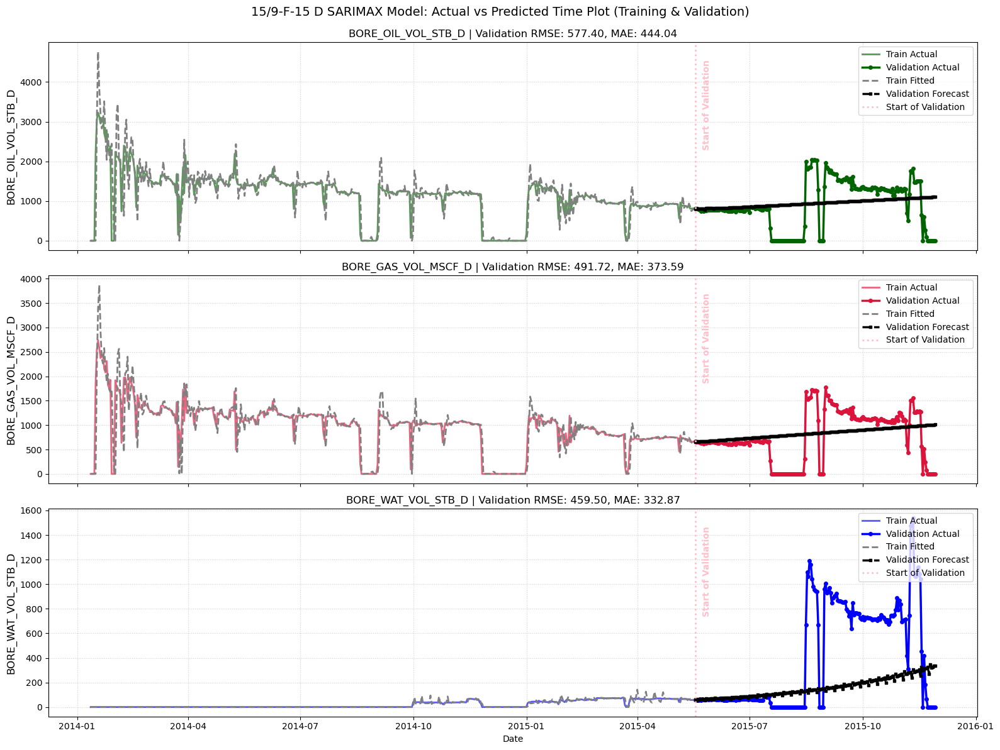

In [72]:
#Time plot


# ploting train and validation
data=pd.concat([train_data, val_data])

# 1. Create a single figure with 3 rows of subplots sharing the same X-axis (Dates)
fig, axes = plt.subplots(nrows=3, ncols=1, figsize=(16, 12), sharex=True)

oil_test_actual_plot=plot_train_val_predictions_time(
                                                    train_data=train_data,
                                                    val_data=val_data,
                                                    phase_string="BORE_OIL_VOL_STB_D",
                                                    model=models_dict["15/9-F-15 D_BORE_OIL_VOL_STB_D_sarima_model"],
                                                    log_transform=False,
                                                    transform_type="log1p",
                                                    ax=axes[0],
                                                    start_of_val_date=start_of_val_date )
gas_test_actual_plot=plot_train_val_predictions_time(
                                                    train_data=train_data,
                                                    val_data=val_data,
                                                    phase_string="BORE_GAS_VOL_MSCF_D",
                                                    model=models_dict["15/9-F-15 D_BORE_GAS_VOL_MSCF_D_sarima_model"],
                                                    log_transform=False,
                                                    transform_type="log1p",
                                                    ax=axes[1],
                                                    start_of_val_date=start_of_val_date )
water_test_actual_plot=plot_train_val_predictions_time(
                                                    train_data=train_data,
                                                    val_data=val_data,
                                                    phase_string="BORE_WAT_VOL_STB_D",
                                                    model=models_dict["15/9-F-15 D_BORE_WAT_VOL_STB_D_sarima_model_log"],
                                                    log_transform=True,
                                                    transform_type="log1p",
                                                    ax=axes[2],
                                                    start_of_val_date=start_of_val_date)

# 5. Format and save the combined master plot
axes[-1].set_xlabel('Date')  # Label the bottom X-axis
fig.suptitle(f'{df_5["NPD_WELL_BORE_NAME"].iloc[0]} SARIMAX Model: Actual vs Predicted Time Plot (Training & Validation)', fontsize=14, y=0.99)
plt.tight_layout()

# Save the unified plot directly to disk
safe_well_name = str(df_5["NPD_WELL_BORE_NAME"].iloc[0]).replace('/', '-')
file_path = f'pictures/{safe_well_name}_sarima_predictions_time_plot.png'
fig.savefig(file_path, dpi=300, bbox_inches='tight')
plt.show()

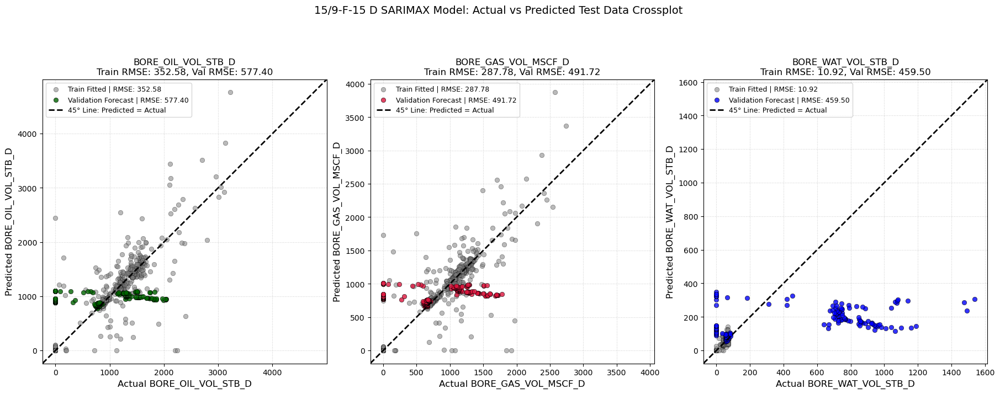

In [73]:
#Prediction vs actual plot


# ploting train and validation
data=pd.concat([train_data,val_data])

# 1. Create a single figure with 3 rows of subplots sharing the same X-axis (Dates)
fig, axes = plt.subplots(nrows=1, ncols=3, figsize=(18, 8), sharex=False,constrained_layout=True)

oil_test_actual_plot=plot_train_val_actual_vs_predicted_crossplot(
                                              train_data,
                                              val_data,
                                              phase_string="BORE_OIL_VOL_STB_D" ,# 'BORE_OIL_VOL_STB_D', BORE_GAS_VOL_MSCF_D, BORE_WAT_VOL_STB_D,
                                              model=models_dict["15/9-F-15 D_BORE_OIL_VOL_STB_D_sarima_model"],
                                              val_exog=None,
                                              log_transform=False,
                                              transform_type="log1p",
                                              ax=axes[0]
                                                       )
gas_test_actual_plot=plot_train_val_actual_vs_predicted_crossplot(
                                              train_data,
                                              val_data,
                                              phase_string="BORE_GAS_VOL_MSCF_D" ,# 'BORE_OIL_VOL_STB_D', BORE_GAS_VOL_MSCF_D, BORE_WAT_VOL_STB_D,
                                              model=models_dict['15/9-F-15 D_BORE_GAS_VOL_MSCF_D_sarima_model'],
                                              val_exog=None,
                                              log_transform=False,
                                              transform_type="log1p", 
                                              ax=axes[1]
                                                       )
water_test_actual_plot=plot_train_val_actual_vs_predicted_crossplot(
                                              train_data,
                                              val_data,
                                              phase_string="BORE_WAT_VOL_STB_D" ,# 'BORE_OIL_VOL_STB_D', BORE_GAS_VOL_MSCF_D, BORE_WAT_VOL_STB_D,
                                              model=models_dict['15/9-F-15 D_BORE_WAT_VOL_STB_D_sarima_model_log'],
                                              val_exog=None,
                                              log_transform=True,
                                              transform_type="log1p", 
                                              ax=axes[2]
                                                         )

# 5. Format and save the combined master plot
#axes[-1].set_xlabel('Date')  # Label the bottom X-axis
fig.suptitle(f'{df_5["NPD_WELL_BORE_NAME"].iloc[0]} SARIMAX Model: Actual vs Predicted Test Data Crossplot ', fontsize=14, y=0.99)
#plt.tight_layout()

# Save the unified plot directly to disk
safe_well_name = str(df_5["NPD_WELL_BORE_NAME"].iloc[0]).replace('/', '-')
file_path = f'pictures/{safe_well_name}_sarima_predictions_crossplot.png'
fig.savefig(file_path, dpi=300, bbox_inches='tight')
plt.show()

# Export model out

In [74]:
import joblib

joblib.dump(models_dict, "models_dict.joblib")
joblib.dump(order_dict, "order_dict.joblib")

['order_dict.joblib']

In [ ]:
# load
#models_dict = joblib.load("models_dict.joblib")
#order_dict = joblib.load("order_dict.joblib")